In [1]:
# This notebook has everything you need to create datasets/dataloaders, create models, hyperparameter tune with optuna 
# train a model and evaluate it

In [1]:
#using DeepActiNet and an LSTM
modelType = "ActiNetLSTM"

In [2]:
modelTypedict = {"ManualGRU": ["Manual", "GRU"], "ManualLSTM": ["Manual", "LSTM"], "ActiNetGRU": ["ActiNet", "GRU"], "ActiNetLSTM": ["ActiNet", "LSTM"]}
acc_preprocess = modelTypedict[modelType][0]
RNN_type = modelTypedict[modelType][1]

In [3]:
import os
import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset, random_split
from torchmetrics.classification import MulticlassCohenKappa
from IPython.display import clear_output
import optuna
import pytorch_lightning as pl
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import accuracy_score, cohen_kappa_score, roc_auc_score, confusion_matrix
import seaborn as sns
from collections import Counter
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint
from pytorch_lightning.loggers.wandb import WandbLogger
import wandb
from x_transformers import ContinuousTransformerWrapper, Encoder
torch.set_float32_matmul_precision('medium')
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
from wearables import Wearables
import time

/ext3/miniforge3/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Set up Datasets

In [4]:
data_dir = '/scratch/npr264/BioDeepL/dreamt/physionet.org/files/dreamt/2.0.0/data_64Hz'

In [5]:
participant_info_df = pd.read_csv('/scratch/npr264/BioDeepL/dreamt/physionet.org/files/dreamt/2.0.0/participant_info.csv')
subjects_all = participant_info_df['SID']

subjects_all_shuffled = participant_info_df['SID'].sample(frac=1, random_state=42).reset_index(drop=True)
subjects_train = subjects_all_shuffled[:int(len(subjects_all_shuffled)*0.8)]
subjects_val = subjects_all_shuffled[int(len(subjects_all_shuffled)*0.8):int(len(subjects_all_shuffled)*0.9)]
subjects_test = subjects_all_shuffled[int(len(subjects_all_shuffled)*0.9):]
print(f"number of subjects in train: {len(subjects_train)}")
print(f"number of subjects in val: {len(subjects_val)}")
print(f"number of subjects in test: {len(subjects_test)}")

number of subjects in train: 80
number of subjects in val: 10
number of subjects in test: 10


In [16]:
non_acc_freq = 0.2
acc_freq = 32
chunk_duration = 6000 # chunk duration in seconds
chunk_stride = 3000
train_dataset_mixed = Wearables(subjects_list=subjects_train,
                                 data_dir=data_dir,
                                 chunk_duration=chunk_duration,
                                 chunk_stride=chunk_stride,
                                 downsample_freq=non_acc_freq,
                                 acc_freq=acc_freq,
                                 debug=False)
print(f"Total samples in train dataset: {len(train_dataset_mixed)}")
val_dataset_mixed = Wearables(subjects_list=subjects_val,
                                 data_dir=data_dir,
                                 chunk_duration=chunk_duration,
                                 chunk_stride=chunk_stride,
                                 downsample_freq=non_acc_freq, 
                                 acc_freq=acc_freq,
                                 debug=False)
print(f"Total samples in val dataset: {len(val_dataset_mixed)}")
test_dataset_mixed = Wearables(subjects_list=subjects_test,
                                 data_dir=data_dir,
                                 chunk_duration=chunk_duration,
                                 chunk_stride=chunk_stride,
                                 downsample_freq=non_acc_freq,
                                 acc_freq=acc_freq,
                                 debug=False)
print(f"Total samples in test dataset: {len(test_dataset_mixed)}")

Total samples in train dataset: 202
Total samples in val dataset: 28
Total samples in test dataset: 27


In [ ]:
#OPTIONAL, save datasets as they take a long time to create
torch.save(train_dataset_mixed, f'/home/npr264/DeepLearning/project/cleaned/datasets/trainset_{chunk_duration}s.pt')
torch.save(val_dataset_mixed, f'/home/npr264/DeepLearning/project/cleaned/datasets/valset_{chunk_duration}s.pt')
torch.save(test_dataset_mixed, f'/home/npr264/DeepLearning/project/cleaned/datasets/testset_{chunk_duration}s.pt')

### Loading in and class weights

In [ ]:
chunk_duration = 6000
train_dataset_mixed = torch.load(f'/home/npr264/DeepLearning/project/cleaned/datasets/trainset_{chunk_duration}s.pt')
val_dataset_mixed = torch.load(f'/home/npr264/DeepLearning/project/cleaned/datasets/valset_{chunk_duration}s.pt')

In [7]:
# get class weights for weighted loss
all_labels = []
for batch in DataLoader(train_dataset_mixed, batch_size=1):
    labels = batch[2].numpy()
    all_labels.extend(labels.flatten())
all_labels = np.array(all_labels)
valid_labels = all_labels[all_labels != -1]
classes = np.arange(4)
class_counts = Counter(valid_labels)
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=valid_labels
)
print(f"Class counts: {class_counts}")
print(f"Class weights: {class_weights}")

Class counts: Counter({np.int64(1): 155342, np.int64(0): 53092, np.int64(3): 24240, np.int64(2): 9372})
Class weights: [1.13974798 0.38953728 6.45662612 2.49634901]


In [8]:
weight_tensor = torch.tensor(class_weights, dtype=torch.float32)

### Model Definitions

#### Acc Models

In [9]:
#"Manual" model
def extract_features(acc, window_size=160):
    # acc: [batch_size, seq_len, 3]
    batch_size, seq_len, dims = acc.shape
    assert seq_len % window_size == 0, "seq_len must be divisible by window_size"

    # Reshape: [batch_size, seq_len // window_size, window_size, 3]
    acc = acc.view(batch_size, seq_len // window_size, window_size, dims)

    # Compute features along the window dimension (dim=2)
    mean = acc.mean(dim=2)
    abs_mean = acc.abs().mean(dim=2)
    max_val = acc.max(dim=2).values
    min_val = acc.min(dim=2).values
    range_val = max_val - min_val
    var = acc.var(dim=2, unbiased=False)
    rms = torch.sqrt((acc ** 2).mean(dim=2))
    iqr = torch.quantile(acc, 0.75, dim=2) - torch.quantile(acc, 0.25, dim=2)
    q25 = torch.quantile(acc, 0.25, dim=2)
    q50 = torch.quantile(acc, 0.50, dim=2)
    q75 = torch.quantile(acc, 0.75, dim=2)

    # Concatenate all features along the last dimension
    features = torch.cat([
        mean, abs_mean, max_val, min_val, range_val, var, rms, iqr, q25, q50, q75
    ], dim=-1)  # shape: [batch_size, seq_len // 160, 33]

    return features

In [10]:
class DeepACTINeT(nn.Module):
    def __init__(self, cnn_output_channels, dropout=0.25):
        super(DeepACTINeT, self).__init__()
        # Define the layers as per the structure provided
        self.conv1 = nn.Conv1d(in_channels=3, out_channels=16, kernel_size=512, stride=2)
        self.conv2 = nn.Conv1d(in_channels=16, out_channels=16, kernel_size=256, stride=2)
        self.conv3 = nn.Conv1d(in_channels=16, out_channels=16, kernel_size=256, stride=2)
        self.conv4 = nn.Conv1d(in_channels=16, out_channels=cnn_output_channels, kernel_size=32, stride=2)
        
        self.dropout = nn.Dropout(dropout)
        self.batch_norm1 = nn.BatchNorm1d(16)
        self.batch_norm2 = nn.BatchNorm1d(16)
        self.batch_norm3 = nn.BatchNorm1d(16)
        self.batch_norm4 = nn.BatchNorm1d(cnn_output_channels)
    
    def forward(self, x):
        assert not torch.isnan(x).any(), "NaN detected in CNN input"
        print(x.shape)
        x = x.permute(0,2, 1) #flip channels and num samples [batch, ch, num samples]

        initial_samples = x.shape[2]
        #you want to end up with one every 5 seconds 
        final_samples = initial_samples // (32*5)

        x = F.relu(self.conv1(x))
        #print(f"Input shape after conv1: {x.shape}")
        x = self.dropout(x)
        #print(f"Input shape after, dropout: {x.shape}")
        x = self.batch_norm1(x)
        #print(f"Input shape after conv1,dropout,batchnorm: {x.shape}")
        x = F.max_pool1d(x, kernel_size=2, stride = 2)
        #print(f"Input shape after maxpool: {x.shape}")
        
        x = F.relu(self.conv2(x))
        x = self.dropout(x)
        x = self.batch_norm2(x)
        #print(f"Input shape after conv2: {x.shape}")
        
        x = F.relu(self.conv3(x))
        x = self.dropout(x)
        x = self.batch_norm3(x)
        #print(f"Input shape after conv3: {x.shape}")
        
        x = F.max_pool1d(x, kernel_size=2, stride = 2)
        #print(f"Input shape after maxpool: {x.shape}")
        
        x = F.relu(self.conv4(x))
        x = self.dropout(x)
        x = self.batch_norm4(x)
        #print(f"before avg pooling shape: {x.shape}")

        x = F.adaptive_avg_pool1d(x, final_samples)
        #print(f"Final output shape: {x.shape}")
        
        return x

#### LSTM model 

In [11]:
#acc_preprocess = "ActiNet" or "Manual"
class SleepStager(pl.LightningModule):
    def __init__(self,
                non_acc_dim:         int,
                acc_preprocess = acc_preprocess,
                RNN_type = RNN_type,
                bidirectional = True,
                cnn_output_channels: int = 16,
                dropout_embed:   float = 0.25,
                dropout_rnn: float = 0.25,
                dropout_hidden2: float= 0.25,
                pre_rnn_embedding_size: int = 16,
                rnn_hidden_size:   int = 128,
                hidden_size2:       int = 64,
                num_sleep_stages:   int = 4,
                lr:                  float = 1e-3,
                weight_tensor:      torch.Tensor = None,
                debug:            bool = False):
        super().__init__()
        if acc_preprocess == "ActiNet":
            self.mode = "ActiNet"
            self.acc_processing = DeepACTINeT(cnn_output_channels)
            self.acc_channels = cnn_output_channels
        elif acc_preprocess == "Manual":
            self.mode = "Manual"
            self.acc_processing = extract_features
            self.acc_channels = 33
        else:
            raise ValueError("ActiNet or Manual are the only valid options")
        
        self.RNN_type = RNN_type
        self.non_acc_dim = non_acc_dim
        self.embeddingLayer = nn.Linear(self.non_acc_dim, pre_rnn_embedding_size)
        self.cnn_output_channels = cnn_output_channels

        #add non linearity to the bvp and temp before lstm 
        self.pre_rnn_embedding_size = pre_rnn_embedding_size

        self.rnn_hidden_size = rnn_hidden_size
        self.hidden_size2 = hidden_size2

        self.dropout_embed = nn.Dropout(p=dropout_embed)
        self.dropout_rnn = dropout_rnn
        self.dropout_hidden2 = nn.Dropout(p=dropout_hidden2)

        self.rnn_input_size = self.pre_rnn_embedding_size + self.acc_channels
        self.rnn_hidden_size = rnn_hidden_size

        if self.RNN_type == "GRU":
            rnn = nn.GRU
        elif self.RNN_type == "LSTM":
            rnn = nn.LSTM
        else:
            raise Exception("[Error] Unknown RnnType. Currently supported: GRU,LSTM")

        self.rnn = rnn(input_size=self.rnn_input_size,
                            hidden_size=self.rnn_hidden_size,
                            dropout = self.dropout_rnn,
                            num_layers = 2,
                            bias = True,
                            batch_first=False,
                            bidirectional = True)
       
        self.hidden2 = nn.Linear(rnn_hidden_size*2, hidden_size2)
        classifier_in = hidden_size2
        self.classifier = nn.Linear(classifier_in, num_sleep_stages)
    
        self.train_criterion = nn.CrossEntropyLoss(weight=weight_tensor, ignore_index=-1)
        self.val_criterion = nn.CrossEntropyLoss(weight=weight_tensor, ignore_index=-1)
        
        self.lr        = lr
        self.debug      = debug
        self.kappa = MulticlassCohenKappa(num_classes=num_sleep_stages)

    def forward(self, acc, non_acc):
        """
        non_acc: (batch, non_acc_length, non_acc_dim)
        acc:     (batch, acc_length)  or  (batch, acc_length, 1)
        returns:
          y_hat (output_length, batch, num_sleep_stages)
        """
        # ensure ACC has a channel dim
        if acc.dim() == 2:
            acc = acc.unsqueeze(-1)          # now (batch, T, 1)
        
        # 1) ACC → CNN → (batch, num_cnn_feats, cnn_output_length)
        acc_feats = self.acc_processing(acc)
        
        if self.debug:
            print(f"[DEBUG] ACC CNN output shape: {acc_feats.shape}") # (batch, num_cnn_feats, cnn_output_length)
            print(f"[DEBUG] NON_ACC input shape: {non_acc.shape}") # (batch, non_acc_length, non_acc_dim)
        
        #embed the non_acc data 
        emb_non_acc = self.embeddingLayer(non_acc)
        emb_non_acc = self.dropout_embed(emb_non_acc)
        #emb_non_acc = non_acc
        # 3) build LSTM input: (T', batch, feature_dim)
        if self.mode == "ActiNet":
            a = acc_feats.permute(2, 0, 1)     
        elif self.mode == "Manual":
            a = acc_feats.permute(1,0,2)
        b = emb_non_acc.permute(1, 0, 2)       

        if self.debug:
            print(f"[DEBUG] ACC CNN reshaped shape: {a.shape}") 
            print(f"[DEBUG] NON_ACC reshaped shape: {b.shape}")
       
        rnn_in = torch.cat([a, b], dim = 2)    # (lstm_seq_len, batch, C_cnn + D_nonacc)
        # without batch_first = true, LSTM input shape is (seq_len, batch_size, features)


        if self.debug:
            print(f"[DEBUG] RNN input shape: {rnn_in.shape}")
            print(f"[DEBUG] RNN hidden size: {self.rnn_hidden_size}")
    
        output,_ = self.rnn(rnn_in)
        output = self.hidden2(output)
        output = self.dropout_hidden2(output)
        if self.debug:
            print(f"[DEBUG] hidden2 shape: {output.shape}")
        y_hat = self.classifier(output)     # (lstm_seq_len, batch, num_sleep_stages)
        if self.debug:
            print(f"[DEBUG] Classifier output shape: {y_hat.shape}")
        return y_hat
            
    def training_step(self, batch, batch_idx):
        non_acc, acc, labels = batch
        '''
        non_acc: (batch, non_acc_length, non_acc_dim)
        acc:     (batch, acc_length)  or  (batch, acc_length, 1)
        labels:  (batch, non_acc_length)
        '''
        y_hat = self(acc, non_acc)            # (lstm_seq_len, batch, num_sleep_stages)
        y_hat = y_hat.permute(1, 0, 2)        # (batch, lstm_seq_len, num_sleep_stages)
    
        # flatten
        batch_size, output_length, num_sleep_stages = y_hat.shape
        y_hat_flat = y_hat.reshape(batch_size * output_length, num_sleep_stages)
        labels_flat  = labels.reshape(batch_size * output_length)
        
        # calculate loss
        loss = self.train_criterion(y_hat_flat, labels_flat)
    
        self.log('train_loss', loss, prog_bar=True, on_step=True, on_epoch=True)
        return loss
    
    def validation_step(self, batch, batch_idx):
        non_acc, acc, labels = batch
            
        '''
        non_acc: (batch, non_acc_length, non_acc_dim)
        acc:     (batch, acc_length)  or  (batch, acc_length, 1)
        labels:  (batch, non_acc_length)
        '''
        y_hat = self(acc, non_acc)            # (lstm_seq_len, batch, num_sleep_stages)
        y_hat = y_hat.permute(1, 0, 2)        # (batch, lstm_seq_len, num_sleep_stages)
    
        # flatten
        batch_size, output_length, num_sleep_stages = y_hat.shape
        y_hat_flat = y_hat.reshape(batch_size * output_length, num_sleep_stages)
        labels_flat  = labels.reshape(batch_size * output_length)
        
        # calculate loss
        loss = self.val_criterion(y_hat_flat, labels_flat)
    
        # calculate accuracy
        predictions = torch.argmax(y_hat_flat, dim=1)
        mask = labels_flat != -1
        masked_preds = predictions[mask]
        masked_labels = labels_flat[mask]
        if masked_labels.numel() > 0:
            acc = (masked_preds == masked_labels).float().mean().item()
        else:
            acc = 0.0
    
        # calculate cohen's kappa
        mask = labels_flat != -1
        y_valid = labels_flat[mask]
        preds_valid = predictions[mask]
        if y_valid.numel() > 0:
            ckappa = self.kappa.update(preds_valid, y_valid)
        else:
            ckappa = torch.tensor(0.0, device=self.device)

        # log metrics
        self.log("val_loss", loss, prog_bar=True)
        self.log("val_acc",  acc,  prog_bar=True)
        
        return {"val_loss": loss, "val_acc": acc}
        
    def on_validation_epoch_end(self):
        k = self.kappa.compute()
        self.log("val_cohen_kappa", torch.nan_to_num(k,0.0), prog_bar=True)
        self.kappa.reset()
    
    def configure_optimizers(self):
        optimizer = torch.optim.AdamW(self.parameters(), lr=self.lr, weight_decay=1e-4)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='min', factor=0.3, patience=3, verbose=True, min_lr=1e-6
        )
        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'monitor': 'val_loss',  # must match your validation metric
                'interval': 'epoch',
                'frequency': 1
            }
        }


### Optuna

In [ ]:
accelerator = "gpu" if torch.cuda.is_available() else "cpu"
def objective(trial, acc_preprocess, RNN_type, modelType):
    acc_preprocess = acc_preprocess
    RNN_type = RNN_type
    
    # Dropouts
    dropout_embed = trial.suggest_float('dropout_embed', 0.1, 0.55)
    dropout_rnn = trial.suggest_float('dropout_rnn', 0.1, 0.55)
    dropout_hidden2 = trial.suggest_float('dropout_hidden2', 0.1, 0.55)
    # dropout_hidden2 = 0.48
    
    #label_smoothing = trial.suggest_float("label_smoothing", 0.0, 0.1)
    #Sizes
    pre_rnn_size = trial.suggest_categorical("pre_rnn_embedding_size", [4, 8, 16, 32, 64])
    rnn_hidden_size = trial.suggest_categorical("rnn_hidden_size", [32, 64, 128, 256, 512, 1024])
    hidden_size2 = trial.suggest_categorical("hidden_size2", [4, 8, 16, 32, 64])

    #other
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
    batch_size = trial.suggest_categorical("batch_size", [2,4, 8, 16,32,64,128])

    #bidirectional = trial.suggest_categorical("bidirectional", [True, False])
    #Conditional logic for acc_preprocess-specific parameters
    if acc_preprocess == "ActiNet":
        cnn_output_channels = trial.suggest_categorical("cnn_output_channels", [8, 16, 32, 64, 128])
        cnn_name_piece = f"_cnn{cnn_output_channels}"
    else:
        cnn_output_channels = None  # Not relevant for "Manual"
        cnn_name_piece = ""
    
    size_piece = f"prernn{pre_rnn_size}_rnn{rnn_hidden_size}_hidden{hidden_size2}"
    other_piece = f"lr{learning_rate}_batchsize{batch_size}"
    dropout_piece = f"dropoutembed{dropout_embed}_dropoutRNN{dropout_rnn}_dropouthidden2{dropout_hidden2}"
    name = size_piece+other_piece+dropout_piece+cnn_name_piece
    
    wandb_logger = WandbLogger(name, project = f'{modelType}2')
    #wandb.define_metric("best_val_loss", summary="min")
    checkpoint_callback = ModelCheckpoint(
    monitor='val_loss',
    dirpath=f'/scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/{trial.number}/',
    filename='best-checkpoint',
    save_top_k=1,
    mode='min'
    )
    early_stop_callback = EarlyStopping(
    monitor='val_loss',
    patience=4,
    verbose=True,
    mode='min'
    )
    trainer = pl.Trainer(
    max_epochs=20,
    devices=1,
    accelerator=accelerator,
    logger=wandb_logger,
    callbacks=[checkpoint_callback, early_stop_callback],
    log_every_n_steps=2,
    )
    model = SleepStager(non_acc_dim = 5,
                        acc_preprocess = acc_preprocess,
                        RNN_type = RNN_type,
                        dropout_embed = dropout_embed,
                        dropout_rnn = dropout_rnn,
                        dropout_hidden2 = dropout_hidden2,
                        pre_rnn_embedding_size= pre_rnn_size,
                        rnn_hidden_size= rnn_hidden_size,
                        hidden_size2= hidden_size2,
                        lr = learning_rate,
                        cnn_output_channels = cnn_output_channels,
                        weight_tensor=weight_tensor.to(device),
                    debug= False)
    # train_dataset_optuna, val_dataset_optuna = get_datasets(segment_len, segment_len/2)
    train_loader = DataLoader(train_dataset_mixed, batch_size=batch_size, shuffle=True, num_workers = 8)
    val_loader = DataLoader(val_dataset_mixed, batch_size=batch_size, shuffle=False, num_workers = 8)
    trainer.fit(model, train_loader, val_loader)
    

    #we will pull the best model, even if it overtrained a little, so we need to go pull that best model to understand its performance
    best_model_path = checkpoint_callback.best_model_path
    print(f"Best model path: {best_model_path}")
    
    # Load the model
    best_model = SleepStager.load_from_checkpoint(best_model_path,non_acc_dim = 5,
                            acc_preprocess = acc_preprocess,
                            RNN_type = RNN_type,
                            dropout_embed = dropout_embed,
                            dropout_rnn = dropout_rnn,
                            dropout_hidden2 = dropout_hidden2,
                            pre_rnn_embedding_size= pre_rnn_size,
                            rnn_hidden_size= rnn_hidden_size,
                            hidden_size2= hidden_size2,
                            lr = learning_rate,
                            cnn_output_channels = cnn_output_channels,
                            weight_tensor=weight_tensor.to(device),
                        debug= False)
    # Evaluate the best model
    trainer_best = pl.Trainer(devices=1, accelerator=accelerator)
    val_result = trainer_best.validate(best_model, val_loader, verbose=False)
    val_loss = val_result[0]["val_loss"]
    #log needed things
    wandb_logger.experiment.config.update(trial.params)
    wandb_logger.experiment.config.update({"trial_number": trial.number})
    wandb_logger.experiment.log({"best_val_loss": val_loss})
    wandb.finish()

    return val_loss

study = optuna.create_study(direction="minimize")
study.optimize(lambda trial: objective(trial, acc_preprocess, RNN_type, modelType), n_trials=500)
best_trial = study.best_trial
print("Best trial:")
print(f"  Value: {best_trial.value}")
print("  Params:")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

[I 2025-04-29 21:56:55,564] A new study created in memory with name: no-name-c7cbe885-f355-415c-aabd-548454c8a25a
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/0 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 172 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 33.9 M | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 36     | train
7 | 

Epoch 0: 100%|██████████| 2/2 [00:07<00:00,  0.26it/s, v_num=1jm8, train_loss_step=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 2/2 [00:08<00:00,  0.23it/s, v_num=1jm8, train_loss_step=1.370, val_loss=1.310, val_acc=0.109, val_cohen_kappa=0.0303, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.306


Epoch 1: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=1jm8, train_loss_step=1.370, val_loss=1.310, val_acc=0.109, val_cohen_kappa=0.0303, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 2/2 [00:09<00:00,  0.21it/s, v_num=1jm8, train_loss_step=1.370, val_loss=1.300, val_acc=0.273, val_cohen_kappa=0.0305, train_loss_epoch=1.380]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.300


Epoch 2: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=1jm8, train_loss_step=1.350, val_loss=1.300, val_acc=0.273, val_cohen_kappa=0.0305, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 2/2 [00:09<00:00,  0.21it/s, v_num=1jm8, train_loss_step=1.350, val_loss=1.270, val_acc=0.210, val_cohen_kappa=0.0614, train_loss_epoch=1.350]

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 1.269


Epoch 3: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=1jm8, train_loss_step=1.300, val_loss=1.270, val_acc=0.210, val_cohen_kappa=0.0614, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=1jm8, train_loss_step=1.330, val_loss=1.550, val_acc=0.121, val_cohen_kappa=0.0245, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=1jm8, train_loss_step=1.260, val_loss=1.360, val_acc=0.160, val_cohen_kappa=0.0453, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=1jm8, train_loss_step

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.269. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 2/2 [00:09<00:00,  0.22it/s, v_num=1jm8, train_loss_step=1.290, val_loss=1.410, val_acc=0.206, val_cohen_kappa=0.081, train_loss_epoch=1.280]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/0/best-checkpoint-v19.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▂▂▂▃▃▃▅▅▅▆▆▆▇▇▇███
train_loss_epoch,█▇▅▄▃▂▁
train_loss_step,██▇▄▆▁▃
trainer/global_step,▁▁▁▂▂▂▃▃▃▅▅▅▆▆▆▇▇▇████
val_acc,▁█▅▂▃▃▅
val_cohen_kappa,▂▂▆▁▄▄█
val_loss,▂▂▁█▃▄▅
best_val_loss,1.26875
epoch,6
train_loss_epoch,1.27825


[I 2025-04-29 21:58:08,993] Trial 0 finished with value: 1.2687504291534424 and parameters: {'dropout_embed': 0.44061294923513095, 'dropout_rnn': 0.5137360871522518, 'dropout_hidden2': 0.2657336740740996, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 1024, 'hidden_size2': 8, 'learning_rate': 0.0007239631580208456, 'batch_size': 128, 'cnn_output_channels': 32}. Best is trial 0 with value: 1.2687504291534424.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/1 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 145 K  | train
5 | hidden2         | Linear               | 516    | train
6 | classifier      | Linear               | 20     | train
7 | 

Epoch 0: 100%|██████████| 2/2 [00:02<00:00,  0.76it/s, v_num=85g4, train_loss_step=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 2/2 [00:03<00:00,  0.57it/s, v_num=85g4, train_loss_step=1.410, val_loss=1.370, val_acc=0.112, val_cohen_kappa=7.63e-6, train_loss_epoch=1.410]

Metric val_loss improved. New best score: 1.369


Epoch 1: 100%|██████████| 2/2 [00:03<00:00,  0.62it/s, v_num=85g4, train_loss_step=1.400, val_loss=1.370, val_acc=0.112, val_cohen_kappa=7.63e-6, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 2/2 [00:03<00:00,  0.61it/s, v_num=85g4, train_loss_step=1.400, val_loss=1.370, val_acc=0.112, val_cohen_kappa=3.1e-6, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 2/2 [00:03<00:00,  0.63it/s, v_num=85g4, train_loss_step=1.400, val_loss=1.370, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 2/2 [00:03<00:00,  0.63it/s, v_num=85g4, train_loss_step

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.369. Signaling Trainer to stop.


Epoch 4: 100%|██████████| 2/2 [00:03<00:00,  0.50it/s, v_num=85g4, train_loss_step=1.390, val_loss=1.370, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/1/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.48it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▃▃▃▅▅▅▆▆▆███
train_loss_epoch,█▆▄▁▂
train_loss_step,█▅▄▅▁
trainer/global_step,▁▁▁▃▃▃▅▅▅▆▆▆████
val_acc,▁▁▁▁▁
val_cohen_kappa,█▄▁▁▁
val_loss,▁▆██▇
best_val_loss,1.36899
epoch,4
train_loss_epoch,1.40616


[I 2025-04-29 21:58:32,403] Trial 1 finished with value: 1.3689910173416138 and parameters: {'dropout_embed': 0.33779076698882227, 'dropout_rnn': 0.3038942298693231, 'dropout_hidden2': 0.5442238965716517, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 64, 'hidden_size2': 4, 'learning_rate': 2.0718512499389634e-05, 'batch_size': 128, 'cnn_output_channels': 16}. Best is trial 0 with value: 1.2687504291534424.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/2 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 34.2 M | train
5 | hidden2         | Linear               | 65.6 K | train
6 | classifier      | Linear               | 132    | train
7 | 

Epoch 0: 100%|██████████| 2/2 [00:07<00:00,  0.26it/s, v_num=qluv, train_loss_step=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 2/2 [00:08<00:00,  0.22it/s, v_num=qluv, train_loss_step=1.330, val_loss=1.690, val_acc=0.103, val_cohen_kappa=0.0127, train_loss_epoch=1.370]

Metric val_loss improved. New best score: 1.695


Epoch 1: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=qluv, train_loss_step=1.360, val_loss=1.690, val_acc=0.103, val_cohen_kappa=0.0127, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 2/2 [00:09<00:00,  0.21it/s, v_num=qluv, train_loss_step=1.360, val_loss=1.340, val_acc=0.237, val_cohen_kappa=0.0436, train_loss_epoch=1.450]

Metric val_loss improved by 0.358 >= min_delta = 0.0. New best score: 1.337


Epoch 2: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=qluv, train_loss_step=1.300, val_loss=1.340, val_acc=0.237, val_cohen_kappa=0.0436, train_loss_epoch=1.450]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 2/2 [00:09<00:00,  0.21it/s, v_num=qluv, train_loss_step=1.300, val_loss=1.250, val_acc=0.193, val_cohen_kappa=0.0761, train_loss_epoch=1.330]

Metric val_loss improved by 0.087 >= min_delta = 0.0. New best score: 1.251


Epoch 3: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=qluv, train_loss_step=1.260, val_loss=1.250, val_acc=0.193, val_cohen_kappa=0.0761, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=qluv, train_loss_step=1.270, val_loss=1.270, val_acc=0.329, val_cohen_kappa=0.107, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=qluv, train_loss_step=1.220, val_loss=1.410, val_acc=0.243, val_cohen_kappa=0.0865, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 2/2 [00:08<00:00,  0.24it/s, v_num=qluv, train_loss_step=

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.251. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 2/2 [00:09<00:00,  0.21it/s, v_num=qluv, train_loss_step=1.230, val_loss=1.390, val_acc=0.280, val_cohen_kappa=0.125, train_loss_epoch=1.230]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/2/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▂▂▂▃▃▃▅▅▅▆▆▆▇▇▇███
train_loss_epoch,▅█▄▂▂▂▁
train_loss_step,▇█▅▃▄▁▁
trainer/global_step,▁▁▁▂▂▂▃▃▃▅▅▅▆▆▆▇▇▇████
val_acc,▁▅▄█▅▅▆
val_cohen_kappa,▁▃▅▇▆▆█
val_loss,█▂▁▁▄▂▃
best_val_loss,1.25077
epoch,6
train_loss_epoch,1.23031


[I 2025-04-29 21:59:47,460] Trial 2 finished with value: 1.2507728338241577 and parameters: {'dropout_embed': 0.4016988453426442, 'dropout_rnn': 0.14622668684923373, 'dropout_hidden2': 0.2225786163370524, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 1024, 'hidden_size2': 32, 'learning_rate': 0.0018481803439287037, 'batch_size': 128, 'cnn_output_channels': 16}. Best is trial 2 with value: 1.2507728338241577.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/3 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 172 K  | train
1 | embeddingLayer  | Linear               | 24     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 151 K  | train
5 | hidden2         | Linear               | 1.0 K  | train
6 | classifier      | Linear               | 36     | train
7 | 

Epoch 0: 100%|██████████| 4/4 [00:02<00:00,  1.60it/s, v_num=o0zv, train_loss_step=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 4/4 [00:03<00:00,  1.16it/s, v_num=o0zv, train_loss_step=1.380, val_loss=1.360, val_acc=0.0824, val_cohen_kappa=0.00557, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.362


Epoch 1: 100%|██████████| 4/4 [00:03<00:00,  1.25it/s, v_num=o0zv, train_loss_step=1.380, val_loss=1.360, val_acc=0.0824, val_cohen_kappa=0.00557, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 4/4 [00:04<00:00,  1.00it/s, v_num=o0zv, train_loss_step=1.380, val_loss=1.340, val_acc=0.0888, val_cohen_kappa=0.012, train_loss_epoch=1.390]  

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 1.336


Epoch 2: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, v_num=o0zv, train_loss_step=1.370, val_loss=1.340, val_acc=0.0888, val_cohen_kappa=0.012, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 4/4 [00:04<00:00,  0.98it/s, v_num=o0zv, train_loss_step=1.370, val_loss=1.310, val_acc=0.111, val_cohen_kappa=0.0209, train_loss_epoch=1.370]

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 1.315


Epoch 3: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, v_num=o0zv, train_loss_step=1.350, val_loss=1.310, val_acc=0.111, val_cohen_kappa=0.0209, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 4/4 [00:03<00:00,  1.31it/s, v_num=o0zv, train_loss_step=1.340, val_loss=1.320, val_acc=0.119, val_cohen_kappa=0.0287, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s, v_num=o0zv, train_loss_step=1.340, val_loss=1.300, val_acc=0.137, val_cohen_kappa=0.0382, train_loss_epoch=1.340]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.303


Epoch 5: 100%|██████████| 4/4 [00:03<00:00,  1.27it/s, v_num=o0zv, train_loss_step=1.350, val_loss=1.300, val_acc=0.137, val_cohen_kappa=0.0382, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 4/4 [00:03<00:00,  1.00it/s, v_num=o0zv, train_loss_step=1.350, val_loss=1.270, val_acc=0.155, val_cohen_kappa=0.0561, train_loss_epoch=1.330]

Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 1.269


Epoch 6: 100%|██████████| 4/4 [00:03<00:00,  1.24it/s, v_num=o0zv, train_loss_step=1.420, val_loss=1.270, val_acc=0.155, val_cohen_kappa=0.0561, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 4/4 [00:04<00:00,  0.98it/s, v_num=o0zv, train_loss_step=1.420, val_loss=1.240, val_acc=0.158, val_cohen_kappa=0.061, train_loss_epoch=1.300] 

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 1.240


Epoch 7: 100%|██████████| 4/4 [00:03<00:00,  1.22it/s, v_num=o0zv, train_loss_step=1.370, val_loss=1.240, val_acc=0.158, val_cohen_kappa=0.061, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 4/4 [00:03<00:00,  1.33it/s, v_num=o0zv, train_loss_step=1.240, val_loss=1.260, val_acc=0.159, val_cohen_kappa=0.0565, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 9: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, v_num=o0zv, train_loss_step=1.350, val_loss=1.250, val_acc=0.148, val_cohen_kappa=0.0571, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 10: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, v_num=o0zv, train_loss_step

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.240. Signaling Trainer to stop.


Epoch 10: 100%|██████████| 4/4 [00:04<00:00,  1.00it/s, v_num=o0zv, train_loss_step=1.450, val_loss=1.330, val_acc=0.147, val_cohen_kappa=0.0425, train_loss_epoch=1.320]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/3/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.43it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███
train_loss_epoch,██▆▆▅▃▂▂▁▂▃
train_loss_step,▆▆▆▆▅▅▅▅▅▅▄▅▃▇▄▆▄▁▁▅▄█
trainer/global_step,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▂▄▄▆███▇▆▇
val_cohen_kappa,▁▂▃▄▅▇█▇█▆▆
val_loss,█▆▅▆▅▃▁▂▂▃▆
best_val_loss,1.23993
epoch,10
train_loss_epoch,1.32286


[I 2025-04-29 22:00:35,525] Trial 3 finished with value: 1.2399288415908813 and parameters: {'dropout_embed': 0.38919710558555565, 'dropout_rnn': 0.4042713110165934, 'dropout_hidden2': 0.4548315132349492, 'pre_rnn_embedding_size': 4, 'rnn_hidden_size': 64, 'hidden_size2': 8, 'learning_rate': 0.006944946316578726, 'batch_size': 64, 'cnn_output_channels': 32}. Best is trial 3 with value: 1.2399288415908813.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/4 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 188 K  | train
1 | embeddingLayer  | Linear               | 96     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 2.3 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 260    | train
7 | 

Epoch 0: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s, v_num=5xk7, train_loss_step=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 7/7 [00:04<00:00,  1.68it/s, v_num=5xk7, train_loss_step=1.380, val_loss=1.380, val_acc=0.139, val_cohen_kappa=0.026, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.378


Epoch 1: 100%|██████████| 7/7 [00:03<00:00,  1.78it/s, v_num=5xk7, train_loss_step=1.380, val_loss=1.380, val_acc=0.139, val_cohen_kappa=0.026, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 7/7 [00:04<00:00,  1.45it/s, v_num=5xk7, train_loss_step=1.380, val_loss=1.370, val_acc=0.239, val_cohen_kappa=0.0741, train_loss_epoch=1.370]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.370


Epoch 2: 100%|██████████| 7/7 [00:03<00:00,  1.80it/s, v_num=5xk7, train_loss_step=1.360, val_loss=1.370, val_acc=0.239, val_cohen_kappa=0.0741, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 7/7 [00:03<00:00,  1.80it/s, v_num=5xk7, train_loss_step=1.360, val_loss=1.380, val_acc=0.300, val_cohen_kappa=0.0961, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 7/7 [00:04<00:00,  1.44it/s, v_num=5xk7, train_loss_step=1.360, val_loss=1.350, val_acc=0.286, val_cohen_kappa=0.103, train_loss_epoch=1.340] 

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 1.354


Epoch 4: 100%|██████████| 7/7 [00:03<00:00,  1.80it/s, v_num=5xk7, train_loss_step=1.330, val_loss=1.350, val_acc=0.286, val_cohen_kappa=0.103, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 7/7 [00:04<00:00,  1.44it/s, v_num=5xk7, train_loss_step=1.330, val_loss=1.340, val_acc=0.250, val_cohen_kappa=0.0875, train_loss_epoch=1.310]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.344


Epoch 5: 100%|██████████| 7/7 [00:03<00:00,  1.81it/s, v_num=5xk7, train_loss_step=1.280, val_loss=1.340, val_acc=0.250, val_cohen_kappa=0.0875, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 7/7 [00:03<00:00,  1.81it/s, v_num=5xk7, train_loss_step=1.170, val_loss=1.380, val_acc=0.211, val_cohen_kappa=0.0624, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 7/7 [00:03<00:00,  1.81it/s, v_num=5xk7, train_loss_step=1.210, val_loss=1.400, val_acc=0.248, val_cohen_kappa=0.0901, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 7/7 [00:03<00:00,  1.81it/s, v_num=5xk7, train_loss_step

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.344. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 7/7 [00:04<00:00,  1.46it/s, v_num=5xk7, train_loss_step=1.260, val_loss=1.420, val_acc=0.251, val_cohen_kappa=0.0984, train_loss_epoch=1.220]


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/4/best-checkpoint-v15.ckpt
Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.93it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇████
train_loss_epoch,█▇▇▆▅▄▃▂▁
train_loss_step,████▇██▇▇▇▇▇▇▇▆▇▅▄▅▆▅▄▇▄▃▃▃▃▃▃▁
trainer/global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▅█▇▆▄▆▆▆
val_cohen_kappa,▁▅▇▇▆▄▆█▇
val_loss,▄▃▄▂▁▄▆▃█
best_val_loss,1.34424
epoch,8
train_loss_epoch,1.21921


[I 2025-04-29 22:01:22,634] Trial 4 finished with value: 1.344241738319397 and parameters: {'dropout_embed': 0.4879486320509039, 'dropout_rnn': 0.49417531159858896, 'dropout_hidden2': 0.1953573067254621, 'pre_rnn_embedding_size': 16, 'rnn_hidden_size': 256, 'hidden_size2': 64, 'learning_rate': 0.00019765534726554906, 'batch_size': 32, 'cnn_output_channels': 64}. Best is trial 3 with value: 1.2399288415908813.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/5 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 159 K  | train
1 | embeddingLayer  | Linear               | 192    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 153 K  | train
5 | hidden2         | Linear               | 8.3 K  | train
6 | classifier      | Linear               | 260    | train
7 | 

Epoch 0: 100%|██████████| 4/4 [00:02<00:00,  1.60it/s, v_num=0wp9, train_loss_step=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 4/4 [00:03<00:00,  1.17it/s, v_num=0wp9, train_loss_step=1.400, val_loss=1.400, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.395


Epoch 1: 100%|██████████| 4/4 [00:03<00:00,  1.26it/s, v_num=0wp9, train_loss_step=1.410, val_loss=1.400, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 4/4 [00:04<00:00,  0.99it/s, v_num=0wp9, train_loss_step=1.410, val_loss=1.390, val_acc=0.130, val_cohen_kappa=0.0183, train_loss_epoch=1.380]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.385


Epoch 2: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s, v_num=0wp9, train_loss_step=1.380, val_loss=1.390, val_acc=0.130, val_cohen_kappa=0.0183, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 4/4 [00:04<00:00,  0.98it/s, v_num=0wp9, train_loss_step=1.380, val_loss=1.370, val_acc=0.174, val_cohen_kappa=0.0551, train_loss_epoch=1.380]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.374


Epoch 3: 100%|██████████| 4/4 [00:03<00:00,  1.23it/s, v_num=0wp9, train_loss_step=1.370, val_loss=1.370, val_acc=0.174, val_cohen_kappa=0.0551, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 4/4 [00:04<00:00,  0.96it/s, v_num=0wp9, train_loss_step=1.370, val_loss=1.360, val_acc=0.185, val_cohen_kappa=0.0629, train_loss_epoch=1.370]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.363


Epoch 4: 100%|██████████| 4/4 [00:03<00:00,  1.31it/s, v_num=0wp9, train_loss_step=1.350, val_loss=1.360, val_acc=0.185, val_cohen_kappa=0.0629, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 4/4 [00:03<00:00,  1.02it/s, v_num=0wp9, train_loss_step=1.350, val_loss=1.350, val_acc=0.195, val_cohen_kappa=0.0752, train_loss_epoch=1.360]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 1.350


Epoch 5: 100%|██████████| 4/4 [00:03<00:00,  1.28it/s, v_num=0wp9, train_loss_step=1.350, val_loss=1.350, val_acc=0.195, val_cohen_kappa=0.0752, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 4/4 [00:04<00:00,  0.99it/s, v_num=0wp9, train_loss_step=1.350, val_loss=1.340, val_acc=0.218, val_cohen_kappa=0.0838, train_loss_epoch=1.350]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.339


Epoch 6: 100%|██████████| 4/4 [00:03<00:00,  1.25it/s, v_num=0wp9, train_loss_step=1.340, val_loss=1.340, val_acc=0.218, val_cohen_kappa=0.0838, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 4/4 [00:04<00:00,  0.98it/s, v_num=0wp9, train_loss_step=1.340, val_loss=1.330, val_acc=0.232, val_cohen_kappa=0.0955, train_loss_epoch=1.340]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.329


Epoch 7: 100%|██████████| 4/4 [00:03<00:00,  1.27it/s, v_num=0wp9, train_loss_step=1.330, val_loss=1.330, val_acc=0.232, val_cohen_kappa=0.0955, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 4/4 [00:03<00:00,  1.01it/s, v_num=0wp9, train_loss_step=1.330, val_loss=1.310, val_acc=0.239, val_cohen_kappa=0.0988, train_loss_epoch=1.320]

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 1.315


Epoch 8: 100%|██████████| 4/4 [00:03<00:00,  1.24it/s, v_num=0wp9, train_loss_step=1.250, val_loss=1.310, val_acc=0.239, val_cohen_kappa=0.0988, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 4/4 [00:04<00:00,  0.96it/s, v_num=0wp9, train_loss_step=1.250, val_loss=1.300, val_acc=0.248, val_cohen_kappa=0.106, train_loss_epoch=1.300] 

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 1.301


Epoch 9: 100%|██████████| 4/4 [00:03<00:00,  1.27it/s, v_num=0wp9, train_loss_step=1.270, val_loss=1.300, val_acc=0.248, val_cohen_kappa=0.106, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 10: 100%|██████████| 4/4 [00:03<00:00,  1.28it/s, v_num=0wp9, train_loss_step=1.250, val_loss=1.310, val_acc=0.229, val_cohen_kappa=0.0866, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 11: 100%|██████████| 4/4 [00:03<00:00,  1.28it/s, v_num=0wp9, train_loss_step=1.250, val_loss=1.330, val_acc=0.215, val_cohen_kappa=0.0751, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 12: 100%|██████████| 4/4 [00:03<00:00,  1.24it/s, v_num=0wp9, train_loss_st

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.301. Signaling Trainer to stop.


Epoch 12: 100%|██████████| 4/4 [00:04<00:00,  0.97it/s, v_num=0wp9, train_loss_step=1.270, val_loss=1.390, val_acc=0.221, val_cohen_kappa=0.0873, train_loss_epoch=1.240]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/5/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  9.42it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss_epoch,██▇▇▇▆▆▅▄▃▂▁▁
train_loss_step,██▇█▇▇▇▆▆▆▆▆▅▅▅▅▄▂▄▃▃▂▂▂▁▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
val_acc,▁▂▄▅▅▆▇██▇▆▇▇
val_cohen_kappa,▁▂▅▅▆▇▇██▇▆▇▇
val_loss,█▇▆▆▅▄▃▂▁▂▃▆▇
best_val_loss,1.30116
epoch,12
train_loss_epoch,1.23602


[I 2025-04-29 22:02:18,761] Trial 5 finished with value: 1.3011614084243774 and parameters: {'dropout_embed': 0.5172985931943735, 'dropout_rnn': 0.472169971011819, 'dropout_hidden2': 0.10736228868216345, 'pre_rnn_embedding_size': 32, 'rnn_hidden_size': 64, 'hidden_size2': 64, 'learning_rate': 0.0003312375833172194, 'batch_size': 64, 'cnn_output_channels': 8}. Best is trial 3 with value: 1.2399288415908813.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/6 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 172 K  | train
1 | embeddingLayer  | Linear               | 24     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 151 K  | train
5 | hidden2         | Linear               | 2.1 K  | train
6 | classifier      | Linear               | 68     | train
7 | 

Epoch 0: 100%|██████████| 7/7 [00:02<00:00,  2.80it/s, v_num=031t, train_loss_step=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 7/7 [00:03<00:00,  2.05it/s, v_num=031t, train_loss_step=1.400, val_loss=1.380, val_acc=0.335, val_cohen_kappa=0.036, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.379


Epoch 1: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s, v_num=031t, train_loss_step=1.340, val_loss=1.380, val_acc=0.335, val_cohen_kappa=0.036, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 7/7 [00:04<00:00,  1.71it/s, v_num=031t, train_loss_step=1.340, val_loss=1.370, val_acc=0.180, val_cohen_kappa=0.0258, train_loss_epoch=1.370]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.372


Epoch 2: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s, v_num=031t, train_loss_step=1.370, val_loss=1.370, val_acc=0.180, val_cohen_kappa=0.0258, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 7/7 [00:04<00:00,  1.73it/s, v_num=031t, train_loss_step=1.370, val_loss=1.350, val_acc=0.343, val_cohen_kappa=0.125, train_loss_epoch=1.360] 

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.353


Epoch 3: 100%|██████████| 7/7 [00:03<00:00,  2.26it/s, v_num=031t, train_loss_step=1.440, val_loss=1.350, val_acc=0.343, val_cohen_kappa=0.125, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 7/7 [00:03<00:00,  2.16it/s, v_num=031t, train_loss_step=1.380, val_loss=1.360, val_acc=0.180, val_cohen_kappa=0.059, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 7/7 [00:04<00:00,  1.69it/s, v_num=031t, train_loss_step=1.380, val_loss=1.320, val_acc=0.190, val_cohen_kappa=0.0661, train_loss_epoch=1.330]

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 1.325


Epoch 5: 100%|██████████| 7/7 [00:03<00:00,  2.23it/s, v_num=031t, train_loss_step=1.340, val_loss=1.320, val_acc=0.190, val_cohen_kappa=0.0661, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 7/7 [00:04<00:00,  1.72it/s, v_num=031t, train_loss_step=1.340, val_loss=1.300, val_acc=0.204, val_cohen_kappa=0.075, train_loss_epoch=1.340] 

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 1.303


Epoch 6: 100%|██████████| 7/7 [00:03<00:00,  2.19it/s, v_num=031t, train_loss_step=1.330, val_loss=1.300, val_acc=0.204, val_cohen_kappa=0.075, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 7/7 [00:04<00:00,  1.72it/s, v_num=031t, train_loss_step=1.330, val_loss=1.290, val_acc=0.271, val_cohen_kappa=0.102, train_loss_epoch=1.330]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 1.290


Epoch 7: 100%|██████████| 7/7 [00:03<00:00,  2.20it/s, v_num=031t, train_loss_step=1.280, val_loss=1.290, val_acc=0.271, val_cohen_kappa=0.102, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 7/7 [00:04<00:00,  1.74it/s, v_num=031t, train_loss_step=1.280, val_loss=1.260, val_acc=0.219, val_cohen_kappa=0.0915, train_loss_epoch=1.310]

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 1.261


Epoch 8: 100%|██████████| 7/7 [00:03<00:00,  2.28it/s, v_num=031t, train_loss_step=1.330, val_loss=1.260, val_acc=0.219, val_cohen_kappa=0.0915, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 9: 100%|██████████| 7/7 [00:03<00:00,  2.24it/s, v_num=031t, train_loss_step=1.370, val_loss=1.340, val_acc=0.217, val_cohen_kappa=0.0607, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 10: 100%|██████████| 7/7 [00:03<00:00,  2.19it/s, v_num=031t, train_loss_step=1.270, val_loss=1.410, val_acc=0.206, val_cohen_kappa=0.0565, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 11: 100%|██████████| 7/7 [00:03<00:00,  2.21it/s, v_num=031t, train_loss_st

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.261. Signaling Trainer to stop.


Epoch 11: 100%|██████████| 7/7 [00:04<00:00,  1.73it/s, v_num=031t, train_loss_step=1.380, val_loss=1.450, val_acc=0.229, val_cohen_kappa=0.0606, train_loss_epoch=1.270]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/6/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  7.34it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▇▇▇▇▇▇▇███
train_loss_epoch,█▇▆▅▅▅▅▄▃▃▁▂
train_loss_step,▇▇▆▆▆▆▅▆▆▅▆▅▅█▃▅█▅▅▅▆▅▄▅▄▅▄▃▄▄▄▃▄▆▁▄▃▂▃▆
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇███
val_acc,█▁█▁▁▂▅▃▃▂▂▃
val_cohen_kappa,▂▁█▃▄▄▆▆▃▃▃▃
val_loss,▅▅▄▅▃▃▂▁▄▆██
best_val_loss,1.26112
epoch,11
train_loss_epoch,1.26953


[I 2025-04-29 22:03:10,795] Trial 6 finished with value: 1.261116623878479 and parameters: {'dropout_embed': 0.3739405062521305, 'dropout_rnn': 0.20276863143595963, 'dropout_hidden2': 0.4947208296088633, 'pre_rnn_embedding_size': 4, 'rnn_hidden_size': 64, 'hidden_size2': 16, 'learning_rate': 0.004668660939191901, 'batch_size': 32, 'cnn_output_channels': 32}. Best is trial 3 with value: 1.2399288415908813.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/7 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 2.3 M  | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 68     | train
7 | 

Epoch 0: 100%|██████████| 51/51 [00:07<00:00,  7.26it/s, v_num=rj78, train_loss_step=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.17it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.03it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 15.00it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 15.00it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.98it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.96it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:08<00:00,  6.18it/s, v_num=rj78, train_loss_step=1.390, val_loss=1.320, val_acc=0.257, val_cohen_kappa=0.0726, train_loss_epoch=1.340]

Metric val_loss improved. New best score: 1.319


Epoch 1: 100%|██████████| 51/51 [00:07<00:00,  6.56it/s, v_num=rj78, train_loss_step=1.240, val_loss=1.320, val_acc=0.257, val_cohen_kappa=0.0726, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.16it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.93it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.93it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.88it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:09<00:00,  5.66it/s, v_num=rj78, train_loss_step=1.240, val_loss=1.31

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 1.310


Epoch 2: 100%|██████████| 51/51 [00:08<00:00,  6.24it/s, v_num=rj78, train_loss_step=1.290, val_loss=1.310, val_acc=0.319, val_cohen_kappa=0.109, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.06it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.83it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.68it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.62it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.69it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.71it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:09<00:00,  5.44it/s, v_num=rj78, train_loss_step=1.290, val_loss=1.280

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 1.279


Epoch 3: 100%|██████████| 51/51 [00:08<00:00,  6.20it/s, v_num=rj78, train_loss_step=1.220, val_loss=1.280, val_acc=0.228, val_cohen_kappa=0.0911, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.21it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 15.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 15.01it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.84it/s]torch.Size([4, 192000, 3])

Epoch 3: 100%|██████████| 51/51 [00:09<00:00,  5.42it/s, v_num=rj78, train_loss_step=1.220, val_loss=1.26

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 1.258


Epoch 4: 100%|██████████| 51/51 [00:08<00:00,  6.23it/s, v_num=rj78, train_loss_step=1.370, val_loss=1.260, val_acc=0.278, val_cohen_kappa=0.129, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.12it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.80it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.77it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.79it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.74it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.76it/s]torch.Size([4, 192000, 3])

Epoch 5: 100%|██████████| 51/51 [00:07<00:00,  6.47it/s, v_num=rj78, train_loss_step=1.520, val_loss=1.330

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 1.253


Epoch 6: 100%|██████████| 51/51 [00:08<00:00,  6.33it/s, v_num=rj78, train_loss_step=1.210, val_loss=1.250, val_acc=0.285, val_cohen_kappa=0.130, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.13it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.78it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.63it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.68it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.71it/s]torch.Size([4, 192000, 3])

Epoch 7: 100%|██████████| 51/51 [00:07<00:00,  6.50it/s, v_num=rj78, train_loss_step=1.300, val_loss=1.290

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 1.232


Epoch 8: 100%|██████████| 51/51 [00:07<00:00,  6.50it/s, v_num=rj78, train_loss_step=1.400, val_loss=1.230, val_acc=0.271, val_cohen_kappa=0.126, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.15it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.89it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.77it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.79it/s]torch.Size([4, 192000, 3])

Epoch 9: 100%|██████████| 51/51 [00:07<00:00,  6.56it/s, v_num=rj78, train_loss_step=1.390, val_loss=1.330

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.232. Signaling Trainer to stop.


Epoch 11: 100%|██████████| 51/51 [00:09<00:00,  5.51it/s, v_num=rj78, train_loss_step=1.210, val_loss=1.270, val_acc=0.307, val_cohen_kappa=0.132, train_loss_epoch=1.190]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/7/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 14.77it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████
train_loss_epoch,█▆▆▅▅▄▄▃▃▂▂▁
train_loss_step,▄▆▄▄▅▃▅▅▅▅▅▂▄▅▃▅▆█▃▇▅▂▁▃▃▃▃▅▃▆▃▄▆▂▃▂▄▅▅▅
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇█
val_acc,▂▄▁▃▁▃▂▂▄▅█▃
val_cohen_kappa,▁▃▂▄▁▄▃▄▄▅█▄
val_loss,▇▇▄▃█▃▅▁█▅▃▄
best_val_loss,1.232
epoch,11
train_loss_epoch,1.19234


[I 2025-04-29 22:05:05,257] Trial 7 finished with value: 1.2319995164871216 and parameters: {'dropout_embed': 0.3702524516975494, 'dropout_rnn': 0.22493120065902453, 'dropout_hidden2': 0.45995180406611136, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 256, 'hidden_size2': 16, 'learning_rate': 0.0005461310109199221, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/8 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 172 K  | train
1 | embeddingLayer  | Linear               | 192    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 34.1 M | train
5 | hidden2         | Linear               | 65.6 K | train
6 | classifier      | Linear               | 132    | train
7 | 

Epoch 0: 100%|██████████| 4/4 [00:07<00:00,  0.51it/s, v_num=noih, train_loss_step=1.480]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 4/4 [00:08<00:00,  0.45it/s, v_num=noih, train_loss_step=1.480, val_loss=2.340, val_acc=0.133, val_cohen_kappa=-0.0065, train_loss_epoch=1.680]

Metric val_loss improved. New best score: 2.337


Epoch 1: 100%|██████████| 4/4 [00:08<00:00,  0.47it/s, v_num=noih, train_loss_step=1.940, val_loss=2.340, val_acc=0.133, val_cohen_kappa=-0.0065, train_loss_epoch=1.680]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 4/4 [00:09<00:00,  0.41it/s, v_num=noih, train_loss_step=1.940, val_loss=1.850, val_acc=0.608, val_cohen_kappa=-0.00523, train_loss_epoch=2.330]

Metric val_loss improved by 0.483 >= min_delta = 0.0. New best score: 1.854


Epoch 2: 100%|██████████| 4/4 [00:08<00:00,  0.47it/s, v_num=noih, train_loss_step=nan.0, val_loss=1.850, val_acc=0.608, val_cohen_kappa=-0.00523, train_loss_epoch=2.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 4/4 [00:09<00:00,  0.41it/s, v_num=noih, train_loss_step=nan.0, val_loss=nan.0, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=nan.0]   

Monitored metric val_loss = nan is not finite. Previous best value was 1.854. Signaling Trainer to stop.


Epoch 2: 100%|██████████| 4/4 [00:09<00:00,  0.41it/s, v_num=noih, train_loss_step=nan.0, val_loss=nan.0, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=nan.0]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/8/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▅▅▅▅████
train_loss_epoch,▁█
train_loss_step,▄▁█▃▂
trainer/global_step,▁▂▂▂▄▅▅▅▇████
val_acc,▁█▂
val_cohen_kappa,▁▂█
val_loss,█▁
best_val_loss,1.85412
epoch,2
train_loss_epoch,nan


[I 2025-04-29 22:05:41,346] Trial 8 finished with value: 1.8541184663772583 and parameters: {'dropout_embed': 0.10182604194337155, 'dropout_rnn': 0.5007898297590997, 'dropout_hidden2': 0.521451942727736, 'pre_rnn_embedding_size': 32, 'rnn_hidden_size': 1024, 'hidden_size2': 32, 'learning_rate': 0.005862681101700714, 'batch_size': 64, 'cnn_output_channels': 32}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/9 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 174 K  | train
5 | hidden2         | Linear               | 8.3 K  | train
6 | classifier      | Linear               | 260    | train
7 | 

Epoch 0: 100%|██████████| 101/101 [00:03<00:00, 27.98it/s, v_num=zu36, train_loss_step=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 62.01it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 59.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 57.49it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 57.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 58.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 58.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 59.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 59.25it/s]torch

Metric val_loss improved. New best score: 1.371


Epoch 1: 100%|██████████| 101/101 [00:04<00:00, 23.12it/s, v_num=zu36, train_loss_step=1.340, val_loss=1.370, val_acc=0.353, val_cohen_kappa=0.0837, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 60.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 62.40it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 63.08it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 63.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 63.48it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 63.57it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 63.64it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.096 >= min_delta = 0.0. New best score: 1.276


Epoch 2: 100%|██████████| 101/101 [00:04<00:00, 23.02it/s, v_num=zu36, train_loss_step=1.160, val_loss=1.280, val_acc=0.313, val_cohen_kappa=0.118, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 59.07it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 53.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 56.05it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 57.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 58.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 57.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 58.62it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 1.253


Epoch 3: 100%|██████████| 101/101 [00:04<00:00, 22.84it/s, v_num=zu36, train_loss_step=1.270, val_loss=1.250, val_acc=0.216, val_cohen_kappa=0.108, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 61.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 60.42it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 60.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 60.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 60.02it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 57.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 58.50it/s]torch.Size([2, 192000, 3])

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.253. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 101/101 [00:05<00:00, 18.97it/s, v_num=zu36, train_loss_step=1.230, val_loss=1.260, val_acc=0.352, val_cohen_kappa=0.133, train_loss_epoch=1.220]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/9/best-checkpoint-v15.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:00<00:00, 59.32it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▇▇▇▇███
train_loss_epoch,█▅▄▃▂▂▁
train_loss_step,▆▄▃▅▅▆▅▄█▃▅▃▃█▂▃▇▄▅▂▅▃▁▅▄▂▄▇▄▃▄▄▄▅▂▄▃▃▁▂
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▅▄▁█▅▂▅
val_cohen_kappa,▂▅▄█▃▁▇
val_loss,▆▂▁▆██▁
best_val_loss,1.25278
epoch,6
train_loss_epoch,1.21929


[I 2025-04-29 22:06:21,927] Trial 9 finished with value: 1.2527843713760376 and parameters: {'dropout_embed': 0.23950507829991724, 'dropout_rnn': 0.12138619061043807, 'dropout_hidden2': 0.41087913415940436, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 64, 'hidden_size2': 64, 'learning_rate': 0.0016640515837349258, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/10 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 221 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 2.5 M  | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:07<00:00,  7.20it/s, v_num=1gp5, train_loss_step=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 14.99it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.88it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:08<00:00,  6.12it/s, v_num=1gp5, train_loss_step=1.410, val_loss=1.370, val_acc=0.151, val_cohen_kappa=0.0273, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.368


Epoch 1: 100%|██████████| 51/51 [00:07<00:00,  6.45it/s, v_num=1gp5, train_loss_step=1.450, val_loss=1.370, val_acc=0.151, val_cohen_kappa=0.0273, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.06it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.83it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.76it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.59it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.61it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.61it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:09<00:00,  5.64it/s, v_num=1gp5, train_loss_step=1.450, val_loss=1.35

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 1.350


Epoch 2: 100%|██████████| 51/51 [00:07<00:00,  6.52it/s, v_num=1gp5, train_loss_step=1.310, val_loss=1.350, val_acc=0.178, val_cohen_kappa=0.0524, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.08it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.87it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.82it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.83it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:09<00:00,  5.59it/s, v_num=1gp5, train_loss_step=1.310, val_loss=1.34

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.339


Epoch 3: 100%|██████████| 51/51 [00:07<00:00,  6.44it/s, v_num=1gp5, train_loss_step=1.130, val_loss=1.340, val_acc=0.251, val_cohen_kappa=0.076, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.93it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.87it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.86it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.85it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 51/51 [00:07<00:00,  6.46it/s, v_num=1gp5, train_loss_step=1.280, val_loss=1.340

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 1.312


Epoch 5: 100%|██████████| 51/51 [00:07<00:00,  6.42it/s, v_num=1gp5, train_loss_step=1.320, val_loss=1.310, val_acc=0.284, val_cohen_kappa=0.0846, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 14.94it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.42it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.48it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.54it/s]torch.Size([4, 192000, 3])

Epoch 5: 100%|██████████| 51/51 [00:09<00:00,  5.60it/s, v_num=1gp5, train_loss_step=1.320, val_loss=1.30

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.301


Epoch 6: 100%|██████████| 51/51 [00:07<00:00,  6.52it/s, v_num=1gp5, train_loss_step=1.210, val_loss=1.300, val_acc=0.266, val_cohen_kappa=0.0876, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.06it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.95it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.62it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.67it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.66it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.68it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 51/51 [00:09<00:00,  5.59it/s, v_num=1gp5, train_loss_step=1.210, val_loss=1.30

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 1.298


Epoch 7: 100%|██████████| 51/51 [00:07<00:00,  6.50it/s, v_num=1gp5, train_loss_step=1.260, val_loss=1.300, val_acc=0.292, val_cohen_kappa=0.102, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.54it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.55it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.58it/s]torch.Size([4, 192000, 3])

Epoch 8: 100%|██████████| 51/51 [00:07<00:00,  6.41it/s, v_num=1gp5, train_loss_step=1.280, val_loss=1.320

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 1.292


Epoch 9: 100%|██████████| 51/51 [00:07<00:00,  6.53it/s, v_num=1gp5, train_loss_step=1.110, val_loss=1.290, val_acc=0.270, val_cohen_kappa=0.106, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 14.91it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.73it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.59it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.63it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.61it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.64it/s]torch.Size([4, 192000, 3])

Epoch 10: 100%|██████████| 51/51 [00:07<00:00,  6.39it/s, v_num=1gp5, train_loss_step=0.994, val_loss=1.33

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.281


Epoch 11: 100%|██████████| 51/51 [00:07<00:00,  6.48it/s, v_num=1gp5, train_loss_step=1.210, val_loss=1.280, val_acc=0.244, val_cohen_kappa=0.0845, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 15.10it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 14.63it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 14.70it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 14.61it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 14.65it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 14.61it/s]torch.Size([4, 192000, 3])

Epoch 12: 100%|██████████| 51/51 [00:07<00:00,  6.58it/s, v_num=1gp5, train_loss_step=1.300, val_loss=1.

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.281. Signaling Trainer to stop.


Epoch 14: 100%|██████████| 51/51 [00:09<00:00,  5.58it/s, v_num=1gp5, train_loss_step=1.090, val_loss=1.360, val_acc=0.247, val_cohen_kappa=0.0626, train_loss_epoch=1.220]


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/10/best-checkpoint-v15.ckpt
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 14.76it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
train_loss_epoch,█▇▆▅▄▄▃▃▂▂▁▁▁▁▁
train_loss_step,▆▇▆▆▆▅▅▅▆▆▆▆▄▄▅▅▄▄▄▇▆█▄▄▄▅▅▂▁█▅▅▄▄▆▃▅▄▅▄
trainer/global_step,▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇█████
val_acc,▁▂▆▆█▇█▇▇█▆▆▆▇▆
val_cohen_kappa,▁▃▅▄▆▆█▇█▇▆▆▅▆▄
val_loss,█▇▆▆▃▃▂▄▂▅▁▇▂▆▇
best_val_loss,1.28116
epoch,14
train_loss_epoch,1.2207


[I 2025-04-29 22:08:43,210] Trial 10 finished with value: 1.2811559438705444 and parameters: {'dropout_embed': 0.24016909396225508, 'dropout_rnn': 0.27165542613195204, 'dropout_hidden2': 0.3694411085986011, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 256, 'hidden_size2': 16, 'learning_rate': 5.857800518183553e-05, 'batch_size': 4, 'cnn_output_channels': 128}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/11 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 159 K  | train
1 | embeddingLayer  | Linear               | 24     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 36     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:10<00:00,  5.01it/s, v_num=qmov, train_loss_step=nan.0]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.80it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.71it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.68it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.67it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.67it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.67it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.42it/s, v_num=qmov, train_loss_step=nan.0, val_loss=nan.0, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=nan.0]

Monitored metric val_loss = nan is not finite. Previous best value was inf. Signaling Trainer to stop.


Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.32it/s, v_num=qmov, train_loss_step=nan.0, val_loss=nan.0, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=nan.0]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/11/best-checkpoint-v14.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.44it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_loss_step,█▂▄▂▂▁▁▁▁▁▁
trainer/global_step,▁▁▂▂▂▂▃▃▃▄▄▄▄▅▅▅▆▆▆▆▇▇▇█████
val_acc,▁
val_cohen_kappa,▁
best_val_loss,nan
epoch,0
train_loss_epoch,nan
train_loss_step,nan
trainer/global_step,50
val_acc,0.20848


[W 2025-04-29 22:08:59,697] Trial 11 failed with parameters: {'dropout_embed': 0.27642492302913896, 'dropout_rnn': 0.3954759197824342, 'dropout_hidden2': 0.43694576387454753, 'pre_rnn_embedding_size': 4, 'rnn_hidden_size': 512, 'hidden_size2': 8, 'learning_rate': 0.008262067358021253, 'batch_size': 4, 'cnn_output_channels': 8} because of the following error: The value nan is not acceptable.
[W 2025-04-29 22:08:59,697] Trial 11 failed with value nan.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/12 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 159 K  | train
1 | embeddingLayer  | Linear               | 24     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 540 K  | train
5 | hidden2         | Linear               | 2.1 K  | train
6 | classifier      | Linear               | 36     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:04<00:00, 12.65it/s, v_num=z30k, train_loss_step=1.490]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 31.11it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.59it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.66it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.71it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.55it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:05<00:00,  9.85it/s, v_num=z30k, train_loss_step=1.490, val_loss=1.410, val_acc=0.614, val_cohen_kappa=0.000, train_loss_epoch=1.400]

Metric val_loss improved. New best score: 1.412


Epoch 1: 100%|██████████| 51/51 [00:04<00:00, 10.52it/s, v_num=z30k, train_loss_step=1.350, val_loss=1.410, val_acc=0.614, val_cohen_kappa=0.000, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.87it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.28it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.45it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.12it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.30it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:05<00:00,  8.68it/s, v_num=z30k, train_loss_step=1.350, val_loss=1.400

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 1.400


Epoch 2: 100%|██████████| 51/51 [00:04<00:00, 10.74it/s, v_num=z30k, train_loss_step=1.330, val_loss=1.400, val_acc=0.622, val_cohen_kappa=0.0741, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 31.24it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.69it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.90it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 30.00it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 30.04it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 30.05it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:05<00:00,  8.71it/s, v_num=z30k, train_loss_step=1.330, val_loss=1.40

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.398


Epoch 3: 100%|██████████| 51/51 [00:04<00:00, 10.62it/s, v_num=z30k, train_loss_step=1.360, val_loss=1.400, val_acc=0.601, val_cohen_kappa=0.158, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 31.15it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.73it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.79it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.88it/s]torch.Size([4, 192000, 3])

Epoch 3: 100%|██████████| 51/51 [00:05<00:00,  8.78it/s, v_num=z30k, train_loss_step=1.360, val_loss=1.400

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.397


Epoch 4: 100%|██████████| 51/51 [00:04<00:00, 10.62it/s, v_num=z30k, train_loss_step=1.450, val_loss=1.400, val_acc=0.514, val_cohen_kappa=0.129, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 31.34it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.65it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.28it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.65it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.72it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 51/51 [00:05<00:00,  8.69it/s, v_num=z30k, train_loss_step=1.450, val_loss=1.380

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 1.383


Epoch 5: 100%|██████████| 51/51 [00:04<00:00, 10.51it/s, v_num=z30k, train_loss_step=1.280, val_loss=1.380, val_acc=0.452, val_cohen_kappa=0.108, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.92it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 30.23it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.59it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.65it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.75it/s]torch.Size([4, 192000, 3])

Epoch 5: 100%|██████████| 51/51 [00:05<00:00,  8.51it/s, v_num=z30k, train_loss_step=1.280, val_loss=1.380

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.382


Epoch 6: 100%|██████████| 51/51 [00:04<00:00, 10.64it/s, v_num=z30k, train_loss_step=1.310, val_loss=1.380, val_acc=0.440, val_cohen_kappa=0.0989, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 31.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 30.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 30.38it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 30.11it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 30.15it/s]torch.Size([4, 192000, 3])

Epoch 7: 100%|██████████| 51/51 [00:04<00:00, 10.65it/s, v_num=z30k, train_loss_step=1.510, val_loss=1.39

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 1.365


Epoch 9: 100%|██████████| 51/51 [00:04<00:00, 10.70it/s, v_num=z30k, train_loss_step=1.410, val_loss=1.370, val_acc=0.415, val_cohen_kappa=0.105, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.97it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.50it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.96it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.96it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 30.02it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.86it/s]torch.Size([4, 192000, 3])

Epoch 9: 100%|██████████| 51/51 [00:05<00:00,  8.77it/s, v_num=z30k, train_loss_step=1.410, val_loss=1.360

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.358


Epoch 10: 100%|██████████| 51/51 [00:04<00:00, 10.49it/s, v_num=z30k, train_loss_step=1.260, val_loss=1.360, val_acc=0.483, val_cohen_kappa=0.161, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.90it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.19it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.31it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.46it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.55it/s]torch.Size([4, 192000, 3])

Epoch 10: 100%|██████████| 51/51 [00:05<00:00,  8.58it/s, v_num=z30k, train_loss_step=1.260, val_loss=1.3

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 1.354


Epoch 11: 100%|██████████| 51/51 [00:04<00:00, 10.72it/s, v_num=z30k, train_loss_step=1.330, val_loss=1.350, val_acc=0.408, val_cohen_kappa=0.120, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.98it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.45it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 30.31it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 30.25it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 30.07it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 30.05it/s]torch.Size([4, 192000, 3])

Epoch 11: 100%|██████████| 51/51 [00:05<00:00,  8.69it/s, v_num=z30k, train_loss_step=1.330, val_loss=1.3

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.343


Epoch 12: 100%|██████████| 51/51 [00:04<00:00, 10.58it/s, v_num=z30k, train_loss_step=1.240, val_loss=1.340, val_acc=0.411, val_cohen_kappa=0.130, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.96it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.28it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 30.21it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 30.14it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 30.15it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 30.11it/s]torch.Size([4, 192000, 3])

Epoch 12: 100%|██████████| 51/51 [00:05<00:00,  8.66it/s, v_num=z30k, train_loss_step=1.240, val_loss=1.3

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 1.325


Epoch 13: 100%|██████████| 51/51 [00:04<00:00, 10.57it/s, v_num=z30k, train_loss_step=1.310, val_loss=1.330, val_acc=0.344, val_cohen_kappa=0.0904, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.85it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.67it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.79it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.79it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.49it/s]torch.Size([4, 192000, 3])

Epoch 13: 100%|██████████| 51/51 [00:05<00:00,  8.68it/s, v_num=z30k, train_loss_step=1.310, val_loss=1.

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 1.313


Epoch 14: 100%|██████████| 51/51 [00:04<00:00, 10.57it/s, v_num=z30k, train_loss_step=1.350, val_loss=1.310, val_acc=0.444, val_cohen_kappa=0.151, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 28.73it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 28.99it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.12it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.23it/s]torch.Size([4, 192000, 3])

Epoch 14: 100%|██████████| 51/51 [00:05<00:00,  8.69it/s, v_num=z30k, train_loss_step=1.350, val_loss=1.2

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 1.274


Epoch 15: 100%|██████████| 51/51 [00:04<00:00, 10.62it/s, v_num=z30k, train_loss_step=1.470, val_loss=1.270, val_acc=0.333, val_cohen_kappa=0.121, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.85it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.11it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.28it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.05it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.22it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 29.16it/s]torch.Size([4, 192000, 3])

Epoch 15: 100%|██████████| 51/51 [00:05<00:00,  8.74it/s, v_num=z30k, train_loss_step=1.470, val_loss=1.2

Metric val_loss improved by 0.018 >= min_delta = 0.0. New best score: 1.256


Epoch 16: 100%|██████████| 51/51 [00:04<00:00, 10.95it/s, v_num=z30k, train_loss_step=1.400, val_loss=1.260, val_acc=0.262, val_cohen_kappa=0.0684, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.82it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 30.44it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.95it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 30.01it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.99it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 30.00it/s]torch.Size([4, 192000, 3])

Epoch 17: 100%|██████████| 51/51 [00:04<00:00, 10.52it/s, v_num=z30k, train_loss_step=1.230, val_loss=1.

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.256. Signaling Trainer to stop.
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 51/51 [00:05<00:00,  8.62it/s, v_num=z30k, train_loss_step=1.110, val_loss=1.280, val_acc=0.337, val_cohen_kappa=0.122, train_loss_epoch=1.280]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/12/best-checkpoint-v14.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 29.30it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇█████
train_loss_epoch,█▇▇▆▆▆▆▆▅▅▅▄▃▃▂▂▃▂▂▁
train_loss_step,▅▄▇▅▅▆█▇▆▇▆▅▅▃▄▇▄▅▇▃▆▅▃▆▅▅█▃▅▅▄▃▃▅▅▃▆▇▁▃
trainer/global_step,▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇█████
val_acc,███▆▅▄▄▆▄▅▄▄▃▅▂▁▄▃▂▂
val_cohen_kappa,▁▄█▆▆▅▅▇▅█▆▆▅▇▆▄█▆▆▆
val_loss,█▇▇▇▇▇▇▇▆▆▅▅▄▄▂▁▂▂▂▂
best_val_loss,1.25567
epoch,19
train_loss_epoch,1.28123


[I 2025-04-29 22:11:00,725] Trial 12 finished with value: 1.255672574043274 and parameters: {'dropout_embed': 0.267538817496587, 'dropout_rnn': 0.3887635360686987, 'dropout_hidden2': 0.4430185387216433, 'pre_rnn_embedding_size': 4, 'rnn_hidden_size': 128, 'hidden_size2': 8, 'learning_rate': 0.0001174922429188581, 'batch_size': 4, 'cnn_output_channels': 8}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/13 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 221 K  | train
1 | embeddingLayer  | Linear               | 24     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 67.6 K | train
5 | hidden2         | Linear               | 1.0 K  | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 13/13 [00:02<00:00,  5.18it/s, v_num=58z6, train_loss_step=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.95it/s]torch.Size([12, 192000, 3])

Epoch 0: 100%|██████████| 13/13 [00:03<00:00,  3.75it/s, v_num=58z6, train_loss_step=1.360, val_loss=1.380, val_acc=0.252, val_cohen_kappa=0.0121, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.384


Epoch 1: 100%|██████████| 13/13 [00:03<00:00,  4.06it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.380, val_acc=0.252, val_cohen_kappa=0.0121, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.87it/s]torch.Size([12, 192000, 3])

Epoch 1: 100%|██████████| 13/13 [00:04<00:00,  3.06it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.380, val_acc=0.425, val_cohen_kappa=0.0529, train_loss_epoch=1.380]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.376


Epoch 2: 100%|██████████| 13/13 [00:03<00:00,  4.16it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.380, val_acc=0.425, val_cohen_kappa=0.0529, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.86it/s]torch.Size([12, 192000, 3])

Epoch 3: 100%|██████████| 13/13 [00:03<00:00,  3.96it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.380, val_acc=0.258, val_cohen_kappa=0.0659, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.81it/s]torch.Size([12, 192000, 3])

Epoch 3: 100%|██████████| 13/13 [00:04<00:00,  3.05it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.370, val_acc=0.397, val_cohen_kappa=0.0841, train_loss_epoch=1.350]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.367


Epoch 4: 100%|██████████| 13/13 [00:03<00:00,  3.89it/s, v_num=58z6, train_loss_step=1.370, val_loss=1.370, val_acc=0.397, val_cohen_kappa=0.0841, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.90it/s]torch.Size([12, 192000, 3])

Epoch 5: 100%|██████████| 13/13 [00:03<00:00,  3.95it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.380, val_acc=0.232, val_cohen_kappa=0.0446, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.90it/s]torch.Size([12, 192000, 3])

Epoch 5: 100%|██████████| 13/13 [00:04<00:00,  3.14it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.350, val_acc=0.289, val_cohen_kappa=0.0598, train_loss_epoch=1.360]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 1.348


Epoch 6: 100%|██████████| 13/13 [00:03<00:00,  4.05it/s, v_num=58z6, train_loss_step=1.320, val_loss=1.350, val_acc=0.289, val_cohen_kappa=0.0598, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.91it/s]torch.Size([12, 192000, 3])

Epoch 6: 100%|██████████| 13/13 [00:04<00:00,  3.14it/s, v_num=58z6, train_loss_step=1.320, val_loss=1.320, val_acc=0.298, val_cohen_kappa=0.0906, train_loss_epoch=1.340]

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 1.321


Epoch 7: 100%|██████████| 13/13 [00:03<00:00,  4.00it/s, v_num=58z6, train_loss_step=1.370, val_loss=1.320, val_acc=0.298, val_cohen_kappa=0.0906, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.90it/s]torch.Size([12, 192000, 3])

Epoch 8: 100%|██████████| 13/13 [00:03<00:00,  3.94it/s, v_num=58z6, train_loss_step=1.380, val_loss=1.350, val_acc=0.373, val_cohen_kappa=0.0819, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.92it/s]torch.Size([12, 192000, 3])

Epoch 9: 100%|██████████| 13/13 [00:03<00:00,  3.98it/s, v_num=58z6, train_loss_step=1.390, val_loss=1.350, val_acc=0.180, val_cohen_kappa=0.044, train_loss_epoch=1.340]
Validation: |   

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.316


Epoch 11: 100%|██████████| 13/13 [00:03<00:00,  3.91it/s, v_num=58z6, train_loss_step=1.360, val_loss=1.320, val_acc=0.179, val_cohen_kappa=0.0569, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.85it/s]torch.Size([12, 192000, 3])

Epoch 11: 100%|██████████| 13/13 [00:04<00:00,  3.02it/s, v_num=58z6, train_loss_step=1.360, val_loss=1.310, val_acc=0.413, val_cohen_kappa=0.129, train_loss_epoch=1.330] 

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.306


Epoch 12: 100%|██████████| 13/13 [00:03<00:00,  3.88it/s, v_num=58z6, train_loss_step=1.400, val_loss=1.310, val_acc=0.413, val_cohen_kappa=0.129, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.87it/s]torch.Size([12, 192000, 3])

Epoch 12: 100%|██████████| 13/13 [00:04<00:00,  3.10it/s, v_num=58z6, train_loss_step=1.400, val_loss=1.280, val_acc=0.208, val_cohen_kappa=0.0801, train_loss_epoch=1.310]

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 1.278


Epoch 13: 100%|██████████| 13/13 [00:03<00:00,  3.99it/s, v_num=58z6, train_loss_step=1.340, val_loss=1.280, val_acc=0.208, val_cohen_kappa=0.0801, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.75it/s]torch.Size([12, 192000, 3])

Epoch 14: 100%|██████████| 13/13 [00:03<00:00,  3.98it/s, v_num=58z6, train_loss_step=1.320, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.0381, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.83it/s]torch.Size([12, 192000, 3])

Epoch 15: 100%|██████████| 13/13 [00:03<00:00,  3.89it/s, v_num=58z6, train_loss_step=1.340, val_loss=1.360, val_acc=0.281, val_cohen_kappa=0.082, train_loss_epoch=1.310]
Validation: |

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.278. Signaling Trainer to stop.


Epoch 16: 100%|██████████| 13/13 [00:04<00:00,  3.07it/s, v_num=58z6, train_loss_step=1.280, val_loss=1.390, val_acc=0.291, val_cohen_kappa=0.0197, train_loss_epoch=1.280]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/13/best-checkpoint-v14.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 15.91it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███
train_loss_epoch,██▇▆▅▆▅▄▅▄▂▄▂▁▃▁▁
train_loss_step,▇▇▅█▆▆▆▆▆▄▇▆▅▅█▅▆▆▅▄▃▂▃▄▆▆▅▆▃▃▄▂▆▆▅▄▃▁▅▁
trainer/global_step,▁▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇███
val_acc,▄█▄▇▃▅▅▇▂▁▂█▃▃▄▃▅
val_cohen_kappa,▁▃▄▅▃▄▆▅▃▃▄█▅▃▅▄▁
val_loss,▅▅▅▅▅▄▃▄▄▄▃▂▁█▅▇▆
best_val_loss,1.27771
epoch,16
train_loss_epoch,1.28461


[I 2025-04-29 22:12:16,169] Trial 13 finished with value: 1.2777069807052612 and parameters: {'dropout_embed': 0.30697369244224215, 'dropout_rnn': 0.3977981252577275, 'dropout_hidden2': 0.32768130201224605, 'pre_rnn_embedding_size': 4, 'rnn_hidden_size': 32, 'hidden_size2': 16, 'learning_rate': 0.007599391571735132, 'batch_size': 16, 'cnn_output_channels': 128}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/14 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 188 K  | train
1 | embeddingLayer  | Linear               | 96     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 36     | train
7 |

Epoch 0: 100%|██████████| 26/26 [00:06<00:00,  3.85it/s, v_num=puga, train_loss_step=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.73it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.50it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.43it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 26/26 [00:07<00:00,  3.27it/s, v_num=puga, train_loss_step=1.320, val_loss=1.350, val_acc=0.286, val_cohen_kappa=0.00995, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.349


Epoch 1: 100%|██████████| 26/26 [00:07<00:00,  3.47it/s, v_num=puga, train_loss_step=1.200, val_loss=1.350, val_acc=0.286, val_cohen_kappa=0.00995, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.73it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.45it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.38it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 26/26 [00:07<00:00,  3.41it/s, v_num=puga, train_loss_step=1.400, val_loss=1.440, val_acc=0.269, val_cohen_kappa=0.0884, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.71it/s]torch.Size([8, 192000

Metric val_loss improved by 0.086 >= min_delta = 0.0. New best score: 1.263


Epoch 3: 100%|██████████| 26/26 [00:07<00:00,  3.51it/s, v_num=puga, train_loss_step=1.400, val_loss=1.260, val_acc=0.237, val_cohen_kappa=0.0951, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.79it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.47it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.43it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 26/26 [00:07<00:00,  3.44it/s, v_num=puga, train_loss_step=1.410, val_loss=1.300, val_acc=0.250, val_cohen_kappa=0.0919, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.71it/s]torch.Size([8, 192000,

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.263. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 26/26 [00:08<00:00,  2.97it/s, v_num=puga, train_loss_step=1.440, val_loss=1.290, val_acc=0.248, val_cohen_kappa=0.0943, train_loss_epoch=1.310]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/14/best-checkpoint-v13.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  9.78it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
train_loss_epoch,█▅▄▃▃▁▂
train_loss_step,▆▇▃▇▅▅▅▆▅▄█▃▁▄▂▅▄▃▃▃▅▃▅▅▂▅▃▂▄▄▅▄▃▅▄▁▂▄▃▄
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇███
val_acc,█▆▃▄▁▂▄
val_cohen_kappa,▁▇███▇█
val_loss,▅█▁▃▁▂▂
best_val_loss,1.26308
epoch,6
train_loss_epoch,1.30749


[I 2025-04-29 22:13:21,743] Trial 14 finished with value: 1.2630808353424072 and parameters: {'dropout_embed': 0.4393436397624755, 'dropout_rnn': 0.21374401761693518, 'dropout_hidden2': 0.4538199579859721, 'pre_rnn_embedding_size': 16, 'rnn_hidden_size': 512, 'hidden_size2': 8, 'learning_rate': 0.0007968326012702658, 'batch_size': 8, 'cnn_output_channels': 64}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/15 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 172 K  | train
1 | embeddingLayer  | Linear               | 24     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 2.2 M  | train
5 | hidden2         | Linear               | 2.1 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 4/4 [00:03<00:00,  1.32it/s, v_num=1oh6, train_loss_step=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 4/4 [00:04<00:00,  0.99it/s, v_num=1oh6, train_loss_step=1.400, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.406


Epoch 1: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s, v_num=1oh6, train_loss_step=1.410, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 4/4 [00:04<00:00,  0.86it/s, v_num=1oh6, train_loss_step=1.410, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.405


Epoch 2: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s, v_num=1oh6, train_loss_step=1.390, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 4/4 [00:04<00:00,  0.86it/s, v_num=1oh6, train_loss_step=1.390, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.405


Epoch 3: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s, v_num=1oh6, train_loss_step=1.430, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 4/4 [00:04<00:00,  0.87it/s, v_num=1oh6, train_loss_step=1.430, val_loss=1.400, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.405


Epoch 4: 100%|██████████| 4/4 [00:03<00:00,  1.10it/s, v_num=1oh6, train_loss_step=1.410, val_loss=1.400, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 4/4 [00:04<00:00,  0.88it/s, v_num=1oh6, train_loss_step=1.410, val_loss=1.400, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.404


Epoch 5: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s, v_num=1oh6, train_loss_step=1.400, val_loss=1.400, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 4/4 [00:04<00:00,  0.85it/s, v_num=1oh6, train_loss_step=1.400, val_loss=1.400, val_acc=0.112, val_cohen_kappa=-0.000759, train_loss_epoch=1.390]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.403


Epoch 6: 100%|██████████| 4/4 [00:03<00:00,  1.05it/s, v_num=1oh6, train_loss_step=1.370, val_loss=1.400, val_acc=0.112, val_cohen_kappa=-0.000759, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 4/4 [00:04<00:00,  0.85it/s, v_num=1oh6, train_loss_step=1.370, val_loss=1.400, val_acc=0.136, val_cohen_kappa=0.00762, train_loss_epoch=1.390]  

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.403


Epoch 7: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, v_num=1oh6, train_loss_step=1.350, val_loss=1.400, val_acc=0.136, val_cohen_kappa=0.00762, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 4/4 [00:04<00:00,  0.85it/s, v_num=1oh6, train_loss_step=1.350, val_loss=1.400, val_acc=0.154, val_cohen_kappa=0.0109, train_loss_epoch=1.390] 

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.403


Epoch 8: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s, v_num=1oh6, train_loss_step=1.380, val_loss=1.400, val_acc=0.154, val_cohen_kappa=0.0109, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 4/4 [00:04<00:00,  0.88it/s, v_num=1oh6, train_loss_step=1.380, val_loss=1.400, val_acc=0.174, val_cohen_kappa=0.00902, train_loss_epoch=1.390]

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.402


Epoch 9: 100%|██████████| 4/4 [00:03<00:00,  1.11it/s, v_num=1oh6, train_loss_step=1.400, val_loss=1.400, val_acc=0.174, val_cohen_kappa=0.00902, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 9: 100%|██████████| 4/4 [00:04<00:00,  0.86it/s, v_num=1oh6, train_loss_step=1.400, val_loss=1.400, val_acc=0.197, val_cohen_kappa=0.0158, train_loss_epoch=1.390] 

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.402


Epoch 10: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s, v_num=1oh6, train_loss_step=1.420, val_loss=1.400, val_acc=0.197, val_cohen_kappa=0.0158, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 10: 100%|██████████| 4/4 [00:04<00:00,  0.85it/s, v_num=1oh6, train_loss_step=1.420, val_loss=1.400, val_acc=0.197, val_cohen_kappa=0.0145, train_loss_epoch=1.390]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.401


Epoch 11: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, v_num=1oh6, train_loss_step=1.330, val_loss=1.400, val_acc=0.197, val_cohen_kappa=0.0145, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 11: 100%|██████████| 4/4 [00:04<00:00,  0.84it/s, v_num=1oh6, train_loss_step=1.330, val_loss=1.400, val_acc=0.199, val_cohen_kappa=0.00956, train_loss_epoch=1.390]

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.399


Epoch 12: 100%|██████████| 4/4 [00:03<00:00,  1.06it/s, v_num=1oh6, train_loss_step=1.390, val_loss=1.400, val_acc=0.199, val_cohen_kappa=0.00956, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 12: 100%|██████████| 4/4 [00:04<00:00,  0.85it/s, v_num=1oh6, train_loss_step=1.390, val_loss=1.400, val_acc=0.204, val_cohen_kappa=0.0103, train_loss_epoch=1.380] 

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.399


Epoch 13: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s, v_num=1oh6, train_loss_step=1.380, val_loss=1.400, val_acc=0.204, val_cohen_kappa=0.0103, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 14: 100%|██████████| 4/4 [00:03<00:00,  1.04it/s, v_num=1oh6, train_loss_step=1.380, val_loss=1.400, val_acc=0.208, val_cohen_kappa=0.00761, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 14: 100%|██████████| 4/4 [00:04<00:00,  0.82it/s, v_num=1oh6, train_loss_step=1.380, val_loss=1.400, val_acc=0.210, val_cohen_kappa=0.00678, train_loss_epoch=1.380]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.398


Epoch 15: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, v_num=1oh6, train_loss_step=1.390, val_loss=1.400, val_acc=0.210, val_cohen_kappa=0.00678, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 15: 100%|██████████| 4/4 [00:04<00:00,  0.86it/s, v_num=1oh6, train_loss_step=1.390, val_loss=1.400, val_acc=0.215, val_cohen_kappa=0.00399, train_loss_epoch=1.380]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.398


Epoch 16: 100%|██████████| 4/4 [00:03<00:00,  1.09it/s, v_num=1oh6, train_loss_step=1.380, val_loss=1.400, val_acc=0.215, val_cohen_kappa=0.00399, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 17: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, v_num=1oh6, train_loss_step=1.400, val_loss=1.400, val_acc=0.218, val_cohen_kappa=0.0008, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 18: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, v_num=1oh6, train_loss_step=1.370, val_loss=1.400, val_acc=0.223, val_cohen_kappa=-0.00406, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 18: 100%|██████████| 4/4 [00:04<00:00,  0.84it/s, v_num=1oh6, train_lo

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.398


Epoch 19: 100%|██████████| 4/4 [00:03<00:00,  1.07it/s, v_num=1oh6, train_loss_step=1.420, val_loss=1.400, val_acc=0.235, val_cohen_kappa=-0.0102, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 19: 100%|██████████| 4/4 [00:04<00:00,  0.85it/s, v_num=1oh6, train_loss_step=1.420, val_loss=1.400, val_acc=0.238, val_cohen_kappa=-0.014, train_loss_epoch=1.380] 

Metric val_loss improved by 0.000 >= min_delta = 0.0. New best score: 1.398
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 4/4 [00:04<00:00,  0.84it/s, v_num=1oh6, train_loss_step=1.420, val_loss=1.400, val_acc=0.238, val_cohen_kappa=-0.014, train_loss_epoch=1.380]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/15/best-checkpoint-v13.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.83it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇███
train_loss_epoch,██▇▇▇▇▆▆▆▅▅▅▄▃▄▃▃▂▂▁
train_loss_step,▅▅▆▇▆▅▅█▆▆▄▆▅▄▅▂▅▄▅▆▅▇▅▁▅▅▄▄▅▄▅▅▄▄▄▆▅▄▄▇
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇███
val_acc,▁▁▁▁▁▁▂▃▄▆▆▆▆▆▆▇▇▇██
val_cohen_kappa,▄▄▄▄▄▄▆▇▆██▇▇▆▆▅▄▃▂▁
val_loss,███▇▇▆▆▅▅▅▄▃▂▂▂▁▂▂▁▁
best_val_loss,1.39756
epoch,19
train_loss_epoch,1.37783


[I 2025-04-29 22:15:00,571] Trial 15 finished with value: 1.3975565433502197 and parameters: {'dropout_embed': 0.14180951134280623, 'dropout_rnn': 0.3790712691377738, 'dropout_hidden2': 0.38376141469341285, 'pre_rnn_embedding_size': 4, 'rnn_hidden_size': 256, 'hidden_size2': 4, 'learning_rate': 1.7214643446329426e-05, 'batch_size': 64, 'cnn_output_channels': 32}. Best is trial 7 with value: 1.2319995164871216.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/16 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:09<00:00,  5.12it/s, v_num=ilpl, train_loss_step=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.60it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.45it/s, v_num=ilpl, train_loss_step=1.290, val_loss=1.400, val_acc=0.298, val_cohen_kappa=0.0617, train_loss_epoch=1.370]

Metric val_loss improved. New best score: 1.399


Epoch 1: 100%|██████████| 51/51 [00:10<00:00,  4.73it/s, v_num=ilpl, train_loss_step=1.280, val_loss=1.400, val_acc=0.298, val_cohen_kappa=0.0617, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.61it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.55it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.47it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.41it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:12<00:00,  4.22it/s, v_num=ilpl, train_loss_step=1.280, val_loss=1.32

Metric val_loss improved by 0.074 >= min_delta = 0.0. New best score: 1.324


Epoch 2: 100%|██████████| 51/51 [00:10<00:00,  4.71it/s, v_num=ilpl, train_loss_step=1.370, val_loss=1.320, val_acc=0.518, val_cohen_kappa=0.180, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.67it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.38it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.38it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.23it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.26it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.27it/s]torch.Size([4, 192000, 3])

Epoch 3: 100%|██████████| 51/51 [00:10<00:00,  4.72it/s, v_num=ilpl, train_loss_step=1.280, val_loss=1.410

Metric val_loss improved by 0.094 >= min_delta = 0.0. New best score: 1.230


Epoch 5: 100%|██████████| 51/51 [00:10<00:00,  4.74it/s, v_num=ilpl, train_loss_step=1.370, val_loss=1.230, val_acc=0.272, val_cohen_kappa=0.124, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.62it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.54it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.51it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.51it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.50it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.50it/s]torch.Size([4, 192000, 3])

Epoch 5: 100%|██████████| 51/51 [00:12<00:00,  4.20it/s, v_num=ilpl, train_loss_step=1.370, val_loss=1.220

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.221


Epoch 6: 100%|██████████| 51/51 [00:10<00:00,  4.70it/s, v_num=ilpl, train_loss_step=1.140, val_loss=1.220, val_acc=0.233, val_cohen_kappa=0.106, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.35it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.36it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.35it/s]torch.Size([4, 192000, 3])

Epoch 7: 100%|██████████| 51/51 [00:10<00:00,  4.76it/s, v_num=ilpl, train_loss_step=0.968, val_loss=1.240

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.221. Signaling Trainer to stop.


Epoch 9: 100%|██████████| 51/51 [00:12<00:00,  4.19it/s, v_num=ilpl, train_loss_step=1.190, val_loss=1.230, val_acc=0.281, val_cohen_kappa=0.139, train_loss_epoch=1.170]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/16/best-checkpoint-v13.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.26it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇████
train_loss_epoch,█▇▆▆▅▄▃▃▂▁
train_loss_step,▅▂▃▆▆▅▇▅▅█▄▅▅▅▂▅▄▄▄▁▂▄▄▄▃▂▂▁▅▁▂▅▄▃▅▂▃▆▁▃
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇██
val_acc,▃█▃▁▂▁▄▃▄▂
val_cohen_kappa,▁█▂▃▅▄▇▅▇▆
val_loss,█▅█▆▁▁▂▃▃▁
best_val_loss,1.22053
epoch,9
train_loss_epoch,1.17341


[I 2025-04-29 22:17:07,490] Trial 16 finished with value: 1.2205342054367065 and parameters: {'dropout_embed': 0.34115115026953674, 'dropout_rnn': 0.25715575806020996, 'dropout_hidden2': 0.4739199292378381, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0024970916469972543, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 16 with value: 1.2205342054367065.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/17 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:10<00:00,  5.06it/s, v_num=cbzm, train_loss_step=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.48it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.28it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.26it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.23it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.26it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.47it/s, v_num=cbzm, train_loss_step=1.350, val_loss=1.370, val_acc=0.334, val_cohen_kappa=0.0725, train_loss_epoch=1.370]

Metric val_loss improved. New best score: 1.365


Epoch 1: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=cbzm, train_loss_step=1.190, val_loss=1.370, val_acc=0.334, val_cohen_kappa=0.0725, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.28it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.29it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:12<00:00,  4.12it/s, v_num=cbzm, train_loss_step=1.190, val_loss=1.35

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.346


Epoch 2: 100%|██████████| 51/51 [00:10<00:00,  4.69it/s, v_num=cbzm, train_loss_step=1.390, val_loss=1.350, val_acc=0.189, val_cohen_kappa=0.0695, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.54it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.47it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.42it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:12<00:00,  4.16it/s, v_num=cbzm, train_loss_step=1.390, val_loss=1.30

Metric val_loss improved by 0.046 >= min_delta = 0.0. New best score: 1.300


Epoch 3: 100%|██████████| 51/51 [00:10<00:00,  4.65it/s, v_num=cbzm, train_loss_step=1.180, val_loss=1.300, val_acc=0.252, val_cohen_kappa=0.104, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.41it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.38it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.38it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Epoch 3: 100%|██████████| 51/51 [00:12<00:00,  4.11it/s, v_num=cbzm, train_loss_step=1.180, val_loss=1.260

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 1.257


Epoch 4: 100%|██████████| 51/51 [00:10<00:00,  4.65it/s, v_num=cbzm, train_loss_step=1.380, val_loss=1.260, val_acc=0.250, val_cohen_kappa=0.110, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.52it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.36it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.29it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.26it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.24it/s]torch.Size([4, 192000, 3])

Epoch 5: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=cbzm, train_loss_step=1.200, val_loss=1.300

Metric val_loss improved by 0.095 >= min_delta = 0.0. New best score: 1.162


Epoch 6: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=cbzm, train_loss_step=1.270, val_loss=1.160, val_acc=0.281, val_cohen_kappa=0.148, train_loss_epoch=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.52it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.17it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.24it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.24it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.25it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.27it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 51/51 [00:12<00:00,  4.11it/s, v_num=cbzm, train_loss_step=1.270, val_loss=1.150

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 1.145


Epoch 7: 100%|██████████| 51/51 [00:10<00:00,  4.65it/s, v_num=cbzm, train_loss_step=1.220, val_loss=1.150, val_acc=0.319, val_cohen_kappa=0.180, train_loss_epoch=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.54it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Epoch 8: 100%|██████████| 51/51 [00:10<00:00,  4.64it/s, v_num=cbzm, train_loss_step=1.460, val_loss=1.180

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.139


Epoch 10: 100%|██████████| 51/51 [00:10<00:00,  4.66it/s, v_num=cbzm, train_loss_step=1.270, val_loss=1.140, val_acc=0.433, val_cohen_kappa=0.237, train_loss_epoch=1.120]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.55it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.35it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.34it/s]torch.Size([4, 192000, 3])

Epoch 11: 100%|██████████| 51/51 [00:11<00:00,  4.62it/s, v_num=cbzm, train_loss_step=1.280, val_loss=1.1

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.139. Signaling Trainer to stop.


Epoch 13: 100%|██████████| 51/51 [00:12<00:00,  4.14it/s, v_num=cbzm, train_loss_step=0.749, val_loss=1.210, val_acc=0.436, val_cohen_kappa=0.213, train_loss_epoch=1.050]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/17/best-checkpoint-v12.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.29it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇████
train_loss_epoch,█▇▆▆▆▅▅▄▄▂▃▁▁▁
train_loss_step,██▇▆▆▅▇▇▇▇▅▆▆▇▆▆▆█▅▅▃▆▅▇▇▇▄▆▅▅▆▆▂▇▅▅▆▄▄▁
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█
val_acc,▅▁▃▃▃▄▅█▆█▅█▇█
val_cohen_kappa,▁▁▂▃▃▄▆▆▆█▆▇▄▇
val_loss,█▇▆▅▆▂▁▂▃▁▂▃▇▃
best_val_loss,1.13942
epoch,13
train_loss_epoch,1.049


[I 2025-04-29 22:20:06,580] Trial 17 finished with value: 1.1394211053848267 and parameters: {'dropout_embed': 0.18936023177879566, 'dropout_rnn': 0.24776282069266842, 'dropout_hidden2': 0.3036986236783139, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0021615823716480223, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/18 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:10<00:00,  5.07it/s, v_num=0kzv, train_loss_step=1.430]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.68it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.59it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.47it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.48it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.45it/s, v_num=0kzv, train_loss_step=1.430, val_loss=1.320, val_acc=0.245, val_cohen_kappa=0.0498, train_loss_epoch=1.370]

Metric val_loss improved. New best score: 1.315


Epoch 1: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=0kzv, train_loss_step=1.070, val_loss=1.320, val_acc=0.245, val_cohen_kappa=0.0498, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.61it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.41it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.42it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:12<00:00,  4.11it/s, v_num=0kzv, train_loss_step=1.070, val_loss=1.29

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 1.290


Epoch 2: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=0kzv, train_loss_step=1.310, val_loss=1.290, val_acc=0.240, val_cohen_kappa=0.0967, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.66it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.30it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.36it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.41it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:12<00:00,  4.13it/s, v_num=0kzv, train_loss_step=1.310, val_loss=1.26

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 1.255


Epoch 3: 100%|██████████| 51/51 [00:10<00:00,  4.72it/s, v_num=0kzv, train_loss_step=1.290, val_loss=1.260, val_acc=0.467, val_cohen_kappa=0.202, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.68it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.42it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.46it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Epoch 3: 100%|██████████| 51/51 [00:12<00:00,  4.17it/s, v_num=0kzv, train_loss_step=1.290, val_loss=1.250

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 1.250


Epoch 4: 100%|██████████| 51/51 [00:10<00:00,  4.69it/s, v_num=0kzv, train_loss_step=1.400, val_loss=1.250, val_acc=0.257, val_cohen_kappa=0.088, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.65it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.56it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.54it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.52it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Epoch 5: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=0kzv, train_loss_step=1.110, val_loss=1.270

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 1.240


Epoch 8: 100%|██████████| 51/51 [00:10<00:00,  4.65it/s, v_num=0kzv, train_loss_step=1.630, val_loss=1.240, val_acc=0.329, val_cohen_kappa=0.141, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.63it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.46it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.35it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.30it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.35it/s]torch.Size([4, 192000, 3])

Epoch 9: 100%|██████████| 51/51 [00:10<00:00,  4.70it/s, v_num=0kzv, train_loss_step=1.090, val_loss=1.250

Metric val_loss improved by 0.090 >= min_delta = 0.0. New best score: 1.151


Epoch 10: 100%|██████████| 51/51 [00:10<00:00,  4.65it/s, v_num=0kzv, train_loss_step=1.470, val_loss=1.150, val_acc=0.324, val_cohen_kappa=0.191, train_loss_epoch=1.180]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.65it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.51it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.45it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.36it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Epoch 10: 100%|██████████| 51/51 [00:12<00:00,  4.16it/s, v_num=0kzv, train_loss_step=1.470, val_loss=1.1

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 1.147


Epoch 11: 100%|██████████| 51/51 [00:10<00:00,  4.65it/s, v_num=0kzv, train_loss_step=0.954, val_loss=1.150, val_acc=0.392, val_cohen_kappa=0.219, train_loss_epoch=1.130]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.53it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.34it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Epoch 12: 100%|██████████| 51/51 [00:10<00:00,  4.66it/s, v_num=0kzv, train_loss_step=0.992, val_loss=1.2

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.147. Signaling Trainer to stop.


Epoch 14: 100%|██████████| 51/51 [00:12<00:00,  4.15it/s, v_num=0kzv, train_loss_step=1.250, val_loss=1.260, val_acc=0.361, val_cohen_kappa=0.134, train_loss_epoch=0.994]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/18/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.28it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▅▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇███
train_loss_epoch,██▇▆▆▆▅▆▄▄▃▄▃▂▁
train_loss_step,▅▆▇▄▆▇▆▇▆▅▃▆▄▄▇▅▇▇█▇▃█▇▆▅▄▅▃▄▅▄▂▁▅▄▅▅▃▅▅
trainer/global_step,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇██
val_acc,▁▁█▂▄▇▄▄▃▄▆▅▃▆▅
val_cohen_kappa,▁▃▇▃▅▅▄▅▆▇█▆▅█▄
val_loss,█▇▅▅▆▇█▅▅▁▁▅▃▃▆
best_val_loss,1.14709
epoch,14
train_loss_epoch,0.99437


[I 2025-04-29 22:23:17,217] Trial 18 finished with value: 1.1470900774002075 and parameters: {'dropout_embed': 0.1573784340422066, 'dropout_rnn': 0.2681287409109071, 'dropout_hidden2': 0.29831773802696904, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0022843915709748305, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/19 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:10<00:00,  5.07it/s, v_num=vtc1, train_loss_step=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.48it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.30it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.30it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.43it/s, v_num=vtc1, train_loss_step=1.270, val_loss=1.350, val_acc=0.245, val_cohen_kappa=0.0759, train_loss_epoch=1.370]

Metric val_loss improved. New best score: 1.346


Epoch 1: 100%|██████████| 51/51 [00:10<00:00,  4.68it/s, v_num=vtc1, train_loss_step=1.280, val_loss=1.350, val_acc=0.245, val_cohen_kappa=0.0759, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.49it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.04it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.12it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.15it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.15it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.15it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:10<00:00,  4.66it/s, v_num=vtc1, train_loss_step=0.984, val_loss=1.35

Metric val_loss improved by 0.074 >= min_delta = 0.0. New best score: 1.272


Epoch 3: 100%|██████████| 51/51 [00:10<00:00,  4.67it/s, v_num=vtc1, train_loss_step=1.460, val_loss=1.270, val_acc=0.263, val_cohen_kappa=0.116, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.50it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.32it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.34it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 51/51 [00:10<00:00,  4.66it/s, v_num=vtc1, train_loss_step=1.170, val_loss=1.310

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.272. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 51/51 [00:12<00:00,  4.13it/s, v_num=vtc1, train_loss_step=1.080, val_loss=1.350, val_acc=0.362, val_cohen_kappa=0.161, train_loss_epoch=1.240]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/19/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.16it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▁▂▂▂▃▃▃▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█████
train_loss_epoch,█▅▅▃▃▁▁
train_loss_step,▄▅▄▃▆▅▆▅▄▄▁▅▄▄▂▃▄▄▄▃▆▁▃▃▃▃██▄▂▂▁▃▅▁▅▃▃▅▂
trainer/global_step,▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇████
val_acc,▂█▃▃█▁▇
val_cohen_kappa,▁▄▄▂▅▁█
val_loss,▆▆▁▄▁█▆
best_val_loss,1.27155
epoch,6
train_loss_epoch,1.2445


[I 2025-04-29 22:24:48,655] Trial 19 finished with value: 1.2715541124343872 and parameters: {'dropout_embed': 0.17850211330026386, 'dropout_rnn': 0.32460113789923417, 'dropout_hidden2': 0.2945299953251874, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.002429396510009247, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/20 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 13/13 [00:05<00:00,  2.48it/s, v_num=dlck, train_loss_step=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.63it/s]torch.Size([12, 192000, 3])

Epoch 0: 100%|██████████| 13/13 [00:06<00:00,  2.01it/s, v_num=dlck, train_loss_step=1.270, val_loss=1.430, val_acc=0.187, val_cohen_kappa=0.0562, train_loss_epoch=1.360]

Metric val_loss improved. New best score: 1.426


Epoch 1: 100%|██████████| 13/13 [00:06<00:00,  2.10it/s, v_num=dlck, train_loss_step=1.310, val_loss=1.430, val_acc=0.187, val_cohen_kappa=0.0562, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s]torch.Size([12, 192000, 3])

Epoch 1: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s, v_num=dlck, train_loss_step=1.310, val_loss=1.320, val_acc=0.280, val_cohen_kappa=0.0539, train_loss_epoch=1.290]

Metric val_loss improved by 0.105 >= min_delta = 0.0. New best score: 1.321


Epoch 2: 100%|██████████| 13/13 [00:06<00:00,  2.10it/s, v_num=dlck, train_loss_step=1.190, val_loss=1.320, val_acc=0.280, val_cohen_kappa=0.0539, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.64it/s]torch.Size([12, 192000, 3])

Epoch 2: 100%|██████████| 13/13 [00:07<00:00,  1.74it/s, v_num=dlck, train_loss_step=1.190, val_loss=1.300, val_acc=0.215, val_cohen_kappa=0.0899, train_loss_epoch=1.280]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.302


Epoch 3: 100%|██████████| 13/13 [00:06<00:00,  2.13it/s, v_num=dlck, train_loss_step=1.280, val_loss=1.300, val_acc=0.215, val_cohen_kappa=0.0899, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.70it/s]torch.Size([12, 192000, 3])

Epoch 4: 100%|██████████| 13/13 [00:06<00:00,  2.13it/s, v_num=dlck, train_loss_step=1.280, val_loss=1.310, val_acc=0.229, val_cohen_kappa=0.0951, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.61it/s]torch.Size([12, 192000, 3])

Epoch 4: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s, v_num=dlck, train_loss_step=1.280, val_loss=1.280, val_acc=0.434, val_cohen_kappa=0.159, train_loss_epoch=1.230] 

Metric val_loss improved by 0.021 >= min_delta = 0.0. New best score: 1.281


Epoch 5: 100%|██████████| 13/13 [00:06<00:00,  2.13it/s, v_num=dlck, train_loss_step=1.200, val_loss=1.280, val_acc=0.434, val_cohen_kappa=0.159, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s]torch.Size([12, 192000, 3])

Epoch 5: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s, v_num=dlck, train_loss_step=1.200, val_loss=1.220, val_acc=0.242, val_cohen_kappa=0.0851, train_loss_epoch=1.230]

Metric val_loss improved by 0.060 >= min_delta = 0.0. New best score: 1.220


Epoch 6: 100%|██████████| 13/13 [00:06<00:00,  2.10it/s, v_num=dlck, train_loss_step=1.260, val_loss=1.220, val_acc=0.242, val_cohen_kappa=0.0851, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.67it/s]torch.Size([12, 192000, 3])

Epoch 6: 100%|██████████| 13/13 [00:07<00:00,  1.75it/s, v_num=dlck, train_loss_step=1.260, val_loss=1.220, val_acc=0.317, val_cohen_kappa=0.131, train_loss_epoch=1.220] 

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.219


Epoch 7: 100%|██████████| 13/13 [00:06<00:00,  2.13it/s, v_num=dlck, train_loss_step=1.220, val_loss=1.220, val_acc=0.317, val_cohen_kappa=0.131, train_loss_epoch=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.71it/s]torch.Size([12, 192000, 3])

Epoch 8: 100%|██████████| 13/13 [00:06<00:00,  2.14it/s, v_num=dlck, train_loss_step=1.190, val_loss=1.230, val_acc=0.367, val_cohen_kappa=0.167, train_loss_epoch=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00,  6.66it/s]torch.Size([12, 192000, 3])

Epoch 9: 100%|██████████| 13/13 [00:06<00:00,  2.12it/s, v_num=dlck, train_loss_step=1.180, val_loss=1.330, val_acc=0.338, val_cohen_kappa=0.149, train_loss_epoch=1.180]
Validation: |     

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.219. Signaling Trainer to stop.


Epoch 10: 100%|██████████| 13/13 [00:07<00:00,  1.77it/s, v_num=dlck, train_loss_step=1.210, val_loss=1.460, val_acc=0.288, val_cohen_kappa=0.118, train_loss_epoch=1.170]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/20/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00,  6.76it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█████
train_loss_epoch,█▅▅▄▃▄▃▃▂▁▁
train_loss_step,█▆▅▄▄▅▅▆▅▅▅▃▃▄▅▂▅▄▂▃▂▂▃▃▃▃▃▂▇▃▁▄▃▂▄▂▂▅▄▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇████
val_acc,▁▄▂▂█▃▅▆▅▄▄
val_cohen_kappa,▁▁▃▄█▃▆█▇▆▅
val_loss,▇▄▃▄▃▁▁▁▄▂█
best_val_loss,1.21935
epoch,10
train_loss_epoch,1.17206


[I 2025-04-29 22:26:15,240] Trial 20 finished with value: 1.2193468809127808 and parameters: {'dropout_embed': 0.1977495379414752, 'dropout_rnn': 0.18016159734453818, 'dropout_hidden2': 0.18984480302362072, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0016407220383507803, 'batch_size': 16, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/21 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 26/26 [00:06<00:00,  3.84it/s, v_num=n5oa, train_loss_step=1.520]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.91it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.67it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.60it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 26/26 [00:08<00:00,  3.18it/s, v_num=n5oa, train_loss_step=1.520, val_loss=1.300, val_acc=0.278, val_cohen_kappa=0.0682, train_loss_epoch=1.460]

Metric val_loss improved. New best score: 1.302


Epoch 1: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=n5oa, train_loss_step=1.200, val_loss=1.300, val_acc=0.278, val_cohen_kappa=0.0682, train_loss_epoch=1.460]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.85it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.54it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.49it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 26/26 [00:07<00:00,  3.41it/s, v_num=n5oa, train_loss_step=1.390, val_loss=1.310, val_acc=0.454, val_cohen_kappa=0.124, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.86it/s]torch.Size([8, 192000, 

Metric val_loss improved by 0.061 >= min_delta = 0.0. New best score: 1.241


Epoch 3: 100%|██████████| 26/26 [00:07<00:00,  3.40it/s, v_num=n5oa, train_loss_step=1.400, val_loss=1.240, val_acc=0.378, val_cohen_kappa=0.137, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.97it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.74it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.66it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=n5oa, train_loss_step=1.480, val_loss=1.270, val_acc=0.284, val_cohen_kappa=0.110, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.86it/s]torch.Size([8, 192000, 3

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.239


Epoch 6: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=n5oa, train_loss_step=1.140, val_loss=1.240, val_acc=0.241, val_cohen_kappa=0.121, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.88it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.64it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.57it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 26/26 [00:08<00:00,  2.90it/s, v_num=n5oa, train_loss_step=1.140, val_loss=1.210, val_acc=0.251, val_cohen_kappa=0.134, train_loss_epoch=1.210]

Metric val_loss improved by 0.030 >= min_delta = 0.0. New best score: 1.209


Epoch 7: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=n5oa, train_loss_step=1.230, val_loss=1.210, val_acc=0.251, val_cohen_kappa=0.134, train_loss_epoch=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.90it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.50it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.47it/s]torch.Size([4, 192000, 3])

Epoch 8: 100%|██████████| 26/26 [00:07<00:00,  3.38it/s, v_num=n5oa, train_loss_step=1.390, val_loss=1.220, val_acc=0.417, val_cohen_kappa=0.159, train_loss_epoch=1.200]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.88it/s]torch.Size([8, 192000, 3

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.209. Signaling Trainer to stop.


Epoch 10: 100%|██████████| 26/26 [00:08<00:00,  2.92it/s, v_num=n5oa, train_loss_step=1.340, val_loss=1.330, val_acc=0.393, val_cohen_kappa=0.171, train_loss_epoch=1.120]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/21/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  9.76it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇█
train_loss_epoch,█▅▄▄▄▄▃▃▂▂▁
train_loss_step,▆▆▅▅█▅▄▅▇▄▄▄▅▃▃▄▃▅▇█▅▅▅▃▄▃▃▄▁▆▄▄▃▄▃▃▂▂▆▂
trainer/global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇███
val_acc,▃█▆▃▁▂▂▇▃▃▆
val_cohen_kappa,▁▅▆▄▂▅▅▇▇▆█
val_loss,▇▇▃▅▃▃▁▁▇▂█
best_val_loss,1.20876
epoch,10
train_loss_epoch,1.12079


[I 2025-04-29 22:27:59,124] Trial 21 finished with value: 1.2087558507919312 and parameters: {'dropout_embed': 0.10171535815467861, 'dropout_rnn': 0.2741237116185015, 'dropout_hidden2': 0.3317323671592662, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0034903311304548285, 'batch_size': 8, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/22 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 26/26 [00:06<00:00,  3.86it/s, v_num=afqa, train_loss_step=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.59it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.39it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.40it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 26/26 [00:08<00:00,  3.23it/s, v_num=afqa, train_loss_step=1.220, val_loss=1.300, val_acc=0.397, val_cohen_kappa=0.149, train_loss_epoch=1.410]

Metric val_loss improved. New best score: 1.299


Epoch 1: 100%|██████████| 26/26 [00:07<00:00,  3.37it/s, v_num=afqa, train_loss_step=1.040, val_loss=1.300, val_acc=0.397, val_cohen_kappa=0.149, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.75it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.48it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.43it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 26/26 [00:07<00:00,  3.41it/s, v_num=afqa, train_loss_step=1.300, val_loss=1.310, val_acc=0.285, val_cohen_kappa=0.101, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.71it/s]torch.Size([8, 192000, 3

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 1.295


Epoch 4: 100%|██████████| 26/26 [00:07<00:00,  3.38it/s, v_num=afqa, train_loss_step=1.280, val_loss=1.300, val_acc=0.303, val_cohen_kappa=0.0631, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.77it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.49it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.41it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 26/26 [00:09<00:00,  2.86it/s, v_num=afqa, train_loss_step=1.280, val_loss=1.220, val_acc=0.309, val_cohen_kappa=0.150, train_loss_epoch=1.270] 

Metric val_loss improved by 0.076 >= min_delta = 0.0. New best score: 1.220


Epoch 5: 100%|██████████| 26/26 [00:07<00:00,  3.38it/s, v_num=afqa, train_loss_step=1.210, val_loss=1.220, val_acc=0.309, val_cohen_kappa=0.150, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.76it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.41it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.34it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=afqa, train_loss_step=1.210, val_loss=1.380, val_acc=0.247, val_cohen_kappa=0.109, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.81it/s]torch.Size([8, 192000, 3

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.220. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 26/26 [00:09<00:00,  2.89it/s, v_num=afqa, train_loss_step=1.210, val_loss=1.250, val_acc=0.353, val_cohen_kappa=0.168, train_loss_epoch=1.180]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/22/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  9.82it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇██
train_loss_epoch,█▅▄▄▄▃▂▁▁
train_loss_step,█▄▅▄▄▅▃▄▅▃▄▂▁▃▃▃▃▃▃▃▃▃▄▄▅▂▄▂▃▃▃▃▂▁▂▄▁▂▄▃
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇███
val_acc,█▃▂▄▄▁▇▃▆
val_cohen_kappa,▇▄▄▁▇▄▇▅█
val_loss,▄▅▅▄▁█▂▃▂
best_val_loss,1.21953
epoch,8
train_loss_epoch,1.17906


[I 2025-04-29 22:29:25,230] Trial 22 finished with value: 1.2195255756378174 and parameters: {'dropout_embed': 0.12162313807508437, 'dropout_rnn': 0.27012456041026095, 'dropout_hidden2': 0.32361755271800546, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.004400056956691362, 'batch_size': 8, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/23 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 26/26 [00:06<00:00,  3.86it/s, v_num=1gdr, train_loss_step=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.74it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.53it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.43it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 26/26 [00:08<00:00,  3.21it/s, v_num=1gdr, train_loss_step=1.290, val_loss=1.290, val_acc=0.259, val_cohen_kappa=0.101, train_loss_epoch=1.340]

Metric val_loss improved. New best score: 1.294


Epoch 1: 100%|██████████| 26/26 [00:07<00:00,  3.42it/s, v_num=1gdr, train_loss_step=1.310, val_loss=1.290, val_acc=0.259, val_cohen_kappa=0.101, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.79it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.53it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.48it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 26/26 [00:07<00:00,  3.35it/s, v_num=1gdr, train_loss_step=1.410, val_loss=1.310, val_acc=0.247, val_cohen_kappa=0.0914, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.74it/s]torch.Size([8, 192000, 

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.294. Signaling Trainer to stop.


Epoch 4: 100%|██████████| 26/26 [00:08<00:00,  2.92it/s, v_num=1gdr, train_loss_step=1.280, val_loss=1.290, val_acc=0.189, val_cohen_kappa=0.0745, train_loss_epoch=1.260]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/23/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  9.68it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▁▁▃▃▃▃▃▃▃▃▃▅▅▅▅▅▅▆▆▆▆▆▆▆▆█████████
train_loss_epoch,█▄▂▁▂
train_loss_step,▆▅█▆▆▅▄▇▅▃▆█▅▆▅▆▄▇▆▅▄▆▆▃▅▇▄▄▄▇▃▇▄▅▁▆▅▅▄▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
val_acc,█▇▇▅▁
val_cohen_kappa,█▆▁▁▁
val_loss,▁▄█▄▁
best_val_loss,1.29376
epoch,4
train_loss_epoch,1.26431


[I 2025-04-29 22:30:14,762] Trial 23 finished with value: 1.29376220703125 and parameters: {'dropout_embed': 0.1627781871316335, 'dropout_rnn': 0.34851863683943646, 'dropout_hidden2': 0.25257789498948124, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0010686617465216171, 'batch_size': 8, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/24 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  6.10it/s, v_num=q5g3, train_loss_step=1.600]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 13.73it/s]torch

Metric val_loss improved. New best score: 1.412


Epoch 1: 100%|██████████| 101/101 [00:17<00:00,  5.79it/s, v_num=q5g3, train_loss_step=1.270, val_loss=1.410, val_acc=0.112, val_cohen_kappa=0.000, train_loss_epoch=1.450]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 1.391


Epoch 3: 100%|██████████| 101/101 [00:17<00:00,  5.76it/s, v_num=q5g3, train_loss_step=1.530, val_loss=1.390, val_acc=0.561, val_cohen_kappa=-0.0199, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.88it/s]torch.Size([2, 192000, 3

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 1.374


Epoch 7: 100%|██████████| 101/101 [00:17<00:00,  5.80it/s, v_num=q5g3, train_loss_step=1.500, val_loss=1.370, val_acc=0.184, val_cohen_kappa=0.0557, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.43it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.57it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.374. Signaling Trainer to stop.


Epoch 10: 100%|██████████| 101/101 [00:19<00:00,  5.22it/s, v_num=q5g3, train_loss_step=1.260, val_loss=1.400, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/24/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:01<00:00, 13.81it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█
train_loss_epoch,█▂▂▂▁▄▃▄▄▂▃
train_loss_step,▂▃▂▃▃▅▃▂▆▃▃▃▁▄▅▄▃▃▂▃▁▃▂▂▂▄▂▃▃▂▄█▂▂▂▄▄▃▅▃
trainer/global_step,▁▁▁▁▁▂▂▂▃▃▃▃▃▃▃▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇███
val_acc,▁▃█▁▃▃▂█▁█▃
val_cohen_kappa,▅▆▃▅▅▆█▁▅▁▅
val_loss,▂▃▂▂█▂▁▂▃▂▂
best_val_loss,1.37366
epoch,10
train_loss_epoch,1.39364


[I 2025-04-29 22:33:54,371] Trial 24 finished with value: 1.3736556768417358 and parameters: {'dropout_embed': 0.22098285538593554, 'dropout_rnn': 0.2962543883784269, 'dropout_hidden2': 0.3493079201906477, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.009751377175805613, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/25 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 188 K  | train
1 | embeddingLayer  | Linear               | 96     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 54.3 K | train
5 | hidden2         | Linear               | 1.0 K  | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 26/26 [00:02<00:00,  9.88it/s, v_num=1ivz, train_loss_step=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.51it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 25.86it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 25.39it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 26/26 [00:03<00:00,  6.88it/s, v_num=1ivz, train_loss_step=1.280, val_loss=1.380, val_acc=0.300, val_cohen_kappa=0.0912, train_loss_epoch=1.380]

Metric val_loss improved. New best score: 1.383


Epoch 1: 100%|██████████| 26/26 [00:03<00:00,  7.25it/s, v_num=1ivz, train_loss_step=1.470, val_loss=1.380, val_acc=0.300, val_cohen_kappa=0.0912, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.76it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 25.90it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 25.40it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 26/26 [00:04<00:00,  5.53it/s, v_num=1ivz, train_loss_step=1.470, val_loss=1.360, val_acc=0.208, val_cohen_kappa=0.0476, train_loss_epoch=1.340]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.363


Epoch 2: 100%|██████████| 26/26 [00:03<00:00,  7.31it/s, v_num=1ivz, train_loss_step=1.190, val_loss=1.360, val_acc=0.208, val_cohen_kappa=0.0476, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.36it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 25.62it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 25.06it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 26/26 [00:04<00:00,  5.61it/s, v_num=1ivz, train_loss_step=1.190, val_loss=1.320, val_acc=0.245, val_cohen_kappa=0.0878, train_loss_epoch=1.310]

Metric val_loss improved by 0.048 >= min_delta = 0.0. New best score: 1.315


Epoch 3: 100%|██████████| 26/26 [00:03<00:00,  7.35it/s, v_num=1ivz, train_loss_step=1.280, val_loss=1.320, val_acc=0.245, val_cohen_kappa=0.0878, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.45it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 25.68it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 25.23it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 26/26 [00:03<00:00,  7.29it/s, v_num=1ivz, train_loss_step=1.090, val_loss=1.320, val_acc=0.244, val_cohen_kappa=0.101, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.44it/s]torch.Size([8, 192000, 

Metric val_loss improved by 0.038 >= min_delta = 0.0. New best score: 1.277


Epoch 5: 100%|██████████| 26/26 [00:03<00:00,  7.33it/s, v_num=1ivz, train_loss_step=1.270, val_loss=1.280, val_acc=0.259, val_cohen_kappa=0.0917, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.47it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00, 25.74it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00, 25.29it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 26/26 [00:03<00:00,  7.32it/s, v_num=1ivz, train_loss_step=1.400, val_loss=1.350, val_acc=0.407, val_cohen_kappa=0.144, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00, 27.49it/s]torch.Size([8, 192000, 

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.277. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 26/26 [00:04<00:00,  5.63it/s, v_num=1ivz, train_loss_step=1.340, val_loss=1.330, val_acc=0.314, val_cohen_kappa=0.110, train_loss_epoch=1.230]


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/25/best-checkpoint-v11.ckpt
Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00, 27.66it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇█████
train_loss_epoch,█▆▅▄▄▃▃▁▁
train_loss_step,█▇▇▇▅▆▆▇▆▆▆▅▄▇▃▃▆▄▅▂▄▇▁▆▅▁▅█▄▄▅▆▅▃▆▅▃▅▃▆
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇███
val_acc,▄▁▂▂▃██▅▅
val_cohen_kappa,▄▁▄▅▄█▇▆▅
val_loss,█▇▄▄▁▆▅▇▄
best_val_loss,1.27701
epoch,8
train_loss_epoch,1.22921


[I 2025-04-29 22:34:39,662] Trial 25 finished with value: 1.2770140171051025 and parameters: {'dropout_embed': 0.14346803107595357, 'dropout_rnn': 0.24177608459700303, 'dropout_hidden2': 0.29856460306584826, 'pre_rnn_embedding_size': 16, 'rnn_hidden_size': 32, 'hidden_size2': 16, 'learning_rate': 0.0036126202149520726, 'batch_size': 8, 'cnn_output_channels': 64}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/26 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 221 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 724 K  | train
5 | hidden2         | Linear               | 1.0 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:04<00:00, 12.34it/s, v_num=7nuo, train_loss_step=1.530]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 29.66it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.26it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 29.10it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 29.07it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 29.00it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 28.99it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:05<00:00,  9.62it/s, v_num=7nuo, train_loss_step=1.530, val_loss=1.390, val_acc=0.291, val_cohen_kappa=0.0599, train_loss_epoch=1.390]

Metric val_loss improved. New best score: 1.391


Epoch 1: 100%|██████████| 51/51 [00:05<00:00, 10.07it/s, v_num=7nuo, train_loss_step=1.300, val_loss=1.390, val_acc=0.291, val_cohen_kappa=0.0599, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.21it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 27.59it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 27.98it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 28.25it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 28.38it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 28.35it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 51/51 [00:06<00:00,  8.18it/s, v_num=7nuo, train_loss_step=1.300, val_loss=1.35

Metric val_loss improved by 0.044 >= min_delta = 0.0. New best score: 1.347


Epoch 2: 100%|██████████| 51/51 [00:05<00:00,  9.79it/s, v_num=7nuo, train_loss_step=1.250, val_loss=1.350, val_acc=0.280, val_cohen_kappa=0.0984, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 29.98it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 27.97it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 28.31it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 28.09it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 28.29it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 28.40it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:06<00:00,  7.91it/s, v_num=7nuo, train_loss_step=1.250, val_loss=1.28

Metric val_loss improved by 0.068 >= min_delta = 0.0. New best score: 1.280


Epoch 3: 100%|██████████| 51/51 [00:05<00:00, 10.09it/s, v_num=7nuo, train_loss_step=1.390, val_loss=1.280, val_acc=0.305, val_cohen_kappa=0.108, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 30.13it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 29.13it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 28.79it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 28.10it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 28.29it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 28.39it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 51/51 [00:05<00:00, 10.10it/s, v_num=7nuo, train_loss_step=1.350, val_loss=1.330

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.280. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 51/51 [00:06<00:00,  8.21it/s, v_num=7nuo, train_loss_step=1.260, val_loss=1.360, val_acc=0.288, val_cohen_kappa=0.0741, train_loss_epoch=1.300]


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/26/best-checkpoint-v11.ckpt
Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 27.94it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇██████
train_loss_epoch,█▆▄▂▂▂▁
train_loss_step,▂▇▄▂▃▃█▃▄▃▆▄▄▃▂█▂▃▂▁▅▄▅▂▂▄▄▁▂▆▁▄▄▁▄▁▃▂▃▂
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇█
val_acc,▆▄█▁▆▁▅
val_cohen_kappa,▁▇█▇▇▃▃
val_loss,█▅▁▄▃▅▆
best_val_loss,1.27984
epoch,6
train_loss_epoch,1.29813


[I 2025-04-29 22:35:27,487] Trial 26 finished with value: 1.279842734336853 and parameters: {'dropout_embed': 0.28611646506444643, 'dropout_rnn': 0.16905001122930158, 'dropout_hidden2': 0.4011456785759837, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 128, 'hidden_size2': 4, 'learning_rate': 0.000363817048468637, 'batch_size': 4, 'cnn_output_channels': 128}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/27 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:10<00:00,  5.06it/s, v_num=tqbw, train_loss_step=1.450]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.60it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.46it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.46it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.31it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.30it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.26it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.40it/s, v_num=tqbw, train_loss_step=1.450, val_loss=1.330, val_acc=0.244, val_cohen_kappa=0.0648, train_loss_epoch=1.380]

Metric val_loss improved. New best score: 1.333


Epoch 1: 100%|██████████| 51/51 [00:11<00:00,  4.62it/s, v_num=tqbw, train_loss_step=1.290, val_loss=1.330, val_acc=0.244, val_cohen_kappa=0.0648, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.56it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.51it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.44it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.37it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.39it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:11<00:00,  4.62it/s, v_num=tqbw, train_loss_step=1.210, val_loss=1.35

Metric val_loss improved by 0.068 >= min_delta = 0.0. New best score: 1.266


Epoch 3: 100%|██████████| 51/51 [00:11<00:00,  4.62it/s, v_num=tqbw, train_loss_step=1.380, val_loss=1.270, val_acc=0.211, val_cohen_kappa=0.0798, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.62it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.54it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.40it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.42it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.42it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 51/51 [00:11<00:00,  4.61it/s, v_num=tqbw, train_loss_step=1.250, val_loss=1.43

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 1.239


Epoch 7: 100%|██████████| 51/51 [00:11<00:00,  4.62it/s, v_num=tqbw, train_loss_step=1.470, val_loss=1.240, val_acc=0.230, val_cohen_kappa=0.105, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.64it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.29it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.24it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.29it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.33it/s]torch.Size([4, 192000, 3])

Epoch 8: 100%|██████████| 51/51 [00:11<00:00,  4.60it/s, v_num=tqbw, train_loss_step=1.520, val_loss=1.280

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 1.234


Epoch 10: 100%|██████████| 51/51 [00:11<00:00,  4.61it/s, v_num=tqbw, train_loss_step=1.280, val_loss=1.230, val_acc=0.281, val_cohen_kappa=0.127, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.60it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.45it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.41it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.45it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.46it/s]torch.Size([4, 192000, 3])

Epoch 11: 100%|██████████| 51/51 [00:11<00:00,  4.63it/s, v_num=tqbw, train_loss_step=1.180, val_loss=1.2

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.234. Signaling Trainer to stop.


Epoch 13: 100%|██████████| 51/51 [00:12<00:00,  4.06it/s, v_num=tqbw, train_loss_step=1.190, val_loss=1.290, val_acc=0.312, val_cohen_kappa=0.127, train_loss_epoch=1.320]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/27/best-checkpoint-v11.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.48it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇████
train_loss_epoch,█▆▆▅▅▄▃▄▃▂▂▁▁▅
train_loss_step,▆▄▅▃█▄▅▃▃▆▃▄▃▅▃█▅▃▄▅▅▇▅▆▃▃▅▇▃▄▆▁▄▂▁▄▄▄▄▂
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇██
val_acc,▄█▂▅▃▃▃▃▂▅▃▄▁▇
val_cohen_kappa,▅▇▆▅▅▆▇▆▆█▆▇▁█
val_loss,▃▃▁▄▃▂▁▂▂▁▁▁█▂
best_val_loss,1.23432
epoch,13
train_loss_epoch,1.31676


[I 2025-04-29 22:38:28,893] Trial 27 finished with value: 1.2343195676803589 and parameters: {'dropout_embed': 0.1806876170534829, 'dropout_rnn': 0.4379815513286203, 'dropout_hidden2': 0.14642344501096793, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 32, 'learning_rate': 0.001156074613113421, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/28 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 159 K  | train
1 | embeddingLayer  | Linear               | 192    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.6 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 26/26 [00:06<00:00,  3.84it/s, v_num=0ebo, train_loss_step=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.83it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.49it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.42it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 26/26 [00:08<00:00,  3.20it/s, v_num=0ebo, train_loss_step=1.210, val_loss=1.370, val_acc=0.202, val_cohen_kappa=0.0519, train_loss_epoch=1.520]

Metric val_loss improved. New best score: 1.366


Epoch 1: 100%|██████████| 26/26 [00:07<00:00,  3.36it/s, v_num=0ebo, train_loss_step=1.220, val_loss=1.370, val_acc=0.202, val_cohen_kappa=0.0519, train_loss_epoch=1.520]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.85it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.58it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.50it/s]torch.Size([4, 192000, 3])

Epoch 1: 100%|██████████| 26/26 [00:09<00:00,  2.77it/s, v_num=0ebo, train_loss_step=1.220, val_loss=1.290, val_acc=0.340, val_cohen_kappa=0.123, train_loss_epoch=1.340] 

Metric val_loss improved by 0.080 >= min_delta = 0.0. New best score: 1.286


Epoch 2: 100%|██████████| 26/26 [00:07<00:00,  3.40it/s, v_num=0ebo, train_loss_step=0.970, val_loss=1.290, val_acc=0.340, val_cohen_kappa=0.123, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.80it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.55it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.48it/s]torch.Size([4, 192000, 3])

Epoch 3: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=0ebo, train_loss_step=1.470, val_loss=1.320, val_acc=0.223, val_cohen_kappa=0.0966, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.81it/s]torch.Size([8, 192000, 

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 1.239


Epoch 4: 100%|██████████| 26/26 [00:07<00:00,  3.43it/s, v_num=0ebo, train_loss_step=1.370, val_loss=1.240, val_acc=0.355, val_cohen_kappa=0.142, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.79it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.54it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.47it/s]torch.Size([4, 192000, 3])

Epoch 4: 100%|██████████| 26/26 [00:08<00:00,  2.97it/s, v_num=0ebo, train_loss_step=1.370, val_loss=1.230, val_acc=0.257, val_cohen_kappa=0.123, train_loss_epoch=1.270]

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 1.234


Epoch 5: 100%|██████████| 26/26 [00:07<00:00,  3.39it/s, v_num=0ebo, train_loss_step=1.330, val_loss=1.230, val_acc=0.257, val_cohen_kappa=0.123, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.61it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  50%|█████     | 2/4 [00:00<00:00,  9.47it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  75%|███████▌  | 3/4 [00:00<00:00,  9.41it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 26/26 [00:07<00:00,  3.42it/s, v_num=0ebo, train_loss_step=1.310, val_loss=1.390, val_acc=0.308, val_cohen_kappa=0.101, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/4 [00:00<?, ?it/s]torch.Size([8, 192000, 3])

Validation DataLoader 0:  25%|██▌       | 1/4 [00:00<00:00,  9.81it/s]torch.Size([8, 192000, 3

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.234. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 26/26 [00:08<00:00,  3.01it/s, v_num=0ebo, train_loss_step=1.450, val_loss=1.370, val_acc=0.365, val_cohen_kappa=0.0981, train_loss_epoch=1.270]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/28/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 4/4 [00:00<00:00,  9.96it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇██
train_loss_epoch,█▄▂▂▂▂▂▁▂
train_loss_step,▄█▆▅▆▇▆▄▆▅▃▄▅▄▆▃▄▃▅▃▅▅▅▅▂▃▄▅▅▃▃▃▃▃▁▅▅▃▃▇
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
val_acc,▁▅▂▆▃▄▃█▆
val_cohen_kappa,▁▅▄▆▅▄▄█▄
val_loss,▇▃▅▁▁█▇▂▇
best_val_loss,1.23441
epoch,8
train_loss_epoch,1.26683


[I 2025-04-29 22:39:55,458] Trial 28 finished with value: 1.2344112396240234 and parameters: {'dropout_embed': 0.10342642696383182, 'dropout_rnn': 0.547999203344163, 'dropout_hidden2': 0.2708403633761702, 'pre_rnn_embedding_size': 32, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0027251275482078115, 'batch_size': 8, 'cnn_output_channels': 8}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/29 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 384    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 51/51 [00:10<00:00,  5.07it/s, v_num=hg2p, train_loss_step=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.70it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.47it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.48it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.50it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.50it/s]torch.Size([4, 192000, 3])

Epoch 0: 100%|██████████| 51/51 [00:11<00:00,  4.47it/s, v_num=hg2p, train_loss_step=1.260, val_loss=1.270, val_acc=0.253, val_cohen_kappa=0.0844, train_loss_epoch=1.330]

Metric val_loss improved. New best score: 1.267


Epoch 1: 100%|██████████| 51/51 [00:10<00:00,  4.68it/s, v_num=hg2p, train_loss_step=1.130, val_loss=1.270, val_acc=0.253, val_cohen_kappa=0.0844, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.43it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 11.99it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.08it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.11it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.12it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.17it/s]torch.Size([4, 192000, 3])

Epoch 2: 100%|██████████| 51/51 [00:10<00:00,  4.70it/s, v_num=hg2p, train_loss_step=1.560, val_loss=1.27

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.248


Epoch 5: 100%|██████████| 51/51 [00:10<00:00,  4.70it/s, v_num=hg2p, train_loss_step=1.160, val_loss=1.250, val_acc=0.241, val_cohen_kappa=0.102, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/7 [00:00<?, ?it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 1/7 [00:00<00:00, 12.69it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 2/7 [00:00<00:00, 12.61it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 3/7 [00:00<00:00, 12.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 4/7 [00:00<00:00, 12.58it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  71%|███████▏  | 5/7 [00:00<00:00, 12.57it/s]torch.Size([4, 192000, 3])

Validation DataLoader 0:  86%|████████▌ | 6/7 [00:00<00:00, 12.51it/s]torch.Size([4, 192000, 3])

Epoch 6: 100%|██████████| 51/51 [00:10<00:00,  4.71it/s, v_num=hg2p, train_loss_step=1.240, val_loss=1.280

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.248. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 51/51 [00:12<00:00,  4.21it/s, v_num=hg2p, train_loss_step=1.150, val_loss=1.250, val_acc=0.303, val_cohen_kappa=0.144, train_loss_epoch=1.200]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/29/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 7/7 [00:00<00:00, 12.46it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█████
train_loss_epoch,█▆▅▅▄▃▃▂▁
train_loss_step,▇█▅▄▅▅▆▃▁▅▅▃▄▅▂▄▇▃▅▅▄▅▇▆▁▆▆▃▅▄▇▄▂▁▃▂▅▁▃▃
trainer/global_step,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇███
val_acc,▁▁█▇▁▅▃▇▃
val_cohen_kappa,▁▄▄▅▃█▆██
val_loss,▂▂▅▃▁▂█▃▁
best_val_loss,1.24818
epoch,8
train_loss_epoch,1.20234


[I 2025-04-29 22:41:49,444] Trial 29 finished with value: 1.2481807470321655 and parameters: {'dropout_embed': 0.20039307603880285, 'dropout_rnn': 0.35401036812299114, 'dropout_hidden2': 0.34601069659858286, 'pre_rnn_embedding_size': 64, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0005622202731034182, 'batch_size': 4, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/30 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  6.13it/s, v_num=2j9i, train_loss_step=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 13.92it/s]torch

Metric val_loss improved. New best score: 1.365


Epoch 1: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=2j9i, train_loss_step=1.240, val_loss=1.360, val_acc=0.477, val_cohen_kappa=0.119, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.55it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.63it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 1.348


Epoch 3: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=2j9i, train_loss_step=1.310, val_loss=1.350, val_acc=0.386, val_cohen_kappa=0.131, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.054 >= min_delta = 0.0. New best score: 1.294


Epoch 4: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=2j9i, train_loss_step=1.260, val_loss=1.290, val_acc=0.479, val_cohen_kappa=0.137, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.030 >= min_delta = 0.0. New best score: 1.264


Epoch 6: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=2j9i, train_loss_step=1.370, val_loss=1.260, val_acc=0.315, val_cohen_kappa=0.127, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.61it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.245


Epoch 9: 100%|██████████| 101/101 [00:17<00:00,  5.86it/s, v_num=2j9i, train_loss_step=1.240, val_loss=1.240, val_acc=0.233, val_cohen_kappa=0.112, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.039 >= min_delta = 0.0. New best score: 1.206


Epoch 11: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=2j9i, train_loss_step=1.220, val_loss=1.210, val_acc=0.371, val_cohen_kappa=0.162, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.31it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.200


Epoch 13: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=2j9i, train_loss_step=1.430, val_loss=1.200, val_acc=0.358, val_cohen_kappa=0.181, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 1.168


Epoch 16: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=2j9i, train_loss_step=1.070, val_loss=1.170, val_acc=0.468, val_cohen_kappa=0.244, train_loss_epoch=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.168. Signaling Trainer to stop.
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 101/101 [00:18<00:00,  5.32it/s, v_num=2j9i, train_loss_step=0.979, val_loss=1.230, val_acc=0.442, val_cohen_kappa=0.221, train_loss_epoch=1.140]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/30/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:01<00:00, 13.89it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇█
train_loss_epoch,█▇▆▆▅▅▅▅▅▄▄▄▄▃▃▃▂▂▁▁
train_loss_step,▄▄▄▄▄█▅▅▅▅▅▆▄▃▅▄▄▄▃▃▇▁▃▅▃▄▃▅▄▇▃▃▄▄▄▂▂▂▂▄
trainer/global_step,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇█
val_acc,▆▁▅▆▃▃▃▄▂▄▄▂▄▆█▆▅▄▄▆
val_cohen_kappa,▄▁▄▄▃▄▃▄▃▄▅▄▆▇██▆▅▅▇
val_loss,▇█▇▅▇▄▅▅▄▅▂▄▂▂▃▁▃▆▆▃
best_val_loss,1.16795
epoch,19
train_loss_epoch,1.13905


[I 2025-04-29 22:48:17,737] Trial 30 finished with value: 1.1679527759552002 and parameters: {'dropout_embed': 0.15493831914510195, 'dropout_rnn': 0.10214796813814048, 'dropout_hidden2': 0.23585049778422604, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0011495762331100085, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/31 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 39.9 K | train
5 | hidden2         | Linear               | 2.1 K  | train
6 | classifier      | Linear               | 132    | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:03<00:00, 29.31it/s, v_num=uozy, train_loss_step=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 63.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 61.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 62.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 60.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 61.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 62.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 62.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 62.39it/s]torch

Metric val_loss improved. New best score: 1.341


Epoch 1: 100%|██████████| 101/101 [00:04<00:00, 24.38it/s, v_num=uozy, train_loss_step=1.400, val_loss=1.340, val_acc=0.347, val_cohen_kappa=0.110, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 62.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 54.31it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 57.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 59.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 59.07it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 60.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 60.95it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 1.309


Epoch 3: 100%|██████████| 101/101 [00:04<00:00, 23.78it/s, v_num=uozy, train_loss_step=1.130, val_loss=1.310, val_acc=0.271, val_cohen_kappa=0.0926, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 63.49it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 54.56it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 57.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 59.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 60.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 60.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 61.37it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.307


Epoch 4: 100%|██████████| 101/101 [00:04<00:00, 24.28it/s, v_num=uozy, train_loss_step=1.300, val_loss=1.310, val_acc=0.269, val_cohen_kappa=0.0851, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 64.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 62.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 60.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 61.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 59.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 60.41it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 59.89it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.307. Signaling Trainer to stop.


Epoch 7: 100%|██████████| 101/101 [00:05<00:00, 19.92it/s, v_num=uozy, train_loss_step=1.220, val_loss=1.310, val_acc=0.337, val_cohen_kappa=0.0956, train_loss_epoch=1.250]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/31/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:00<00:00, 64.99it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇████
train_loss_epoch,█▅▃▃▂▂▁▁
train_loss_step,▄▄▅▅▅▄▄▂▃▃▄▆▃█▅▁▄▂▃▁▄▃▅▃▅▄▅▆▅▃▂▂▃▄▆▄▆▄▁▃
trainer/global_step,▁▁▁▁▁▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇█████
val_acc,▆▆▃▃▁▂█▅
val_cohen_kappa,▆▇▄▃▂▁█▄
val_loss,▅▅▁▁▁█▄▁
best_val_loss,1.30711
epoch,7
train_loss_epoch,1.25183


[I 2025-04-29 22:49:01,950] Trial 31 finished with value: 1.307110071182251 and parameters: {'dropout_embed': 0.15315660506991277, 'dropout_rnn': 0.10786196537519199, 'dropout_hidden2': 0.23758085479819904, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 32, 'hidden_size2': 32, 'learning_rate': 0.0009661651427289533, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/32 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  6.12it/s, v_num=z1k1, train_loss_step=1.180]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.56it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 13.75it/s]torch

Metric val_loss improved. New best score: 1.406


Epoch 1: 100%|██████████| 101/101 [00:17<00:00,  5.81it/s, v_num=z1k1, train_loss_step=1.340, val_loss=1.410, val_acc=0.234, val_cohen_kappa=0.00544, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3

Metric val_loss improved by 0.053 >= min_delta = 0.0. New best score: 1.353


Epoch 2: 100%|██████████| 101/101 [00:17<00:00,  5.80it/s, v_num=z1k1, train_loss_step=1.530, val_loss=1.350, val_acc=0.510, val_cohen_kappa=0.0801, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 1.331


Epoch 3: 100%|██████████| 101/101 [00:17<00:00,  5.83it/s, v_num=z1k1, train_loss_step=1.160, val_loss=1.330, val_acc=0.317, val_cohen_kappa=0.0768, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.092 >= min_delta = 0.0. New best score: 1.239


Epoch 4: 100%|██████████| 101/101 [00:17<00:00,  5.82it/s, v_num=z1k1, train_loss_step=1.200, val_loss=1.240, val_acc=0.331, val_cohen_kappa=0.133, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.239. Signaling Trainer to stop.


Epoch 7: 100%|██████████| 101/101 [00:19<00:00,  5.30it/s, v_num=z1k1, train_loss_step=1.400, val_loss=1.400, val_acc=0.614, val_cohen_kappa=0.000, train_loss_epoch=1.390]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/32/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:01<00:00, 13.87it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▆▆▆▆▇▇▇▇▇██████
train_loss_epoch,▇▅▃▁▁███
train_loss_step,▆▆▄▇▄▅▃▄▇▅▄▇▄▆▆▁▄▄▆▃▇▄▂▃▄▆▁▇▅▆▆▅█▅▄▅▄▆▇▄
trainer/global_step,▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇██
val_acc,▂▆▃▃▁▁██
val_cohen_kappa,▁▅▅█▃▁▁▁
val_loss,▄▃▂▁█▃▄▄
best_val_loss,1.23915
epoch,7
train_loss_epoch,1.38951


[I 2025-04-29 22:51:40,900] Trial 32 finished with value: 1.2391507625579834 and parameters: {'dropout_embed': 0.12431943098992024, 'dropout_rnn': 0.293060768897743, 'dropout_hidden2': 0.2830201754119206, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0032798013318714003, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/33 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 16.4 K | train
6 | classifier      | Linear               | 68     | train
7 |

Epoch 0: 100%|██████████| 2/2 [00:04<00:00,  0.48it/s, v_num=ag69, train_loss_step=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 2/2 [00:05<00:00,  0.39it/s, v_num=ag69, train_loss_step=1.370, val_loss=1.410, val_acc=0.182, val_cohen_kappa=0.0221, train_loss_epoch=1.380]

Metric val_loss improved. New best score: 1.414


Epoch 1: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1.340, val_loss=1.410, val_acc=0.182, val_cohen_kappa=0.0221, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 2/2 [00:04<00:00,  0.42it/s, v_num=ag69, train_loss_step=1.270, val_loss=1.580, val_acc=0.144, val_cohen_kappa=0.0411, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1.320, val_loss=1.620, val_acc=0.232, val_cohen_kappa=0.0585, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 2/2 [00:05<00:00,  0.34it/s, v_num=ag69, train_loss_step

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 1.346


Epoch 4: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1.320, val_loss=1.350, val_acc=0.299, val_cohen_kappa=0.0826, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 2/2 [00:05<00:00,  0.33it/s, v_num=ag69, train_loss_step=1.320, val_loss=1.300, val_acc=0.308, val_cohen_kappa=0.122, train_loss_epoch=1.290] 

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 1.303


Epoch 5: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1.240, val_loss=1.300, val_acc=0.308, val_cohen_kappa=0.122, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1.250, val_loss=1.310, val_acc=0.304, val_cohen_kappa=0.126, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1.240, val_loss=1.320, val_acc=0.250, val_cohen_kappa=0.0806, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=ag69, train_loss_step=1

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.303. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 2/2 [00:05<00:00,  0.34it/s, v_num=ag69, train_loss_step=1.210, val_loss=1.330, val_acc=0.320, val_cohen_kappa=0.127, train_loss_epoch=1.220]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/33/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇███
train_loss_epoch,█▆▄▅▄▃▂▁▁
train_loss_step,█▇▄▆▆▂▃▂▁
trainer/global_step,▁▁▁▂▂▂▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▇▇▇████
val_acc,▃▁▄▇█▇▅▆█
val_cohen_kappa,▁▂▃▅██▅▆█
val_loss,▃▇█▂▁▁▁▂▂
best_val_loss,1.30263
epoch,8
train_loss_epoch,1.22297


[I 2025-04-29 22:52:39,276] Trial 33 finished with value: 1.302625060081482 and parameters: {'dropout_embed': 0.2101497248725191, 'dropout_rnn': 0.1923720891805102, 'dropout_hidden2': 0.30900447381119783, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 16, 'learning_rate': 0.0018103309527884796, 'batch_size': 128, 'cnn_output_channels': 16}. Best is trial 17 with value: 1.1394211053848267.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/34 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 4.1 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  6.13it/s, v_num=l5t4, train_loss_step=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 13.76it/s]torch

Metric val_loss improved. New best score: 1.337


Epoch 1: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=l5t4, train_loss_step=1.210, val_loss=1.340, val_acc=0.572, val_cohen_kappa=0.208, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.98it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.99it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.331


Epoch 2: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=l5t4, train_loss_step=1.090, val_loss=1.330, val_acc=0.237, val_cohen_kappa=0.0656, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.067 >= min_delta = 0.0. New best score: 1.264


Epoch 3: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=l5t4, train_loss_step=1.190, val_loss=1.260, val_acc=0.299, val_cohen_kappa=0.0972, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.263


Epoch 4: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=l5t4, train_loss_step=1.160, val_loss=1.260, val_acc=0.227, val_cohen_kappa=0.0816, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.036 >= min_delta = 0.0. New best score: 1.227


Epoch 8: 100%|██████████| 101/101 [00:17<00:00,  5.86it/s, v_num=l5t4, train_loss_step=1.310, val_loss=1.230, val_acc=0.286, val_cohen_kappa=0.128, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.68it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.029 >= min_delta = 0.0. New best score: 1.198


Epoch 11: 100%|██████████| 101/101 [00:17<00:00,  5.86it/s, v_num=l5t4, train_loss_step=1.200, val_loss=1.200, val_acc=0.319, val_cohen_kappa=0.154, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.192


Epoch 13: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=l5t4, train_loss_step=1.270, val_loss=1.190, val_acc=0.339, val_cohen_kappa=0.176, train_loss_epoch=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 1.172


Epoch 14: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=l5t4, train_loss_step=1.300, val_loss=1.170, val_acc=0.399, val_cohen_kappa=0.177, train_loss_epoch=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.63it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.113 >= min_delta = 0.0. New best score: 1.060


Epoch 17: 100%|██████████| 101/101 [00:17<00:00,  5.85it/s, v_num=l5t4, train_loss_step=1.120, val_loss=1.060, val_acc=0.331, val_cohen_kappa=0.189, train_loss_epoch=1.180]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.61it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 101/101 [00:19<00:00,  5.30it/s, v_num=l5t4, train_loss_step=1.360, val_loss=1.610, val_acc=0.206, val_cohen_kappa=-0.0429, train_loss_epoch=1.340]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/34/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:01<00:00, 13.79it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇█
train_loss_epoch,█▇▆▆▆▅▅▅▅▄▄▄▃▃▂▂▂▁▁▇
train_loss_step,▅▆▇▆▄▅▄▆▄▄▄▃▇▅▆▅▅▆▅▄▆▅█▄▃▇▆▅▇▄▅▃▄▅▄▃▄▃▁▅
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇██
val_acc,█▂▃▁▂▂▂▃▃▃▃▄▄▅▆▃▃▃▄▁
val_cohen_kappa,▇▄▅▄▅▄▅▅▅▆▆▅▇▇█▆▇▇▇▁
val_loss,▅▄▄▄▄▄▄▃▅▃▃▄▃▂▂▃▁▁▂█
best_val_loss,1.05963
epoch,19
train_loss_epoch,1.34168


[I 2025-04-29 22:59:09,512] Trial 34 finished with value: 1.059632658958435 and parameters: {'dropout_embed': 0.17013260026890759, 'dropout_rnn': 0.1377405286863488, 'dropout_hidden2': 0.20827195149250222, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 4, 'learning_rate': 0.0011874458946468894, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/35 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 33.8 M | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:41<00:00,  2.43it/s, v_num=859k, train_loss_step=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.08it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:01<00:01,  5.12it/s]torch

Metric val_loss improved. New best score: 1.372


Epoch 1: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s, v_num=859k, train_loss_step=1.470, val_loss=1.370, val_acc=0.399, val_cohen_kappa=0.127, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.12it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.017 >= min_delta = 0.0. New best score: 1.355


Epoch 2: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s, v_num=859k, train_loss_step=1.420, val_loss=1.350, val_acc=0.228, val_cohen_kappa=0.0708, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.03it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.08it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.13it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.020 >= min_delta = 0.0. New best score: 1.335


Epoch 4: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s, v_num=859k, train_loss_step=1.410, val_loss=1.330, val_acc=0.473, val_cohen_kappa=0.164, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.13it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 1.311


Epoch 5: 100%|██████████| 101/101 [00:42<00:00,  2.37it/s, v_num=859k, train_loss_step=1.320, val_loss=1.310, val_acc=0.276, val_cohen_kappa=0.0986, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.15it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.059 >= min_delta = 0.0. New best score: 1.252


Epoch 7: 100%|██████████| 101/101 [00:42<00:00,  2.37it/s, v_num=859k, train_loss_step=1.400, val_loss=1.250, val_acc=0.427, val_cohen_kappa=0.174, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.08it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 1.245


Epoch 10: 100%|██████████| 101/101 [00:42<00:00,  2.37it/s, v_num=859k, train_loss_step=1.270, val_loss=1.240, val_acc=0.291, val_cohen_kappa=0.147, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.12it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.226


Epoch 11: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s, v_num=859k, train_loss_step=0.957, val_loss=1.230, val_acc=0.297, val_cohen_kappa=0.155, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.13it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.057 >= min_delta = 0.0. New best score: 1.169


Epoch 14: 100%|██████████| 101/101 [00:42<00:00,  2.37it/s, v_num=859k, train_loss_step=1.280, val_loss=1.170, val_acc=0.353, val_cohen_kappa=0.195, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.13it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.169. Signaling Trainer to stop.


Epoch 17: 100%|██████████| 101/101 [00:46<00:00,  2.19it/s, v_num=859k, train_loss_step=1.480, val_loss=1.380, val_acc=0.0762, val_cohen_kappa=0.00679, train_loss_epoch=1.420]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/35/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:02<00:00,  5.24it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇████
train_loss_epoch,▇▆▇▅▄▄▄▃▃▂▂▂▁▅▁▁▃█
train_loss_step,▇█▆▅▇▅█▆▅▇▅▆▆▆▅▆▅▄▃▇▅▄▃█▇▃▅▆▇▅▄▆▄▅▃▆█▁█▅
trainer/global_step,▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▄▅▅▅▆▆▆▇▇▇▇▇▇▇█████
val_acc,▆▃▇█▄▄▇▆▅▅▅▄▆▆▇▅█▁
val_cohen_kappa,▆▄▅▇▅▅▇▆▆▆▆▆▇██▆▁▃
val_loss,█▇▇▆▆▇▄▄▅▃▃▃▄▁▃▃██
best_val_loss,1.16909
epoch,17
train_loss_epoch,1.41854


[I 2025-04-29 23:13:16,420] Trial 35 finished with value: 1.1690921783447266 and parameters: {'dropout_embed': 0.23811102233723858, 'dropout_rnn': 0.14095984003762718, 'dropout_hidden2': 0.20630746115334447, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 1024, 'hidden_size2': 4, 'learning_rate': 0.0006264723732335832, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/36 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 552 K  | train
5 | hidden2         | Linear               | 1.0 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:05<00:00, 18.63it/s, v_num=2j9g, train_loss_step=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 39.47it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 39.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 40.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 40.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 40.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 40.35it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 40.40it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 40.05it/s]torch

Metric val_loss improved. New best score: 1.403


Epoch 1: 100%|██████████| 101/101 [00:06<00:00, 16.09it/s, v_num=2j9g, train_loss_step=1.320, val_loss=1.400, val_acc=0.204, val_cohen_kappa=0.0523, train_loss_epoch=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 39.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 37.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 38.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 38.35it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 38.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 38.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 38.89it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.049 >= min_delta = 0.0. New best score: 1.354


Epoch 2: 100%|██████████| 101/101 [00:06<00:00, 16.14it/s, v_num=2j9g, train_loss_step=1.430, val_loss=1.350, val_acc=0.325, val_cohen_kappa=0.107, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 38.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 37.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 36.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 35.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 36.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 37.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 37.44it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.026 >= min_delta = 0.0. New best score: 1.329


Epoch 3: 100%|██████████| 101/101 [00:06<00:00, 16.14it/s, v_num=2j9g, train_loss_step=1.270, val_loss=1.330, val_acc=0.221, val_cohen_kappa=0.0767, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 39.30it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 38.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 38.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 37.01it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 37.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 37.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 37.91it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 1.305


Epoch 7: 100%|██████████| 101/101 [00:06<00:00, 15.96it/s, v_num=2j9g, train_loss_step=1.180, val_loss=1.300, val_acc=0.273, val_cohen_kappa=0.0918, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 39.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 39.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 38.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 39.03it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 38.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 39.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 38.51it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.013 >= min_delta = 0.0. New best score: 1.292


Epoch 10: 100%|██████████| 101/101 [00:06<00:00, 16.20it/s, v_num=2j9g, train_loss_step=1.120, val_loss=1.290, val_acc=0.246, val_cohen_kappa=0.102, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 39.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 39.49it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 39.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 38.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 39.03it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 38.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 38.98it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 1.287


Epoch 11: 100%|██████████| 101/101 [00:06<00:00, 16.18it/s, v_num=2j9g, train_loss_step=1.050, val_loss=1.290, val_acc=0.255, val_cohen_kappa=0.102, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 38.88it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 37.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 37.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 37.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 38.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 38.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 37.49it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 1.279


Epoch 12: 100%|██████████| 101/101 [00:06<00:00, 15.96it/s, v_num=2j9g, train_loss_step=1.400, val_loss=1.280, val_acc=0.267, val_cohen_kappa=0.108, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 38.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 39.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 39.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 39.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 39.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 38.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 39.06it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 1.275


Epoch 14: 100%|██████████| 101/101 [00:06<00:00, 16.04it/s, v_num=2j9g, train_loss_step=1.170, val_loss=1.270, val_acc=0.265, val_cohen_kappa=0.106, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 38.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 39.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 39.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 39.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 39.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 39.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 39.87it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.255


Epoch 15: 100%|██████████| 101/101 [00:06<00:00, 15.87it/s, v_num=2j9g, train_loss_step=1.210, val_loss=1.260, val_acc=0.274, val_cohen_kappa=0.122, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 38.98it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 36.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 36.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 37.46it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 37.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 38.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 37.97it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.249


Epoch 19: 100%|██████████| 101/101 [00:06<00:00, 16.01it/s, v_num=2j9g, train_loss_step=1.480, val_loss=1.250, val_acc=0.423, val_cohen_kappa=0.179, train_loss_epoch=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 39.33it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 39.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 39.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 39.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 39.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 39.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 38.96it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.005 >= min_delta = 0.0. New best score: 1.245
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 101/101 [00:07<00:00, 13.36it/s, v_num=2j9g, train_loss_step=1.480, val_loss=1.240, val_acc=0.300, val_cohen_kappa=0.141, train_loss_epoch=1.220]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/36/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:00<00:00, 40.52it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇███
train_loss_epoch,█▆▅▄▄▄▃▄▃▃▃▂▂▂▂▂▂▁▁▁
train_loss_step,█▅▄█▅▄▇▆▆▇▄▇▄▄▁▇▅▄▄▄▇█▆▁▄▇▁▃▃▃▂▃▄▅▁▄▃▃▆█
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇██
val_acc,▁▅▂▃▃▅▃▄▄▂▃▃▄▃▃▅▄▃█▄
val_cohen_kappa,▁▄▂▃▃▄▃▄▃▄▄▄▄▄▅▆▆▅█▆
val_loss,█▆▅▅▅▅▄▄▅▃▃▃▄▂▁▃▂▂▁▁
best_val_loss,1.2445
epoch,19
train_loss_epoch,1.21522


[I 2025-04-29 23:15:50,576] Trial 36 finished with value: 1.2445019483566284 and parameters: {'dropout_embed': 0.1788869309711063, 'dropout_rnn': 0.1547578419906014, 'dropout_hidden2': 0.161303589602452, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 128, 'hidden_size2': 4, 'learning_rate': 0.00023268293066868367, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/37 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 188 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.7 M  | train
5 | hidden2         | Linear               | 4.1 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  6.13it/s, v_num=99cc, train_loss_step=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 13.72it/s]torch

Metric val_loss improved. New best score: 1.373


Epoch 1: 100%|██████████| 101/101 [00:17<00:00,  5.81it/s, v_num=99cc, train_loss_step=1.310, val_loss=1.370, val_acc=0.228, val_cohen_kappa=0.0605, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.88it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.87it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 1.348


Epoch 2: 100%|██████████| 101/101 [00:17<00:00,  5.80it/s, v_num=99cc, train_loss_step=1.270, val_loss=1.350, val_acc=0.427, val_cohen_kappa=0.0882, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.57it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.63it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.348. Signaling Trainer to stop.


Epoch 5: 100%|██████████| 101/101 [00:19<00:00,  5.26it/s, v_num=99cc, train_loss_step=1.680, val_loss=1.400, val_acc=0.174, val_cohen_kappa=0.0425, train_loss_epoch=1.370]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/37/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:01<00:00, 13.85it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▇▇▇▇▇▇▇█████
train_loss_epoch,█▃▁▄▁▄
train_loss_step,█▆▄▃▄▂▃▄▄▄▃▂▄▃▄▄▆▆▂▂▃▂▅▄▂▁▅▄▂▄▅▄▄▃▄▅▃▇▃▅
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▃█▆▃▂▁
val_cohen_kappa,▃▅█▄▁▂
val_loss,▄▁▂▃██
best_val_loss,1.3479
epoch,5
train_loss_epoch,1.36634


[I 2025-04-29 23:17:51,241] Trial 37 finished with value: 1.3479005098342896 and parameters: {'dropout_embed': 0.26848852039730164, 'dropout_rnn': 0.13037659633953602, 'dropout_hidden2': 0.2337507331517685, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 4, 'learning_rate': 0.0012497516514706022, 'batch_size': 2, 'cnn_output_channels': 64}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/38 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 159 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 33.7 M | train
5 | hidden2         | Linear               | 131 K  | train
6 | classifier      | Linear               | 260    | train
7 |

Epoch 0: 100%|██████████| 7/7 [00:08<00:00,  0.81it/s, v_num=imk2, train_loss_step=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 7/7 [00:09<00:00,  0.71it/s, v_num=imk2, train_loss_step=1.380, val_loss=1.280, val_acc=0.191, val_cohen_kappa=0.0495, train_loss_epoch=1.370]

Metric val_loss improved. New best score: 1.283


Epoch 1: 100%|██████████| 7/7 [00:09<00:00,  0.72it/s, v_num=imk2, train_loss_step=1.320, val_loss=1.280, val_acc=0.191, val_cohen_kappa=0.0495, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 7/7 [00:09<00:00,  0.74it/s, v_num=imk2, train_loss_step=1.340, val_loss=1.290, val_acc=0.314, val_cohen_kappa=0.107, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 7/7 [00:09<00:00,  0.73it/s, v_num=imk2, train_loss_step=1.320, val_loss=1.290, val_acc=0.279, val_cohen_kappa=0.115, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 7/7 [00:10<00:00,  0.64it/s, v_num=imk2, train_loss_step=1

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 1.255


Epoch 4: 100%|██████████| 7/7 [00:09<00:00,  0.72it/s, v_num=imk2, train_loss_step=1.200, val_loss=1.250, val_acc=0.218, val_cohen_kappa=0.0782, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 7/7 [00:10<00:00,  0.64it/s, v_num=imk2, train_loss_step=1.200, val_loss=1.230, val_acc=0.224, val_cohen_kappa=0.0911, train_loss_epoch=1.270]

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 1.228


Epoch 5: 100%|██████████| 7/7 [00:09<00:00,  0.73it/s, v_num=imk2, train_loss_step=1.160, val_loss=1.230, val_acc=0.224, val_cohen_kappa=0.0911, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 7/7 [00:09<00:00,  0.74it/s, v_num=imk2, train_loss_step=1.310, val_loss=1.360, val_acc=0.271, val_cohen_kappa=0.0771, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 7/7 [00:09<00:00,  0.73it/s, v_num=imk2, train_loss_step=1.280, val_loss=1.270, val_acc=0.221, val_cohen_kappa=0.0865, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 7/7 [00:09<00:00,  0.73it/s, v_num=imk2, train_loss_step

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.228. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 7/7 [00:11<00:00,  0.63it/s, v_num=imk2, train_loss_step=1.270, val_loss=1.300, val_acc=0.230, val_cohen_kappa=0.0933, train_loss_epoch=1.270]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/38/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇███
train_loss_epoch,█▆▄▃▂▂▂▁▂
train_loss_step,▇▆▆▆▆▆▅▃█▃▄▅▄▅▄▃▄▂▄▄▁▅▃▄▄▃▅▄▁▂▃
trainer/global_step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁█▆▃▃▆▃▂▃
val_cohen_kappa,▁▇█▄▅▄▅▂▆
val_loss,▄▄▄▂▁█▃▄▅
best_val_loss,1.22779
epoch,8
train_loss_epoch,1.27256


[I 2025-04-29 23:19:38,782] Trial 38 finished with value: 1.22779381275177 and parameters: {'dropout_embed': 0.13012328373942497, 'dropout_rnn': 0.10279093585876639, 'dropout_hidden2': 0.2531159626530779, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 1024, 'hidden_size2': 64, 'learning_rate': 0.00041170306534621506, 'batch_size': 32, 'cnn_output_channels': 8}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/39 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 4.1 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 2/2 [00:04<00:00,  0.48it/s, v_num=x2z7, train_loss_step=1.420]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 0: 100%|██████████| 2/2 [00:05<00:00,  0.37it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.420]

Metric val_loss improved. New best score: 1.462


Epoch 1: 100%|██████████| 2/2 [00:05<00:00,  0.39it/s, v_num=x2z7, train_loss_step=1.430, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.420]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 1: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.430, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.461


Epoch 2: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.430, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 2: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.430, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.460


Epoch 3: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 3: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.459


Epoch 4: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 4: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.457


Epoch 5: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 5: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.456


Epoch 6: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.460, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 6: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.455


Epoch 7: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.380, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 7: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.380, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.453


Epoch 8: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.390, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 8: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.390, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.452


Epoch 9: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=x2z7, train_loss_step=1.440, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 9: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.440, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.451


Epoch 10: 100%|██████████| 2/2 [00:04<00:00,  0.41it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 10: 100%|██████████| 2/2 [00:05<00:00,  0.34it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.449


Epoch 11: 100%|██████████| 2/2 [00:05<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 11: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.448


Epoch 12: 100%|██████████| 2/2 [00:05<00:00,  0.39it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 12: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.447


Epoch 13: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 13: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.446


Epoch 14: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.450, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 14: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.444


Epoch 15: 100%|██████████| 2/2 [00:05<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 15: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.443


Epoch 16: 100%|██████████| 2/2 [00:05<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.410]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 16: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.420, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.442


Epoch 17: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 17: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.441


Epoch 18: 100%|██████████| 2/2 [00:05<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 18: 100%|██████████| 2/2 [00:06<00:00,  0.32it/s, v_num=x2z7, train_loss_step=1.410, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.439


Epoch 19: 100%|██████████| 2/2 [00:04<00:00,  0.40it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/1 [00:00<?, ?it/s]torch.Size([28, 192000, 3])

Epoch 19: 100%|██████████| 2/2 [00:06<00:00,  0.33it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.438
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 19: 100%|██████████| 2/2 [00:06<00:00,  0.31it/s, v_num=x2z7, train_loss_step=1.400, val_loss=1.440, val_acc=0.208, val_cohen_kappa=0.000, train_loss_epoch=1.400]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/39/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇█████
train_loss_epoch,█▇▇▇▆▆▆▅▅▄▅▄▄▃▃▃▂▂▁▁
train_loss_step,▆▇▇▅▆▆▃▁▂█▄▅▅▃▆▅▆▃▄▃
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_cohen_kappa,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,██▇▇▇▆▆▅▅▅▄▄▃▃▃▂▂▂▁▁
best_val_loss,1.43821
epoch,19
train_loss_epoch,1.40227


[I 2025-04-29 23:21:51,651] Trial 39 finished with value: 1.438211441040039 and parameters: {'dropout_embed': 0.5495445300662691, 'dropout_rnn': 0.23033138809798895, 'dropout_hidden2': 0.15826446873414507, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 512, 'hidden_size2': 4, 'learning_rate': 1.0701807716088185e-05, 'batch_size': 128, 'cnn_output_channels': 16}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/40 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 172 K  | train
1 | embeddingLayer  | Linear               | 96     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.6 M  | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 36     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  6.16it/s, v_num=ib2c, train_loss_step=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 13.71it/s]torch

Metric val_loss improved. New best score: 1.341


Epoch 1: 100%|██████████| 101/101 [00:17<00:00,  5.81it/s, v_num=ib2c, train_loss_step=1.230, val_loss=1.340, val_acc=0.582, val_cohen_kappa=0.190, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.30it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.72it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.030 >= min_delta = 0.0. New best score: 1.311


Epoch 3: 100%|██████████| 101/101 [00:17<00:00,  5.80it/s, v_num=ib2c, train_loss_step=1.670, val_loss=1.310, val_acc=0.254, val_cohen_kappa=0.0695, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.84it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 1.288


Epoch 5: 100%|██████████| 101/101 [00:17<00:00,  5.83it/s, v_num=ib2c, train_loss_step=1.370, val_loss=1.290, val_acc=0.296, val_cohen_kappa=0.0954, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.94it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.075 >= min_delta = 0.0. New best score: 1.213


Epoch 9: 100%|██████████| 101/101 [00:17<00:00,  5.84it/s, v_num=ib2c, train_loss_step=1.420, val_loss=1.210, val_acc=0.317, val_cohen_kappa=0.141, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.48it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.56it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.56it/s]torch.Size([2, 192000, 3])

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.213. Signaling Trainer to stop.


Epoch 12: 100%|██████████| 101/101 [00:19<00:00,  5.24it/s, v_num=ib2c, train_loss_step=1.230, val_loss=1.220, val_acc=0.361, val_cohen_kappa=0.177, train_loss_epoch=1.230]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/40/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:01<00:00, 13.82it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▇▇█████
train_loss_epoch,█▆▆▆▆▅▄▃▂▁▂▁▁
train_loss_step,▄▆▆▅▅▅▆▆▅▇▄▅▅▅▅▄▅▅▆▃▃▅▅▃▄▄▅█▆▅▅▁▄▃▆▅▅▅▃█
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▆▇▇▇▇▇▇█
val_acc,█▃▁▁▂▁▂▆▂▃▂▃▃
val_cohen_kappa,▇▃▁▁▂▃▁█▅▅▄▅▇
val_loss,▆▇▅▇▄▅█▇▁▂▄▄▁
best_val_loss,1.21342
epoch,12
train_loss_epoch,1.23117


[I 2025-04-29 23:26:08,117] Trial 40 finished with value: 1.2134236097335815 and parameters: {'dropout_embed': 0.16913402614437986, 'dropout_rnn': 0.15010522047359282, 'dropout_hidden2': 0.20748999628617132, 'pre_rnn_embedding_size': 16, 'rnn_hidden_size': 512, 'hidden_size2': 8, 'learning_rate': 0.0014267299890721686, 'batch_size': 2, 'cnn_output_channels': 32}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/41 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 221 K  | train
1 | embeddingLayer  | Linear               | 192    | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 215 K  | train
5 | hidden2         | Linear               | 8.3 K  | train
6 | classifier      | Linear               | 260    | train
7 |

Epoch 0: 100%|██████████| 13/13 [00:02<00:00,  5.12it/s, v_num=wgx6, train_loss_step=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.55it/s]torch.Size([12, 192000, 3])

Epoch 0: 100%|██████████| 13/13 [00:03<00:00,  3.55it/s, v_num=wgx6, train_loss_step=1.400, val_loss=1.360, val_acc=0.256, val_cohen_kappa=0.0581, train_loss_epoch=1.380]

Metric val_loss improved. New best score: 1.356


Epoch 1: 100%|██████████| 13/13 [00:03<00:00,  3.76it/s, v_num=wgx6, train_loss_step=1.310, val_loss=1.360, val_acc=0.256, val_cohen_kappa=0.0581, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.50it/s]torch.Size([12, 192000, 3])

Epoch 1: 100%|██████████| 13/13 [00:04<00:00,  2.87it/s, v_num=wgx6, train_loss_step=1.310, val_loss=1.340, val_acc=0.263, val_cohen_kappa=0.0917, train_loss_epoch=1.350]

Metric val_loss improved by 0.015 >= min_delta = 0.0. New best score: 1.341


Epoch 2: 100%|██████████| 13/13 [00:03<00:00,  3.76it/s, v_num=wgx6, train_loss_step=1.320, val_loss=1.340, val_acc=0.263, val_cohen_kappa=0.0917, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.50it/s]torch.Size([12, 192000, 3])

Epoch 2: 100%|██████████| 13/13 [00:04<00:00,  2.88it/s, v_num=wgx6, train_loss_step=1.320, val_loss=1.300, val_acc=0.218, val_cohen_kappa=0.0755, train_loss_epoch=1.310]

Metric val_loss improved by 0.041 >= min_delta = 0.0. New best score: 1.300


Epoch 3: 100%|██████████| 13/13 [00:03<00:00,  3.77it/s, v_num=wgx6, train_loss_step=1.290, val_loss=1.300, val_acc=0.218, val_cohen_kappa=0.0755, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 15.61it/s]torch.Size([12, 192000, 3])

Epoch 4: 100%|██████████| 13/13 [00:03<00:00,  3.80it/s, v_num=wgx6, train_loss_step=1.240, val_loss=1.420, val_acc=0.241, val_cohen_kappa=0.0719, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/2 [00:00<?, ?it/s]torch.Size([16, 192000, 3])

Validation DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 14.97it/s]torch.Size([12, 192000, 3])

Epoch 5: 100%|██████████| 13/13 [00:03<00:00,  3.84it/s, v_num=wgx6, train_loss_step=1.200, val_loss=1.350, val_acc=0.271, val_cohen_kappa=0.0867, train_loss_epoch=1.250]
Validation: |  

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.300. Signaling Trainer to stop.


Epoch 6: 100%|██████████| 13/13 [00:04<00:00,  2.85it/s, v_num=wgx6, train_loss_step=1.090, val_loss=1.360, val_acc=0.235, val_cohen_kappa=0.0766, train_loss_epoch=1.200]


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/41/best-checkpoint-v9.ckpt
Validation DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇█████
train_loss_epoch,█▇▅▄▃▃▁
train_loss_step,████▇█▇▇▇▇▇▆▆▇▇▆▆▆▅▆▅▅▅▆▄▆▆▆▆▅▃▃▅▄▄▄▆▃▃▁
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▇▇▇▇▇████
val_acc,▆▇▁▄█▇▃
val_cohen_kappa,▁▇▄▃▆█▄
val_loss,▄▃▁█▄▇▄
best_val_loss,1.29997
epoch,6
train_loss_epoch,1.2049


[I 2025-04-29 23:26:42,908] Trial 41 finished with value: 1.2999688386917114 and parameters: {'dropout_embed': 0.22581137583155333, 'dropout_rnn': 0.1990524200537006, 'dropout_hidden2': 0.11823833144749277, 'pre_rnn_embedding_size': 32, 'rnn_hidden_size': 64, 'hidden_size2': 64, 'learning_rate': 0.0008111278500882815, 'batch_size': 16, 'cnn_output_channels': 128}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/42 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 33.8 M | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:41<00:00,  2.45it/s, v_num=tqzo, train_loss_step=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:01<00:01,  5.26it/s]torch

Metric val_loss improved. New best score: 1.374


Epoch 1: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s, v_num=tqzo, train_loss_step=1.310, val_loss=1.370, val_acc=0.570, val_cohen_kappa=-0.00792, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.25it/s]torch.Size([2, 192000, 

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.368


Epoch 2: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s, v_num=tqzo, train_loss_step=1.390, val_loss=1.370, val_acc=0.430, val_cohen_kappa=-0.00324, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.28it/s]torch.Size([2, 192000, 

Metric val_loss improved by 0.024 >= min_delta = 0.0. New best score: 1.344


Epoch 3: 100%|██████████| 101/101 [00:42<00:00,  2.40it/s, v_num=tqzo, train_loss_step=1.260, val_loss=1.340, val_acc=0.294, val_cohen_kappa=0.0254, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.27it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.033 >= min_delta = 0.0. New best score: 1.311


Epoch 5: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s, v_num=tqzo, train_loss_step=1.260, val_loss=1.310, val_acc=0.360, val_cohen_kappa=0.0552, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.26it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.311. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 101/101 [00:45<00:00,  2.21it/s, v_num=tqzo, train_loss_step=1.370, val_loss=1.350, val_acc=0.219, val_cohen_kappa=0.0562, train_loss_epoch=1.310]
Best model path: /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/42/best-checkpoint-v9.ckpt


You are using the plain ModelCheckpoint callback. Consider using LitModelCheckpoint which with seamless uploading to Model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Validation DataLoader 0: 100%|██████████| 14/14 [00:02<00:00,  5.27it/s]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


best_val_loss,▁
epoch,▁▁▁▁▁▁▁▂▂▂▂▂▂▃▃▃▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▇▇█████
train_loss_epoch,█▅▄▃▃▂▃▁▁
train_loss_step,▃▄▅▄▃▅▃▃▁▃▄▄▄▄▂▄▄▁▄▄▃▂▃▃▅▂▄▇▂▃▂▁▂▁▂▅▂▅█▄
trainer/global_step,▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▇▇▇▇████
val_acc,█▅▃▃▄▁▂▂▁
val_cohen_kappa,▁▁▄▂▇▄▇█▇
val_loss,█▇▅▅▁▃▄▂▆
best_val_loss,1.31127
epoch,8
train_loss_epoch,1.30957


[I 2025-04-29 23:33:45,625] Trial 42 finished with value: 1.3112735748291016 and parameters: {'dropout_embed': 0.2529560684210521, 'dropout_rnn': 0.1278535121633502, 'dropout_hidden2': 0.20973563959021593, 'pre_rnn_embedding_size': 8, 'rnn_hidden_size': 1024, 'hidden_size2': 4, 'learning_rate': 0.0005912654796391566, 'batch_size': 2, 'cnn_output_channels': 16}. Best is trial 34 with value: 1.059632658958435.
/state/partition1/job-59920071/ipykernel_2554341/2410889102.py:19: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  learning_rate = trial.suggest_loguniform("learning_rate", 1e-5, 1e-2)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/moved_from_home/checkpoints/43 exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 33.8 M | train
5 | hidden2         | Linear               | 8.2 K  | train
6 | classifier      | Linear               | 20     | train
7 |

Epoch 0: 100%|██████████| 101/101 [00:41<00:00,  2.45it/s, v_num=nm1l, train_loss_step=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:01<00:01,  5.25it/s]torch

Metric val_loss improved. New best score: 1.339


Epoch 1: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s, v_num=nm1l, train_loss_step=1.460, val_loss=1.340, val_acc=0.287, val_cohen_kappa=0.0963, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.24it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.331


Epoch 2: 100%|██████████| 101/101 [00:42<00:00,  2.39it/s, v_num=nm1l, train_loss_step=1.110, val_loss=1.330, val_acc=0.394, val_cohen_kappa=0.130, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.23it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 1.322


Epoch 3: 100%|██████████| 101/101 [00:42<00:00,  2.38it/s, v_num=nm1l, train_loss_step=1.290, val_loss=1.320, val_acc=0.354, val_cohen_kappa=0.121, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  5.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  5.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  5.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  5.21it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 1.299


Epoch 5: 100%|██████████| 101/101 [00:56<00:00,  1.80it/s, v_num=nm1l, train_loss_step=1.440, val_loss=1.300, val_acc=0.400, val_cohen_kappa=0.149, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:05,  2.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:05,  2.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:01<00:04,  2.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:01<00:04,  2.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:02<00:03,  2.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:02<00:03,  2.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:02<00:02,  2.38it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 1.268


Epoch 7: 100%|██████████| 101/101 [01:14<00:00,  1.36it/s, v_num=nm1l, train_loss_step=1.260, val_loss=1.270, val_acc=0.443, val_cohen_kappa=0.160, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:03,  4.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  4.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  4.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:02,  4.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:01<00:02,  4.47it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:01<00:01,  4.49it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  4.54it/s]torch.Size([2, 192000, 3])

### Train

In [19]:
#decisions
acc_preprocess = acc_preprocess
RNN_type = RNN_type

batch_size = 2
hidden_size2 = 32
rnn_hidden_size = 512
pre_rnn_size = 8

cnn_output_channels = 16

lr = 1e-3

dropout_embed = 0.15
dropout_rnn = 0.2
dropout_hidden2 = 0.25
num_workers = 4


In [20]:
def train_model(batch_size,acc_preprocess,RNN_type,lr,rnn_hidden_size,pre_rnn_size,hidden_size2,dropout_embed,dropout_rnn,dropout_hidden2, modelType, nameAppend):
    # Train the acc aware model
    wandb_logger = WandbLogger(project=f"{modelType}_training")
    loss_checkpoint = ModelCheckpoint(
        monitor='val_loss',
        dirpath=f'/scratch/npr264/BioDeepL/project/checkpoints/{modelType}/loss',
        filename='best-checkpoint',
        save_top_k=1,
        mode='min'
    )
    early_stop_callback = EarlyStopping(
        monitor='val_loss',
        patience=4,
        verbose=True,
        mode='min'
    )
    trainer = pl.Trainer(
        max_epochs=200,
        devices=1,
        accelerator='gpu',
        logger=wandb_logger,
        log_every_n_steps=1,
        precision="16-mixed",
        callbacks=[loss_checkpoint,early_stop_callback]
    )
    model = SleepStager(non_acc_dim = 5,
                            acc_preprocess = acc_preprocess,
                            RNN_type = RNN_type,
                            dropout_embed = dropout_embed,
                            dropout_rnn = dropout_rnn,
                            dropout_hidden2 = dropout_hidden2,
                            pre_rnn_embedding_size= pre_rnn_size,
                            rnn_hidden_size= rnn_hidden_size,
                            hidden_size2= hidden_size2,
                            lr = lr,
                            weight_tensor=weight_tensor.to(device),
                        debug= False)
    
    train_loader = DataLoader(train_dataset_mixed, batch_size=batch_size, shuffle=True, num_workers = num_workers)
    val_loader = DataLoader(val_dataset_mixed, batch_size=batch_size, shuffle=False, num_workers = num_workers)
    start_time = time.time()
    trainer.fit(model, train_loader, val_loader)
    end_time = time.time()
    training_time_seconds = end_time - start_time
    wandb.finish()
    best_model_path = loss_checkpoint.best_model_path
    print(f"Best model path: {best_model_path}")
    
    # Load the model
    model = SleepStager.load_from_checkpoint(best_model_path,non_acc_dim = 5,
                            acc_preprocess = acc_preprocess,
                            RNN_type = RNN_type,
                            dropout_embed = dropout_embed,
                            dropout_rnn = dropout_rnn,
                            dropout_hidden2 = dropout_hidden2,
                            pre_rnn_embedding_size= pre_rnn_size,
                            rnn_hidden_size= rnn_hidden_size,
                            hidden_size2= hidden_size2,
                            lr = lr,
                            weight_tensor=weight_tensor.to(device),
                        debug= False)
    
    torch.save(model.state_dict(), f"/home/npr264/DeepLearning/project/cleaned/models/{modelType}/{nameAppend}.pth")
    return model, training_time_seconds

### Test

In [21]:
test_dataset_mixed = torch.load(f'/home/npr264/DeepLearning/project/cleaned/datasets/testset_{chunk_duration}s.pt')
test_loader = DataLoader(test_dataset_mixed, batch_size=batch_size, shuffle=False, num_workers = num_workers)

/state/partition1/job-59945766/ipykernel_4186126/2699598398.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  test_dataset_mixed = torch.load(f'/home/npr264/DeepLearning/p

In [22]:
#class_mapping is a dictionary that maps the class number to the class string like shown below


def plot_confusion_matrix_with_metrics(y_true, y_pred, modelType, run = ""):
    class_mapping = {
    0: "Wake",    # Wake
    1: "N1/N2",  # non-REM stage 1 (light)
    2: "Deep",   # non-REM stage 3 (deep)
    3: "REM"   # REM
    }
    class_vals = [i for i in class_mapping.keys()]
    class_names = [class_mapping[i] for i in range(len(class_vals))]
    cm = confusion_matrix(y_true, y_pred, labels=range(len(class_vals)))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100  # row-wise percentage (sensitivity)

    # Calculate Sensitivity (Recall) and PPV (Precision)
    sensitivity = np.diag(cm) / np.sum(cm, axis=1)
    ppv = np.diag(cm) / np.sum(cm, axis=0)

    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(cm, annot=False, fmt='g', cmap='Blues', cbar=False, ax=ax)

    # Labels inside the boxes
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            count = cm[i, j]
            perc = cm_perc[i, j]
            ax.text(j + 0.5, i + 0.3, f"{count:,}", 
                    ha='center', va='center', color='black', fontsize=10)
            ax.text(j + 0.5, i + 0.7, f"{perc:.0f}%", 
                    ha='center', va='center', color='black', fontsize=8)

    # Set axis labels
    ax.set_xlabel('Prediction', fontsize=12)
    ax.set_ylabel('Reference', fontsize=12)

    # Set ticks
    ax.set_xticks(np.arange(len(class_vals)) + 0.5)
    ax.set_yticks(np.arange(len(class_vals)) + 0.5)

    ax.set_xticklabels(class_names, rotation=0, ha="center")
    ax.set_yticklabels(class_names, rotation=0)

    # Plot PPV (precision) on top
    for j, p in enumerate(ppv):
        ax.text(j + 0.5, -0.2, f"{int(p*100) if not np.isnan(p) else 0}%", 
                ha='center', va='center', color='black', fontsize=10)

    # Plot Sensitivity (recall) on right
    for i, s in enumerate(sensitivity):
        ax.text(len(class_names) + 0.1, i + 0.5, f"{int(s*100) if not np.isnan(s) else 0}%", 
                ha='left', va='center', color='black', fontsize=10)

    # Center "PPV" label on top
    ax.text(len(class_vals) / 2, -0.5, "PPV", fontsize=14, ha='center', va='center')

    # Center "Sensitivity" label on the right
    ax.text(len(class_vals) + 0.5, len(class_vals) / 2, "Sensitivity", fontsize=14, ha='center', va='center', rotation=90)

    plt.tight_layout()
    plt.show()
    save_path = f"/home/npr264/DeepLearning/project/cleaned/figures/{modelType}/cms/cm_model{run}.png"
    fig.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Figure saved to {save_path}")

    return fig, ax


In [23]:
def evaluate_model(model, dataloader, modelType, run):
    # figure out where the model lives (cpu or cuda)
    device = next(model.parameters()).device
    model.eval()

    all_labels = []
    all_preds  = []
    all_probs  = []

    start_time = time.time()

    with torch.no_grad():
        for non_acc, acc, labels in dataloader:
            # move inputs to model's device
            non_acc = non_acc.to(device)
            acc     = acc.to(device)

            # forward
            y_hat = model(acc, non_acc)           # (seq_len, batch, C)
            y_hat = y_hat.permute(1, 0, 2)        # (batch, seq_len, C)
            B, T, C = y_hat.shape

            # flatten
            logits = y_hat.reshape(B*T, C)
            probs  = torch.softmax(logits, dim=1).cpu().numpy()
            preds  = probs.argmax(axis=1)
            labs   = labels.reshape(-1).numpy()

            # filter out padding (-1)
            mask = (labs != -1)
            all_labels.extend(labs[mask])
            all_preds.extend(preds[mask])
            all_probs.append(probs[mask])
    end_time = time.time()
    inference_time_seconds = end_time - start_time
    all_probs = np.concatenate(all_probs, axis=0)
    acc   = accuracy_score(all_labels, all_preds)
    kappa = cohen_kappa_score(all_labels, all_preds)
    auroc = roc_auc_score(all_labels, all_probs, multi_class='ovo', average='macro')
    cm, ax  = plot_confusion_matrix_with_metrics(all_labels, all_preds, modelType, run)
    return acc, kappa, auroc, cm, inference_time_seconds


### Loop for eval

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:17<00:00,  5.65it/s, v_num=zox9, train_loss_step=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  8.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 10.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 10.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.98it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  9.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 10.29it/s]torch

Metric val_loss improved. New best score: 1.338


Epoch 1: 100%|██████████| 101/101 [00:19<00:00,  5.07it/s, v_num=zox9, train_loss_step=1.290, val_loss=1.340, val_acc=0.299, val_cohen_kappa=0.0428, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:03,  3.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  6.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:02,  4.57it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  5.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  6.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:01,  7.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  8.44it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.332


Epoch 3: 100%|██████████| 101/101 [00:18<00:00,  5.56it/s, v_num=zox9, train_loss_step=1.320, val_loss=1.330, val_acc=0.420, val_cohen_kappa=0.158, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  7.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 11.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 10.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 10.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.59it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.050 >= min_delta = 0.0. New best score: 1.282


Epoch 4: 100%|██████████| 101/101 [00:19<00:00,  5.14it/s, v_num=zox9, train_loss_step=1.160, val_loss=1.280, val_acc=0.203, val_cohen_kappa=0.0811, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  9.61it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 10.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.83it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 1.275


Epoch 7: 100%|██████████| 101/101 [00:20<00:00,  4.93it/s, v_num=zox9, train_loss_step=1.190, val_loss=1.280, val_acc=0.315, val_cohen_kappa=0.138, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 22.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 19.01it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 18.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 18.05it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 17.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 18.05it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 14.18it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 1.244


Epoch 9: 100%|██████████| 101/101 [00:18<00:00,  5.32it/s, v_num=zox9, train_loss_step=1.280, val_loss=1.240, val_acc=0.278, val_cohen_kappa=0.132, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:03,  3.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  6.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  7.88it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  6.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  7.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  9.70it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.002 >= min_delta = 0.0. New best score: 1.242


Epoch 10: 100%|██████████| 101/101 [00:19<00:00,  5.09it/s, v_num=zox9, train_loss_step=1.440, val_loss=1.240, val_acc=0.318, val_cohen_kappa=0.147, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 12.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01, 10.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 10.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.88it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 1.210


Epoch 13: 100%|██████████| 101/101 [00:17<00:00,  5.62it/s, v_num=zox9, train_loss_step=0.979, val_loss=1.210, val_acc=0.327, val_cohen_kappa=0.156, train_loss_epoch=1.200]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 15.34it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 14.17it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.08it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.94it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.210. Signaling Trainer to stop.


Epoch 16: 100%|██████████| 101/101 [00:19<00:00,  5.26it/s, v_num=zox9, train_loss_step=1.250, val_loss=1.450, val_acc=0.152, val_cohen_kappa=0.0228, train_loss_epoch=1.340]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▂▂▂▃▃▃▃▃▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇██████
train_loss_epoch,█▇▆▅▅▅▄▅▅▄▃▂▂▂▁▂▇
train_loss_step,▆█▆▇▄▆▆▆▆▄▄▄▅▅▅▅▆▃▃▄▇▃▃▃▁▃▄▃▁▅▄▃▃▂▃▂▃▆▄▃
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▇▇▇▇▇█████
val_acc,▄█▇▂▅▆▄▅▄▄▄▄▅▄▄▄▁
val_cohen_kappa,▂▆█▄▆▆▇█▇▇▆▇██▇▇▁
val_loss,▅▅▅▃▄▄▃▄▂▂▃▃▁▁▂▂█
epoch,16
train_loss_epoch,1.33669
train_loss_step,1.2477
trainer/global_step,1716


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v30.ckpt
Trained model 0 in 365.8070704936981 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


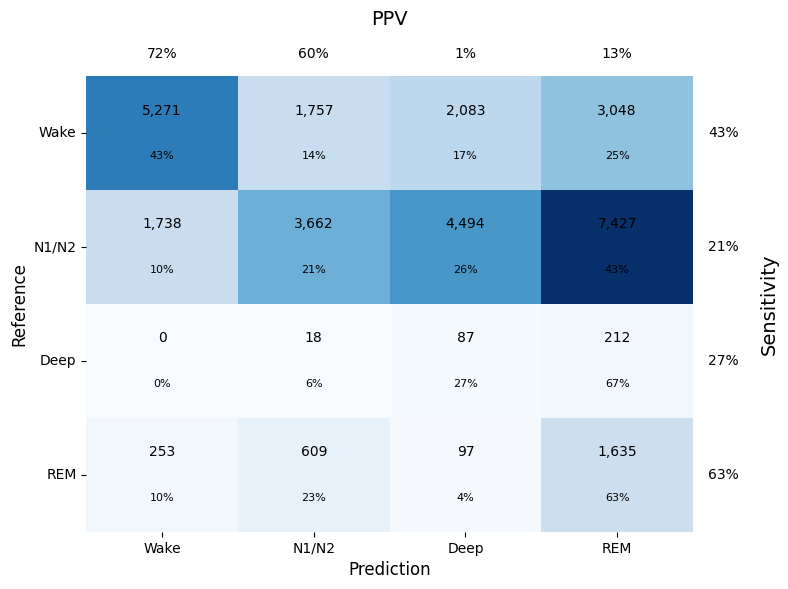

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model0.png
Done with loop 0


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:17<00:00,  5.92it/s, v_num=pua0, train_loss_step=1.390]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 21.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 21.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 21.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 20.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.07it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 12.90it/s]torch

Metric val_loss improved. New best score: 1.351


Epoch 1: 100%|██████████| 101/101 [00:16<00:00,  6.21it/s, v_num=pua0, train_loss_step=1.210, val_loss=1.350, val_acc=0.193, val_cohen_kappa=0.0439, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.46it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 11.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 11.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 11.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.94it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.025 >= min_delta = 0.0. New best score: 1.327


Epoch 2: 100%|██████████| 101/101 [00:16<00:00,  6.24it/s, v_num=pua0, train_loss_step=1.490, val_loss=1.330, val_acc=0.231, val_cohen_kappa=0.066, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 10.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 11.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 11.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.94it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.062 >= min_delta = 0.0. New best score: 1.265


Epoch 5: 100%|██████████| 101/101 [00:16<00:00,  6.03it/s, v_num=pua0, train_loss_step=1.360, val_loss=1.260, val_acc=0.255, val_cohen_kappa=0.109, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 11.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 11.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.99it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.257


Epoch 8: 100%|██████████| 101/101 [00:15<00:00,  6.54it/s, v_num=pua0, train_loss_step=1.340, val_loss=1.260, val_acc=0.256, val_cohen_kappa=0.116, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  5.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  7.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  8.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  9.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.20it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.016 >= min_delta = 0.0. New best score: 1.240


Epoch 9: 100%|██████████| 101/101 [00:15<00:00,  6.33it/s, v_num=pua0, train_loss_step=1.100, val_loss=1.240, val_acc=0.279, val_cohen_kappa=0.129, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 12.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 11.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 11.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.03it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.24it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 1.218


Epoch 13: 100%|██████████| 101/101 [00:19<00:00,  5.29it/s, v_num=pua0, train_loss_step=1.220, val_loss=1.220, val_acc=0.324, val_cohen_kappa=0.150, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  7.31it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  8.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  6.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.31it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  7.62it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 1.182


Epoch 16: 100%|██████████| 101/101 [00:18<00:00,  5.46it/s, v_num=pua0, train_loss_step=1.070, val_loss=1.180, val_acc=0.354, val_cohen_kappa=0.184, train_loss_epoch=1.210]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:04,  2.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  6.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  7.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  8.40it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  7.74it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.182. Signaling Trainer to stop.


Epoch 19: 100%|██████████| 101/101 [00:21<00:00,  4.79it/s, v_num=pua0, train_loss_step=1.130, val_loss=1.290, val_acc=0.324, val_cohen_kappa=0.159, train_loss_epoch=1.270]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▅▆▆▆▆▆▆████
train_loss_epoch,█▇▆▆▅▅▄▄▄▄▅▄▃▃▃▂▁▅▅▄
train_loss_step,▄▃▄▅▄▂▄█▃▄▄▁▆▅▄▂▃▅▄▅▃▃▃▃▃▂▂▂▄▂▂▂▄▃▂▂█▄▂▁
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇████
val_acc,▁▂▁▃▃▅▄▃▄▅▃█▆▅█▇█▅▆▆
val_cohen_kappa,▁▂▃▃▄▁▃▅▅▅▃▅▆▅▆█▇▄▇▇
val_loss,▆▅▆▅▃▅▅▃▃▃▅▄▂▄▅▁█▆▄▄
epoch,19
train_loss_epoch,1.2704
train_loss_step,1.13357
trainer/global_step,2019


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v31.ckpt
Trained model 1 in 395.80455136299133 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


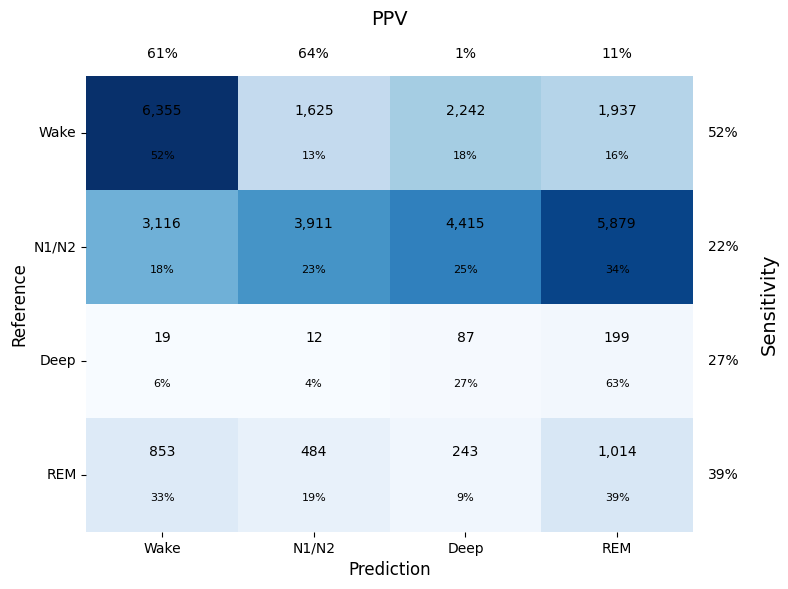

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model1.png
Done with loop 1


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:17<00:00,  5.66it/s, v_num=6m5v, train_loss_step=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:03,  3.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:02,  5.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  7.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 10.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.43it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 11.99it/s]torch

Metric val_loss improved. New best score: 1.463


Epoch 1: 100%|██████████| 101/101 [00:20<00:00,  4.82it/s, v_num=6m5v, train_loss_step=1.170, val_loss=1.460, val_acc=0.315, val_cohen_kappa=0.0845, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 21.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 21.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 22.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 15.47it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.32it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.36it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.083 >= min_delta = 0.0. New best score: 1.380


Epoch 2: 100%|██████████| 101/101 [00:19<00:00,  5.06it/s, v_num=6m5v, train_loss_step=1.410, val_loss=1.380, val_acc=0.260, val_cohen_kappa=0.0806, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 18.40it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 18.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 17.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 18.02it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 17.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 17.76it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 17.86it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.040 >= min_delta = 0.0. New best score: 1.341


Epoch 3: 100%|██████████| 101/101 [00:20<00:00,  5.00it/s, v_num=6m5v, train_loss_step=1.230, val_loss=1.340, val_acc=0.451, val_cohen_kappa=0.128, train_loss_epoch=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 23.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  8.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  5.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  6.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  7.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  9.03it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 1.303


Epoch 4: 100%|██████████| 101/101 [00:21<00:00,  4.80it/s, v_num=6m5v, train_loss_step=1.310, val_loss=1.300, val_acc=0.389, val_cohen_kappa=0.0815, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  9.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 10.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 10.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.85it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.293


Epoch 7: 100%|██████████| 101/101 [00:19<00:00,  5.31it/s, v_num=6m5v, train_loss_step=1.370, val_loss=1.290, val_acc=0.298, val_cohen_kappa=0.103, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 20.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 20.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 13.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.57it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.63it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  9.15it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 1.246


Epoch 8: 100%|██████████| 101/101 [00:22<00:00,  4.57it/s, v_num=6m5v, train_loss_step=1.160, val_loss=1.250, val_acc=0.419, val_cohen_kappa=0.157, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 17.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 19.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 20.56it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 10.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  8.18it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.006 >= min_delta = 0.0. New best score: 1.239


Epoch 9: 100%|██████████| 101/101 [00:21<00:00,  4.72it/s, v_num=6m5v, train_loss_step=0.999, val_loss=1.240, val_acc=0.519, val_cohen_kappa=0.204, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.43it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.43it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.68it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.007 >= min_delta = 0.0. New best score: 1.233


Epoch 10: 100%|██████████| 101/101 [00:22<00:00,  4.43it/s, v_num=6m5v, train_loss_step=1.070, val_loss=1.230, val_acc=0.468, val_cohen_kappa=0.210, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 23.07it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 19.41it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 20.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 19.35it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 20.31it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 19.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 19.78it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 1.198


Epoch 12: 100%|██████████| 101/101 [00:19<00:00,  5.07it/s, v_num=6m5v, train_loss_step=1.400, val_loss=1.200, val_acc=0.358, val_cohen_kappa=0.173, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  7.49it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 11.05it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  9.46it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  8.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  8.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  7.66it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.035 >= min_delta = 0.0. New best score: 1.164


Epoch 14: 100%|██████████| 101/101 [00:18<00:00,  5.38it/s, v_num=6m5v, train_loss_step=1.010, val_loss=1.160, val_acc=0.352, val_cohen_kappa=0.170, train_loss_epoch=1.190]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  6.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  9.02it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  7.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  9.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  8.92it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.063 >= min_delta = 0.0. New best score: 1.101


Epoch 17: 100%|██████████| 101/101 [00:18<00:00,  5.47it/s, v_num=6m5v, train_loss_step=1.070, val_loss=1.100, val_acc=0.318, val_cohen_kappa=0.168, train_loss_epoch=1.150]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 10.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 10.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01, 10.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 11.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 11.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.57it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.101. Signaling Trainer to stop.


Epoch 20: 100%|██████████| 101/101 [00:20<00:00,  4.96it/s, v_num=6m5v, train_loss_step=0.928, val_loss=1.180, val_acc=0.434, val_cohen_kappa=0.210, train_loss_epoch=1.110]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇██
train_loss_epoch,██▇▆▆▅▇▅▅▄▄▄▄▃▃▂▂▂▁▁▁
train_loss_step,█▅▅▅▅▅▄▆▆▄▄▃▆▆▄▂▅▄▄▅▃▄▄▄▂▅▇▇▂▃▄▄▄▆▃▁▃▃▆▃
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
val_acc,▃▁▆▄▁▃▂▅█▆▅▄▄▃▃▅▃▆█▆▆
val_cohen_kappa,▁▁▃▁▁▄▂▄▆▆▃▅▄▅▅▆▅▅██▆
val_loss,█▆▆▅▅▅▅▄▄▄▅▃▄▂▃▃▁▃▃▂▃
epoch,20
train_loss_epoch,1.10731
train_loss_step,0.92837
trainer/global_step,2120


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v32.ckpt
Trained model 2 in 473.5433723926544 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


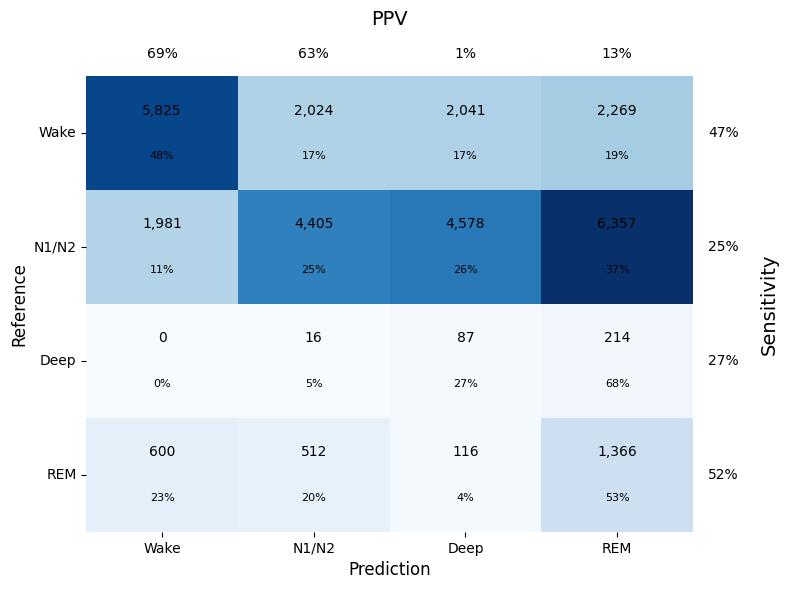

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model2.png
Done with loop 2


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:20<00:00,  4.94it/s, v_num=fmpm, train_loss_step=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.47it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 25.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 23.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 23.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.01it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 23.29it/s]torch

Metric val_loss improved. New best score: 1.349


Epoch 1: 100%|██████████| 101/101 [00:21<00:00,  4.69it/s, v_num=fmpm, train_loss_step=1.430, val_loss=1.350, val_acc=0.299, val_cohen_kappa=0.0945, train_loss_epoch=1.400]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 19.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 14.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 15.55it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 16.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 15.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.66it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.008 >= min_delta = 0.0. New best score: 1.341


Epoch 2: 100%|██████████| 101/101 [00:19<00:00,  5.07it/s, v_num=fmpm, train_loss_step=1.170, val_loss=1.340, val_acc=0.383, val_cohen_kappa=0.126, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  7.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  8.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 10.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  7.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:01,  7.97it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  8.83it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.322


Epoch 3: 100%|██████████| 101/101 [00:19<00:00,  5.10it/s, v_num=fmpm, train_loss_step=1.500, val_loss=1.320, val_acc=0.323, val_cohen_kappa=0.105, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 18.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 15.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 15.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.42it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 16.48it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 17.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 16.76it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.014 >= min_delta = 0.0. New best score: 1.308


Epoch 5: 100%|██████████| 101/101 [00:20<00:00,  4.86it/s, v_num=fmpm, train_loss_step=1.350, val_loss=1.310, val_acc=0.291, val_cohen_kappa=0.0878, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 18.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 17.32it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 16.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.17it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 16.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 16.98it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 17.20it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.034 >= min_delta = 0.0. New best score: 1.275


Epoch 7: 100%|██████████| 101/101 [00:18<00:00,  5.47it/s, v_num=fmpm, train_loss_step=1.180, val_loss=1.270, val_acc=0.245, val_cohen_kappa=0.0851, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 14.32it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 14.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 13.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 14.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 1.233


Epoch 8: 100%|██████████| 101/101 [00:17<00:00,  5.81it/s, v_num=fmpm, train_loss_step=1.710, val_loss=1.230, val_acc=0.236, val_cohen_kappa=0.111, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 12.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 13.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 13.35it/s]torch.Size([2, 192000, 3])

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.233. Signaling Trainer to stop.


Epoch 11: 100%|██████████| 101/101 [00:18<00:00,  5.34it/s, v_num=fmpm, train_loss_step=1.300, val_loss=1.430, val_acc=0.495, val_cohen_kappa=0.0142, train_loss_epoch=1.400]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▅▅▅▅▅▆▆▇▇▇▇▇▇▇██
train_loss_epoch,█▄▄▃▂▂▁▁▃█▇█
train_loss_step,█▆▇▆▅▃▅▅▇▄▃▃▃▇█▇▆▆▁▅▅▃▅▃▃▅▄▄▆▆▅▄▆▅▆▇▆▇▇▆
trainer/global_step,▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▆▆▆▆▆▇▇▇▇▇███
val_acc,▃▄▃▃▃▄▂▂▁█▂▆
val_cohen_kappa,▆█▇▃▆█▆▇▄▁▃▂
val_loss,▄▄▃▆▃▄▂▁█▆▅▆
epoch,11
train_loss_epoch,1.39819
train_loss_step,1.2991
trainer/global_step,1211


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v33.ckpt
Trained model 3 in 259.7528269290924 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


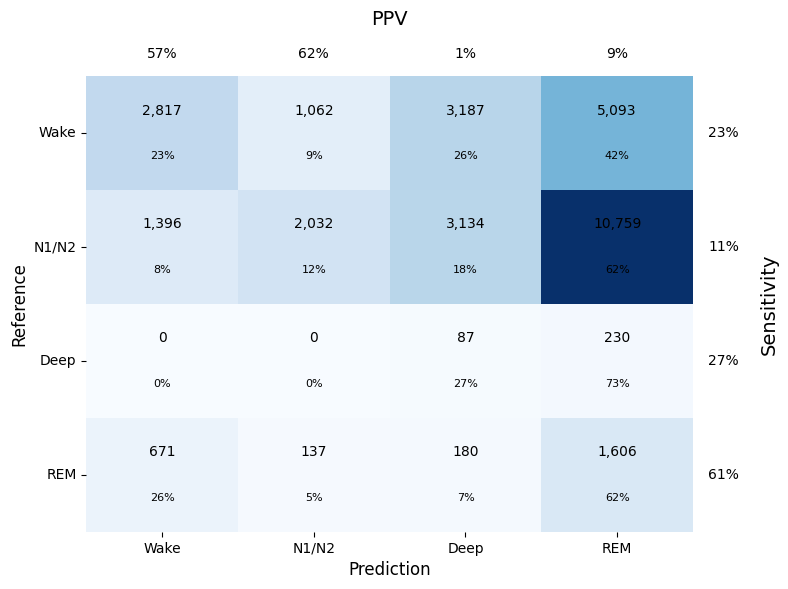

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model3.png
Done with loop 3


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:16<00:00,  5.97it/s, v_num=8gg1, train_loss_step=1.320]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 21.50it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 21.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 21.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 11.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.57it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 11.66it/s]torch

Metric val_loss improved. New best score: 1.434


Epoch 1: 100%|██████████| 101/101 [00:20<00:00,  4.97it/s, v_num=8gg1, train_loss_step=1.360, val_loss=1.430, val_acc=0.444, val_cohen_kappa=0.147, train_loss_epoch=1.380]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  9.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  6.88it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  7.34it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  8.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  9.50it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 10.34it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.032 >= min_delta = 0.0. New best score: 1.402


Epoch 2: 100%|██████████| 101/101 [00:19<00:00,  5.09it/s, v_num=8gg1, train_loss_step=1.330, val_loss=1.400, val_acc=0.503, val_cohen_kappa=0.0335, train_loss_epoch=1.430]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.71it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 21.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 21.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 21.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.53it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.019 >= min_delta = 0.0. New best score: 1.383


Epoch 4: 100%|██████████| 101/101 [00:21<00:00,  4.79it/s, v_num=8gg1, train_loss_step=1.310, val_loss=1.380, val_acc=0.498, val_cohen_kappa=0.0216, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 18.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 18.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 17.35it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 17.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 17.69it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 17.61it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 18.03it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.012 >= min_delta = 0.0. New best score: 1.372


Epoch 5: 100%|██████████| 101/101 [00:20<00:00,  4.83it/s, v_num=8gg1, train_loss_step=1.560, val_loss=1.370, val_acc=0.331, val_cohen_kappa=0.0973, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 11.33it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  8.88it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  7.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:01,  6.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:01<00:01,  6.87it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.372. Signaling Trainer to stop.


Epoch 8: 100%|██████████| 101/101 [00:17<00:00,  5.66it/s, v_num=8gg1, train_loss_step=1.470, val_loss=1.410, val_acc=0.491, val_cohen_kappa=-0.0552, train_loss_epoch=1.380]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▇▇███
train_loss_epoch,▂█▂▁▂▂▂▃▂
train_loss_step,▃▃▆▃▄▂▁▄▄▄▄▄▄▄▄▅▆▅▄▅▄▄█▃▄▃▄▄▃▄▆▃▃▄▃▄▄▄▄▃
trainer/global_step,▁▂▂▂▂▃▃▃▃▃▃▃▃▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█
val_acc,▆▇█▇▄▁▁▁▇
val_cohen_kappa,█▄▇▄▆▃▄▃▁
val_loss,█▄▅▂▁▅▄▄▆
epoch,8
train_loss_epoch,1.37887
train_loss_step,1.46802
trainer/global_step,908


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v34.ckpt
Trained model 4 in 191.20786786079407 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


/state/partition1/job-59945766/ipykernel_4186126/378665474.py:19: RuntimeWarning: invalid value encountered in divide
  ppv = np.diag(cm) / np.sum(cm, axis=0)


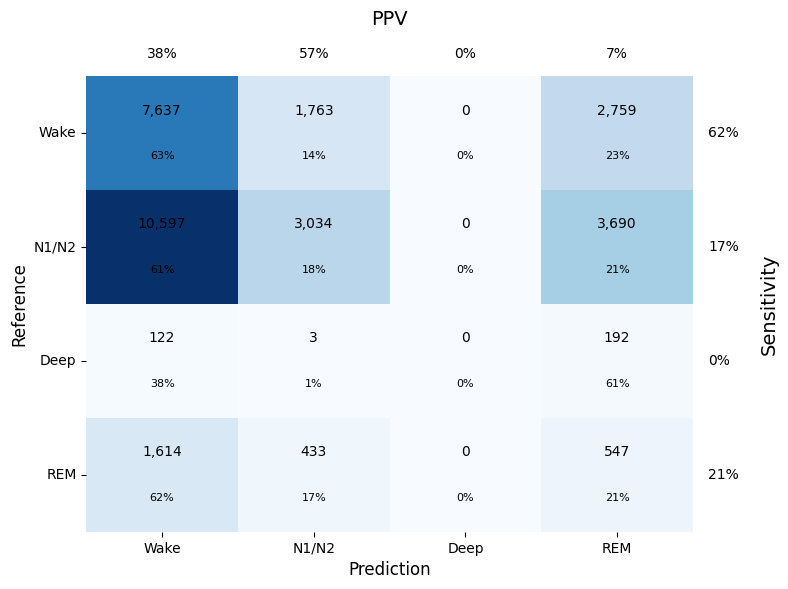

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model4.png
Done with loop 4


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:14<00:00,  6.81it/s, v_num=jr3w, train_loss_step=1.930]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.46it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.17it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.94it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 12.19it/s]torch

Metric val_loss improved. New best score: 1.489


Epoch 1: 100%|██████████| 101/101 [00:16<00:00,  6.31it/s, v_num=jr3w, train_loss_step=1.150, val_loss=1.490, val_acc=0.308, val_cohen_kappa=0.0429, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.43it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.26it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.46it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.114 >= min_delta = 0.0. New best score: 1.375


Epoch 2: 100%|██████████| 101/101 [00:15<00:00,  6.36it/s, v_num=jr3w, train_loss_step=1.330, val_loss=1.370, val_acc=0.239, val_cohen_kappa=0.075, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.48it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.29it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.45it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.059 >= min_delta = 0.0. New best score: 1.316


Epoch 3: 100%|██████████| 101/101 [00:16<00:00,  6.23it/s, v_num=jr3w, train_loss_step=1.350, val_loss=1.320, val_acc=0.327, val_cohen_kappa=0.0938, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.47it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.009 >= min_delta = 0.0. New best score: 1.306


Epoch 4: 100%|██████████| 101/101 [00:15<00:00,  6.48it/s, v_num=jr3w, train_loss_step=1.290, val_loss=1.310, val_acc=0.280, val_cohen_kappa=0.0987, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01, 11.48it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 13.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.77it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 1.283


Epoch 5: 100%|██████████| 101/101 [00:17<00:00,  5.65it/s, v_num=jr3w, train_loss_step=1.280, val_loss=1.280, val_acc=0.320, val_cohen_kappa=0.106, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 13.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01, 11.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 12.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 12.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 12.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.70it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.50it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 1.279


Epoch 6: 100%|██████████| 101/101 [00:19<00:00,  5.16it/s, v_num=jr3w, train_loss_step=1.370, val_loss=1.280, val_acc=0.279, val_cohen_kappa=0.106, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:02,  6.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  9.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 11.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 13.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  9.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 10.59it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.023 >= min_delta = 0.0. New best score: 1.256


Epoch 7: 100%|██████████| 101/101 [00:18<00:00,  5.53it/s, v_num=jr3w, train_loss_step=1.290, val_loss=1.260, val_acc=0.254, val_cohen_kappa=0.0985, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  9.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 12.99it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 14.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  8.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00,  9.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  9.38it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.011 >= min_delta = 0.0. New best score: 1.245


Epoch 8: 100%|██████████| 101/101 [00:20<00:00,  4.92it/s, v_num=jr3w, train_loss_step=1.270, val_loss=1.250, val_acc=0.336, val_cohen_kappa=0.153, train_loss_epoch=1.280]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  7.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  8.56it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  7.41it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  6.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  6.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:01,  6.50it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  7.19it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.004 >= min_delta = 0.0. New best score: 1.241


Epoch 10: 100%|██████████| 101/101 [00:20<00:00,  4.87it/s, v_num=jr3w, train_loss_step=1.160, val_loss=1.240, val_acc=0.394, val_cohen_kappa=0.147, train_loss_epoch=1.240]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  9.50it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  9.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  7.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  8.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00,  9.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 10.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 11.43it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.047 >= min_delta = 0.0. New best score: 1.194


Epoch 12: 100%|██████████| 101/101 [00:20<00:00,  4.87it/s, v_num=jr3w, train_loss_step=1.010, val_loss=1.190, val_acc=0.435, val_cohen_kappa=0.223, train_loss_epoch=1.220]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:03,  3.79it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  6.42it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01,  6.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:01,  6.05it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:01,  6.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:01,  7.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00,  8.36it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.055 >= min_delta = 0.0. New best score: 1.139


Epoch 14: 100%|██████████| 101/101 [00:19<00:00,  5.13it/s, v_num=jr3w, train_loss_step=1.320, val_loss=1.140, val_acc=0.466, val_cohen_kappa=0.252, train_loss_epoch=1.180]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:01,  6.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:01,  8.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:01, 10.02it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 10.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 11.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 12.02it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 12.65it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.031 >= min_delta = 0.0. New best score: 1.108


Epoch 18: 100%|██████████| 101/101 [00:20<00:00,  4.86it/s, v_num=jr3w, train_loss_step=0.976, val_loss=1.110, val_acc=0.348, val_cohen_kappa=0.194, train_loss_epoch=1.140]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 17.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 19.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 17.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 17.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 18.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 14.28it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 1.071


Epoch 21: 100%|██████████| 101/101 [00:10<00:00,  9.30it/s, v_num=jr3w, train_loss_step=1.040, val_loss=1.070, val_acc=0.526, val_cohen_kappa=0.279, train_loss_epoch=1.080]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.58it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 22.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 22.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.14it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.62it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.071. Signaling Trainer to stop.


Epoch 24: 100%|██████████| 101/101 [00:12<00:00,  8.30it/s, v_num=jr3w, train_loss_step=1.150, val_loss=1.120, val_acc=0.468, val_cohen_kappa=0.249, train_loss_epoch=1.080]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▆▆▇▇█████
train_loss_epoch,██▇▆▆▆▆▆▅▅▅▄▄▃▃▃▃▂▂▁▁▁▁▁▁
train_loss_step,▅▅▃▅▅▃▇▃▄▃▃▄▆▂▄▃▅█▄█▄▃▆▄▃█▂▄▄▃▁▄▁▂▂▂▂█▃▄
trainer/global_step,▁▁▁▂▂▂▂▂▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇██
val_acc,▂▁▃▂▃▂▁▃▅▄▂▅█▅▃▄▄▃▄▇▇▅▆▆▆
val_cohen_kappa,▁▂▂▃▃▃▃▄▅▄▂▆▆▇▄▅▅▅▅██▆▇▇▇
val_loss,█▆▅▅▅▄▄▄▄▄▅▃▄▂▃▃▃▂▂▂▁▃▂▂▂
epoch,24
train_loss_epoch,1.08442
train_loss_step,1.14694
trainer/global_step,2524


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v35.ckpt
Trained model 5 in 491.7470154762268 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


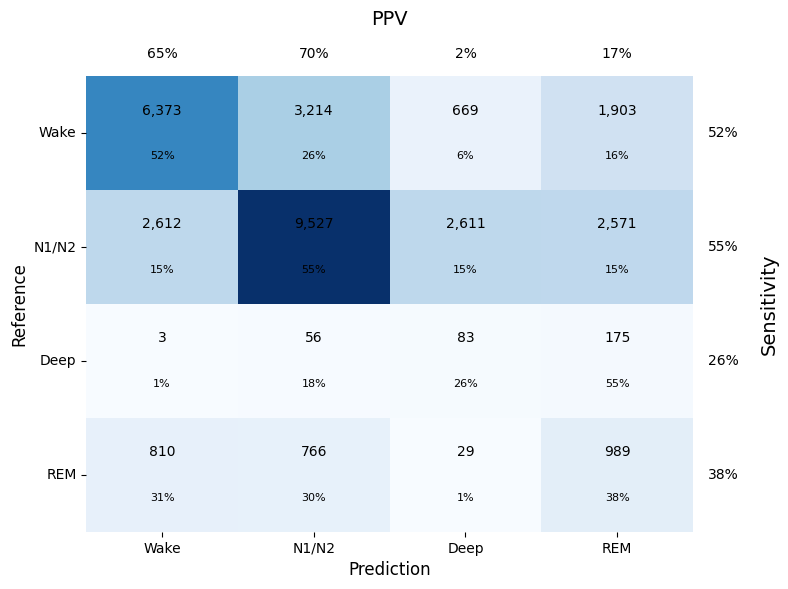

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model5.png
Done with loop 5


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:10<00:00,  9.72it/s, v_num=wdaq, train_loss_step=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.23it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.07it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 22.39it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.93it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.61it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.36it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 22.09it/s]torch

Metric val_loss improved. New best score: 1.415


Epoch 1: 100%|██████████| 101/101 [00:10<00:00,  9.21it/s, v_num=wdaq, train_loss_step=1.350, val_loss=1.410, val_acc=0.297, val_cohen_kappa=0.0681, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 24.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.99it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.133 >= min_delta = 0.0. New best score: 1.282


Epoch 2: 100%|██████████| 101/101 [00:10<00:00,  9.22it/s, v_num=wdaq, train_loss_step=1.260, val_loss=1.280, val_acc=0.234, val_cohen_kappa=0.0974, train_loss_epoch=1.330]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 24.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 24.46it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 23.28it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.78it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 24.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.64it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.003 >= min_delta = 0.0. New best score: 1.279


Epoch 6: 100%|██████████| 101/101 [00:10<00:00,  9.34it/s, v_num=wdaq, train_loss_step=1.470, val_loss=1.280, val_acc=0.261, val_cohen_kappa=0.0742, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 22.41it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 24.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 23.00it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.81it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.279. Signaling Trainer to stop.


Epoch 9: 100%|██████████| 101/101 [00:12<00:00,  8.38it/s, v_num=wdaq, train_loss_step=1.240, val_loss=1.330, val_acc=0.545, val_cohen_kappa=0.180, train_loss_epoch=1.320]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▄▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▇▇▇▇▇████
train_loss_epoch,█▆▅▃▃▁▃▁▄▅
train_loss_step,▇█▅▆▃▆▅▃█▃▅▄▄▅▆▄▅▄▂▄▆▃▄▄▆▁▅▂▃▇▄▃▅▇▆▅▄▅▄▇
trainer/global_step,▁▁▁▁▁▁▂▂▂▂▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇████
val_acc,▂▁▃▃▂▂▁▄█▇
val_cohen_kappa,▁▃▅▂▄▁▄█▆█
val_loss,█▁▁█▂▁▁▂▅▃
epoch,9
train_loss_epoch,1.32286
train_loss_step,1.24101
trainer/global_step,1009


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v36.ckpt
Trained model 6 in 124.02143692970276 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


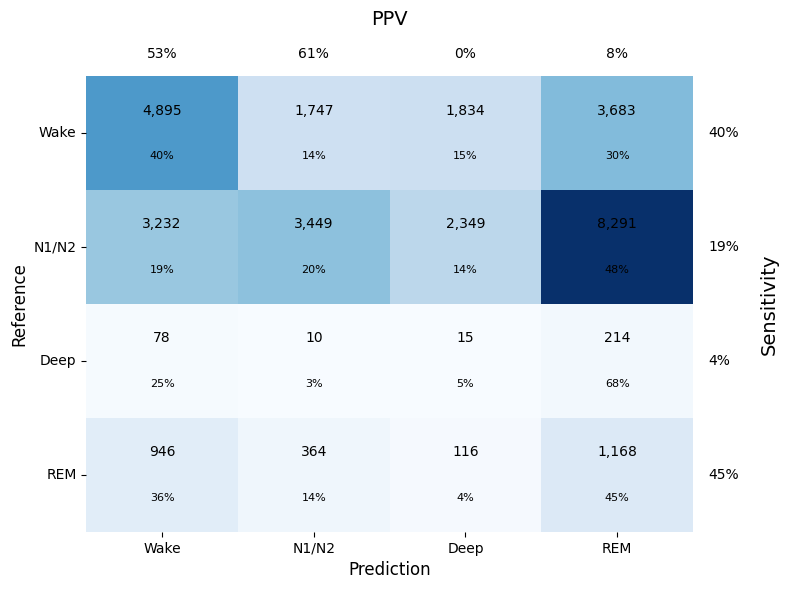

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model6.png
Done with loop 6


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:10<00:00,  9.79it/s, v_num=3m34, train_loss_step=1.070]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 23.75it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.37it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.85it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 22.69it/s]torch

Metric val_loss improved. New best score: 1.393


Epoch 1: 100%|██████████| 101/101 [00:10<00:00,  9.31it/s, v_num=3m34, train_loss_step=1.290, val_loss=1.390, val_acc=0.498, val_cohen_kappa=0.152, train_loss_epoch=1.350]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.50it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 24.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 23.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 21.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.34it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.048 >= min_delta = 0.0. New best score: 1.345


Epoch 2: 100%|██████████| 101/101 [00:10<00:00,  9.33it/s, v_num=3m34, train_loss_step=1.660, val_loss=1.350, val_acc=0.421, val_cohen_kappa=0.154, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 22.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 22.98it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 21.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.64it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.65it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.51it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.335


Epoch 4: 100%|██████████| 101/101 [00:11<00:00,  9.17it/s, v_num=3m34, train_loss_step=1.300, val_loss=1.330, val_acc=0.283, val_cohen_kappa=0.0916, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 21.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.30it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.20it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.27it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.30it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.043 >= min_delta = 0.0. New best score: 1.292


Epoch 5: 100%|██████████| 101/101 [00:10<00:00,  9.24it/s, v_num=3m34, train_loss_step=1.490, val_loss=1.290, val_acc=0.288, val_cohen_kappa=0.102, train_loss_epoch=1.300]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.16it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.12it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 24.77it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.09it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.71it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.037 >= min_delta = 0.0. New best score: 1.255


Epoch 7: 100%|██████████| 101/101 [00:10<00:00,  9.26it/s, v_num=3m34, train_loss_step=1.310, val_loss=1.250, val_acc=0.275, val_cohen_kappa=0.137, train_loss_epoch=1.270]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 23.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 22.11it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.02it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 21.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.52it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 1.227


Epoch 8: 100%|██████████| 101/101 [00:10<00:00,  9.30it/s, v_num=3m34, train_loss_step=1.140, val_loss=1.230, val_acc=0.312, val_cohen_kappa=0.146, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.06it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.35it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.63it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.14it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.001 >= min_delta = 0.0. New best score: 1.226


Epoch 9: 100%|██████████| 101/101 [00:10<00:00,  9.32it/s, v_num=3m34, train_loss_step=1.250, val_loss=1.230, val_acc=0.284, val_cohen_kappa=0.136, train_loss_epoch=1.250]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.22it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 23.19it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 22.42it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.25it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.01it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 23.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.88it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.028 >= min_delta = 0.0. New best score: 1.198


Epoch 11: 100%|██████████| 101/101 [00:10<00:00,  9.38it/s, v_num=3m34, train_loss_step=1.210, val_loss=1.200, val_acc=0.280, val_cohen_kappa=0.163, train_loss_epoch=1.230]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.50it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 24.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 24.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 24.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 23.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.97it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.042 >= min_delta = 0.0. New best score: 1.156


Epoch 13: 100%|██████████| 101/101 [00:10<00:00,  9.27it/s, v_num=3m34, train_loss_step=1.620, val_loss=1.160, val_acc=0.351, val_cohen_kappa=0.153, train_loss_epoch=1.190]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 25.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.47it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 24.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 24.61it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 24.47it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 24.04it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 24.10it/s]torch.Size([2, 192000, 3]

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.156. Signaling Trainer to stop.


Epoch 16: 100%|██████████| 101/101 [00:12<00:00,  8.37it/s, v_num=3m34, train_loss_step=0.917, val_loss=1.180, val_acc=0.391, val_cohen_kappa=0.208, train_loss_epoch=1.120]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▁▁▁▂▂▂▂▃▃▃▃▃▃▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇██
train_loss_epoch,██▇▇▆▆▅▅▅▅▄▄▃▃▃▂▁
train_loss_step,▅▄▇▅▅▅▆▄▅▄▅▅▅▃▃▂▅▄▄▂█▄▆▇▃▁▃▃█▄▆▄▅▁▄▃▃▃▁▂
trainer/global_step,▁▁▁▁▂▂▂▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▃▃▄▄▄▅▅▅▆▆▆▇▇▇▇███
val_acc,▇▅▂▁▁▃▁▂▁▂▁▃▃▄█▂▄
val_cohen_kappa,▅▅▁▁▂▄▄▄▄▄▅▅▅█▆▅█
val_loss,█▇▇▆▅▅▄▃▃▄▂▂▁▂▃▂▂
epoch,16
train_loss_epoch,1.12199
train_loss_step,0.91727
trainer/global_step,1716


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v37.ckpt
Trained model 7 in 210.27326560020447 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


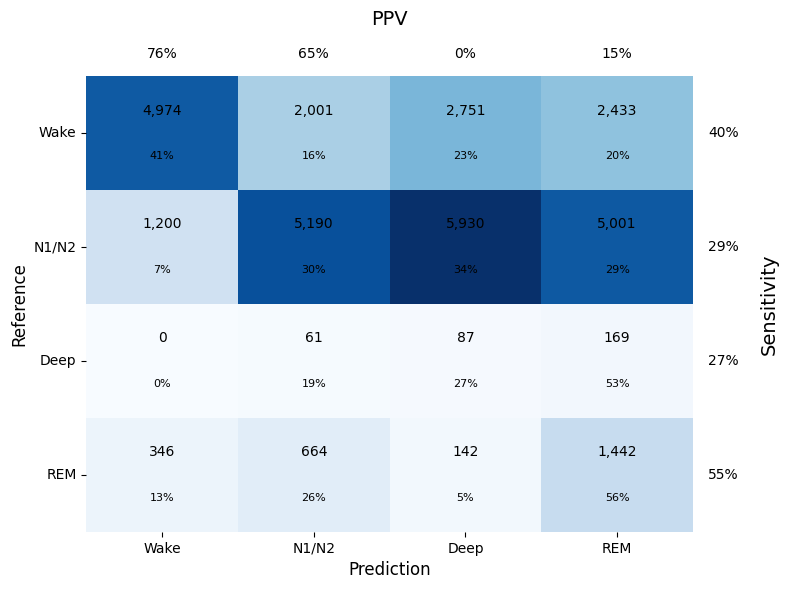

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model7.png
Done with loop 7


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:10<00:00,  9.81it/s, v_num=bacp, train_loss_step=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.62it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.68it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 23.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.73it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 23.17it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.80it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 23.02it/s]torch

Metric val_loss improved. New best score: 1.339


Epoch 1: 100%|██████████| 101/101 [00:10<00:00,  9.30it/s, v_num=bacp, train_loss_step=1.320, val_loss=1.340, val_acc=0.239, val_cohen_kappa=0.0416, train_loss_epoch=1.360]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.86it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 25.60it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.84it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 22.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.24it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.74it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.14it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.027 >= min_delta = 0.0. New best score: 1.313


Epoch 4: 100%|██████████| 101/101 [00:10<00:00,  9.35it/s, v_num=bacp, train_loss_step=1.290, val_loss=1.310, val_acc=0.319, val_cohen_kappa=0.111, train_loss_epoch=1.310]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.66it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 21.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 21.87it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 21.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 22.30it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.21it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.68it/s]torch.Size([2, 192000, 3])

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.313. Signaling Trainer to stop.


Epoch 7: 100%|██████████| 101/101 [00:12<00:00,  8.37it/s, v_num=bacp, train_loss_step=1.350, val_loss=1.360, val_acc=0.612, val_cohen_kappa=0.0025, train_loss_epoch=1.380]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▁▁▁▁▁▂▂▂▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇████
train_loss_epoch,▆▁▅▁▅▇██
train_loss_step,▃▃▃▃▃▄▆▃▃▄▃▂▂▃▄▂▃▄▃▂▄▃▃▁█▁▃▄▃▂▄▃▃▄▄▄▃▃▃▄
trainer/global_step,▁▁▁▁▁▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇█
val_acc,▃▃▄▄▁▅▁█
val_cohen_kappa,▄▂▆█▄▁▁▂
val_loss,▁█▁▁▁▁▂▁
epoch,7
train_loss_epoch,1.37849
train_loss_step,1.34592
trainer/global_step,807


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v38.ckpt
Trained model 8 in 99.04508948326111 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


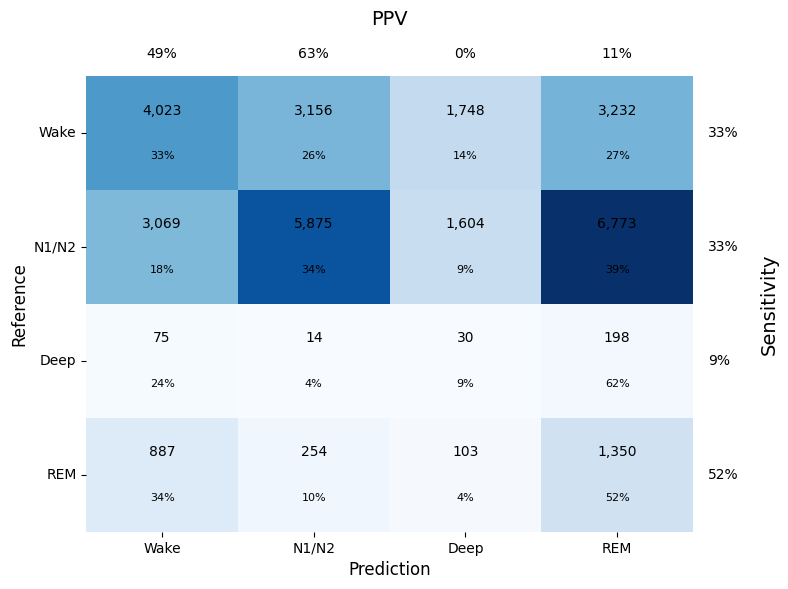

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model8.png
Done with loop 8


/ext3/miniforge3/lib/python3.12/site-packages/pytorch_lightning/callbacks/model_checkpoint.py:654: Checkpoint directory /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/ext3/miniforge3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(

  | Name            | Type                 | Params | Mode 
-----------------------------------------------------------------
0 | acc_processing  | DeepACTINeT          | 164 K  | train
1 | embeddingLayer  | Linear               | 48     | train
2 | dropout_embed   | Dropout              | 0      | train
3 | dropout_hidden2 | Dropout              | 0      | train
4 | rnn             | LSTM                 | 8.5 M  | train
5 | hidden2         | Linear               | 32.8 K | train
6 | classifier      | Linear               | 132    | train
7 | t

Epoch 0: 100%|██████████| 101/101 [00:10<00:00,  9.76it/s, v_num=i7fw, train_loss_step=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.55it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 24.54it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 23.55it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.06it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.95it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 23.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  57%|█████▋    | 8/14 [00:00<00:00, 23.55it/s]torch

Metric val_loss improved. New best score: 1.397


Epoch 1: 100%|██████████| 101/101 [00:10<00:00,  9.27it/s, v_num=i7fw, train_loss_step=1.180, val_loss=1.400, val_acc=0.561, val_cohen_kappa=0.190, train_loss_epoch=1.370]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.96it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 24.63it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 23.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 24.10it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 23.38it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 23.06it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 22.82it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.078 >= min_delta = 0.0. New best score: 1.319


Epoch 2: 100%|██████████| 101/101 [00:10<00:00,  9.19it/s, v_num=i7fw, train_loss_step=1.770, val_loss=1.320, val_acc=0.345, val_cohen_kappa=0.112, train_loss_epoch=1.340]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 24.92it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 24.72it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 22.45it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 21.81it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 21.67it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 22.01it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 21.70it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.022 >= min_delta = 0.0. New best score: 1.297


Epoch 4: 100%|██████████| 101/101 [00:14<00:00,  7.11it/s, v_num=i7fw, train_loss_step=1.290, val_loss=1.300, val_acc=0.262, val_cohen_kappa=0.0875, train_loss_epoch=1.290]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 17.15it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 16.91it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 16.42it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.30it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 16.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 16.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 16.59it/s]torch.Size([2, 192000, 3]

Metric val_loss improved by 0.069 >= min_delta = 0.0. New best score: 1.228


Epoch 7: 100%|██████████| 101/101 [00:13<00:00,  7.32it/s, v_num=i7fw, train_loss_step=1.470, val_loss=1.230, val_acc=0.354, val_cohen_kappa=0.141, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 18.18it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 16.82it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 17.05it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.51it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 16.59it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 16.53it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 16.65it/s]torch.Size([2, 192000, 3])

Metric val_loss improved by 0.010 >= min_delta = 0.0. New best score: 1.218


Epoch 8: 100%|██████████| 101/101 [00:13<00:00,  7.27it/s, v_num=i7fw, train_loss_step=1.250, val_loss=1.220, val_acc=0.261, val_cohen_kappa=0.125, train_loss_epoch=1.260]
Validation: |          | 0/? [00:00<?, ?it/s]
Validation DataLoader 0:   0%|          | 0/14 [00:00<?, ?it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:   7%|▋         | 1/14 [00:00<00:00, 17.52it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  14%|█▍        | 2/14 [00:00<00:00, 17.44it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  21%|██▏       | 3/14 [00:00<00:00, 17.13it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  29%|██▊       | 4/14 [00:00<00:00, 16.83it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  36%|███▌      | 5/14 [00:00<00:00, 16.89it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  43%|████▎     | 6/14 [00:00<00:00, 16.90it/s]torch.Size([2, 192000, 3])

Validation DataLoader 0:  50%|█████     | 7/14 [00:00<00:00, 16.94it/s]torch.Size([2, 192000, 3])

Monitored metric val_loss did not improve in the last 4 records. Best score: 1.218. Signaling Trainer to stop.


Epoch 11: 100%|██████████| 101/101 [00:15<00:00,  6.46it/s, v_num=i7fw, train_loss_step=1.210, val_loss=1.260, val_acc=0.259, val_cohen_kappa=0.0952, train_loss_epoch=1.260]


wandb: ERROR The nbformat package was not found. It is required to save notebook history.


epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▆▆▆▆▇▇▇▇▇▇█
train_loss_epoch,█▆▃▃▂▃▁▁▃▃▃▂
train_loss_step,▄▂▄▃▄▃▄▃▃▃▃▄▁▅▄▂▂▃▅▂▄▃█▄▂▂▂▄▁▁▄▂▃▃▅▄▃▃▅▃
trainer/global_step,▁▁▁▁▂▂▂▃▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▇▇▇▇█████
val_acc,▇▃▁▂▁▃▃▂▅█▃▂
val_cohen_kappa,█▃▁▂▁▃▅▄█▄▄▂
val_loss,█▅▅▄█▅▁▁▂▇▃▃
epoch,11
train_loss_epoch,1.26422
train_loss_step,1.20737
trainer/global_step,1211


Best model path: /scratch/npr264/BioDeepL/project/checkpoints/ActiNetLSTM/loss/best-checkpoint-v39.ckpt
Trained model 9 in 181.4590404033661 seconds
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([2, 192000, 3])
torch.Size([1, 192000, 3])


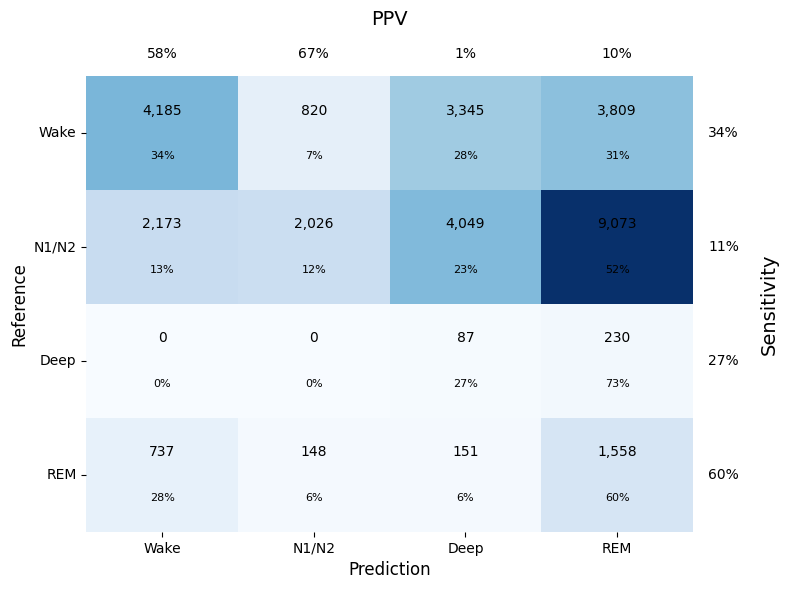

Figure saved to /home/npr264/DeepLearning/project/cleaned/figures/ActiNetLSTM/cms/cm_model9.png
Done with loop 9


In [24]:
accs = []
kappas = []
aurocs = []
cms = []
train_times = []
test_times = []
for i in range(10):
    model, train_time = train_model(
        batch_size = batch_size,
        dropout_embed = dropout_embed,
        acc_preprocess = acc_preprocess,
        RNN_type = RNN_type,
        lr = lr,
        rnn_hidden_size = rnn_hidden_size,
        pre_rnn_size = pre_rnn_size,
        hidden_size2 = hidden_size2,
        dropout_rnn = dropout_rnn,
        dropout_hidden2 = dropout_hidden2,
        modelType = modelType,
        nameAppend = f"model{i}")
    print(f"Trained model {i} in {train_time} seconds")
    acc, kappa, auroc, cm, inference_time_seconds = evaluate_model(model, test_loader, modelType, i)
    accs.append(acc)
    kappas.append(kappa)
    aurocs.append(auroc)
    cms.append(cms)
    train_times.append(train_time)
    test_times.append(inference_time_seconds)
    print(f"Done with loop {i}")

In [25]:
acc_mean, acc_std = np.mean(accs), np.std(accs)
kappa_mean, kappa_std = np.mean(kappas), np.std(kappas)
auroc_mean, auroc_std = np.mean(aurocs), np.std(aurocs)
train_time_mean, train_time_std = np.mean(train_times), np.std(train_times)
test_time_mean, test_time_std = np.mean(test_times), np.std(test_times)

# Print the statistics
print(f"Accuracy: Mean = {acc_mean:.3f}, StdDev = {acc_std:.3f}")
print(f"Kappa: Mean = {kappa_mean:.3f}, StdDev = {kappa_std:.3f}")
print(f"AUROC: Mean = {auroc_mean:.3f}, StdDev = {auroc_std:.3f}")

# Find the index of the best kappa
best_kappa_index = np.argmax(kappas)
print(f"Best Kappa Index: {best_kappa_index}")

# Find the index of the best acc
best_acc_index = np.argmax(accs)
print(f"Best Accuracy Index: {best_acc_index}")

# Find the index of the best AUROC
best_auroc_index = np.argmax(aurocs)
print(f"Best AUROC Index: {best_auroc_index}")

Accuracy: Mean = 0.336, StdDev = 0.081
Kappa: Mean = 0.122, StdDev = 0.066
AUROC: Mean = 0.573, StdDev = 0.055
Best Kappa Index: 5
Best Accuracy Index: 5
Best AUROC Index: 5
